# Import packages

[1 Preprocess](#Preprocess)

[2 Panel Regression Analysis](#Panel-Regression-Analysis)

----[2.1 Distribution Histogram](#Distribution-Histogram)

----[2.2 Fixed Effect Panel Regression](#Fixed-Effect-Panel-Regression)

----[2.3 Fixed Effect Panel Regression(after filtered)](#Fixed-Effect-Panel-Regression-2)

----[3 Time Series Analysis Result](#Time-Series-Analysis-Result)

[4 NMR Map](#NMR-Map)

[5 Disaster Map (Only for display, used maps are created by ArcGIS)](#Disaster-Map)

[6 XGBoost Results](#XGBoost)

----[6.1 Results of XGBoost Flood](#Results-of-XGBoost-Flood)

----[6.2 Results of XGBoost Hurricane](#Results-of-XGBoost-Hurricane)

----[6.3 Results of XGBoost Wildfire](#Results-of-XGBoost-Wildfire)

----[6.4 Results of XGBoost Tornado](#Results-of-XGBoost-Tornado)

[7 Regression](#Regression)

----[7.1 Regression for Flood](#Regression-for-Flood)

----[7.2 Regression for Hurricane](#Regression-for-Hurricane)

----[7.3 Regression for Tornado](#Regression-for-Tornado)

----[7.4 Regression for Wildfire](#Regression-for-Wildfire)

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import contextily as cx
import xgboost as xgb
import shap
import statsmodels.api as sm
import matplotlib.colors as mcolors
from scipy.stats import pearsonr, spearmanr
from scipy.stats import ttest_ind
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import RobustScaler
from linearmodels.panel import PanelOLS,compare
from linearmodels import RandomEffects
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Preprocess

### Add SHELDUS, Census, PEP, SVI, and NRI (FEMA Disaster Index) data

In [2]:
data_path = r"F:/LongMig2025/data/"
SHELDUS = pd.read_csv(data_path + "SHELDUS/ORIGINAL.csv")
state   = gpd.read_file(data_path + "Census/usstate/cb_2018_us_state_500k.shp").to_crs('ESRI:102003')
county  = gpd.read_file(data_path + "Census/maincounty/us_conu_county.shp").to_crs('ESRI:102003')
df_pep_2010 = pd.read_csv(data_path + "PEP/co-est2010-alldata.csv", encoding='latin-1')
df_pep_2020 = pd.read_csv(data_path + "PEP/co-est2020-alldata.csv", encoding='latin-1')
SVI_10  = pd.read_csv(data_path + "SVI/SVI_2010_US_county.csv")
SVI_10['FIPS'] = SVI_10['FIPS'].astype("str").str.rjust(5,"0")
state   = state[~state["NAME"].isin(["Alaska","Hawaii","Puerto Rico",
                                   "American Samoa","United States Virgin Islands",
                                   "Guam","Commonwealth of the Northern Mariana Islands"])]
NRI     = pd.read_csv(data_path + "NRI/NRI_Table_Counties/NRI_Table_Counties.csv")

### Add Employment data, Population Density data, Amenity Scale, and House Price data

In [3]:
# Employment = pd.read_csv(data_path + "Unemployment.csv")
PopDensity = pd.read_csv(data_path + "POPDen/2010/PopDensity2010.csv")
# HPI        = pd.read_csv(data_path + "HPI/hpi_master.csv")
# house_price= pd.read_csv(data_path + "Zillow/County_zhvi_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv")
MedianHouseValue2000 = pd.read_csv(data_path + "MedianHouseValue/DECENNIALSF32000.H076-Data.csv")
MedianHouseValue2020 = pd.read_csv(data_path + "MedianHouseValue/ACSDT5Y2020.B25077-Data.csv")
MedianHouseholdIncome2000 = pd.read_csv(data_path + "MedianHouseValue/nhgis0011_csv/nhgis0011_csv/nhgis0011_ds151_2000_county1.csv")
MedianHouseholdIncome2020 = pd.read_csv(data_path + "MedianHouseValue/ACSDT5Y2020.B19013_2025-05-07T200431/ACSDT5Y2020.B19013-Data1.csv")
# GDP        = pd.read_csv(data_path + "GDP/CAGDP1_ALL_AREAS_2001_2023.csv",  encoding='latin1')
# TJan    = pd.read_csv(data_path + "PRISM/Tmean_Jan_All.csv")
# TJuly   = pd.read_csv(data_path + "PRISM/Tmean_July_All.csv")
Amenity = pd.read_csv(data_path + "Amenity/amenity.csv")
HAI     = pd.read_csv(data_path + "LAI/HAI_W.csv")
# LAI     = pd.read_csv(data_path + "LAI/LAI.csv")

### Process of PEP data

In [4]:
df_pep_2010["state"] = df_pep_2010["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2010["county"] = df_pep_2010["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2010["FIPS"] = df_pep_2010["state"] + df_pep_2010["county"]

df_pep_2020["state"] = df_pep_2020["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2020["county"] = df_pep_2020["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2020["FIPS"] = df_pep_2020["state"] + df_pep_2020["county"]

In [5]:
df_pep_0120 = pd.merge(df_pep_2010,df_pep_2020,on="FIPS")

### Process of Pop Density

In [6]:
PopDensity_CONUS = PopDensity[~(PopDensity["STATE"] == 2)]
PopDensity_CONUS = PopDensity_CONUS[~(PopDensity_CONUS["STATE"] == 15)]
PopDensity_CONUS["FIPS"] = PopDensity_CONUS['GEOID10'].astype(str).str.rjust(5,"0")
PopDensity_CONUS_sel = PopDensity_CONUS[["FIPS","POPDENS10"]]

### Process of House Price

## Process of Median House Value

In [7]:
MedianHouseValue2000["FIPS"] = MedianHouseValue2000["GEO_ID"].str[-5:]
MedianHouseValue2000["FIPS"]  = MedianHouseValue2000["FIPS"].astype(str).str.rjust(5,"0")
MedianHouseValue2000["H076001"] = pd.to_numeric(MedianHouseValue2000["H076001"], errors='coerce')
# CPI for 2000 = 172.2, CPI for 2020 = 258.811
cpi_2000 = 172.2
cpi_2020 = 258.811
adjustment_factor = cpi_2020 / cpi_2000
MedianHouseValue2000["MedianHouseValue2000(adjusted)"] = (
    MedianHouseValue2000["H076001"] * adjustment_factor
).round(0)
MedianHouseValue2000 = MedianHouseValue2000[["FIPS","MedianHouseValue2000(adjusted)"]]

In [8]:
MedianHouseValue2020["FIPS"] = MedianHouseValue2020["GEO_ID"].str[-5:]
MedianHouseValue2020["FIPS"]  = MedianHouseValue2020["FIPS"].astype(str).str.rjust(5,"0")
MedianHouseValue2020["MedianHouseValue2020"] = MedianHouseValue2020["B25077_001E"]
MedianHouseValue2020["MedianHouseValue2020"] = pd.to_numeric(MedianHouseValue2020["MedianHouseValue2020"], errors='coerce')
MedianHouseValue2020 = MedianHouseValue2020[["FIPS","MedianHouseValue2020"]]

In [9]:
MedianHouseValue = pd.merge(MedianHouseValue2000,MedianHouseValue2020,on="FIPS")
MedianHouseValue["ratiochange"] = (MedianHouseValue["MedianHouseValue2020"]-MedianHouseValue["MedianHouseValue2000(adjusted)"])/MedianHouseValue["MedianHouseValue2000(adjusted)"]*100

In [10]:
MedianHouseholdIncome2000["State"] = MedianHouseholdIncome2000["STATEA"].astype(str).str.rjust(2,"0")
MedianHouseholdIncome2000["County"] = MedianHouseholdIncome2000["COUNTYA"].astype(str).str.rjust(3,"0")
MedianHouseholdIncome2000["FIPS"] = MedianHouseholdIncome2000["State"]+MedianHouseholdIncome2000["County"]
MedianHouseholdIncome2000["FIPS"]  = MedianHouseholdIncome2000["FIPS"].astype(str).str.rjust(5,"0")
MedianHouseholdIncome2000["GMY001"] = pd.to_numeric(MedianHouseholdIncome2000["GMY001"], errors='coerce')
# CPI for 2000 = 172.2, CPI for 2020 = 258.811
cpi_2000 = 172.2
cpi_2020 = 258.811
adjustment_factor = cpi_2020 / cpi_2000
MedianHouseholdIncome2000["MedianHouseholdIncome2000(adjusted)"] = (
    MedianHouseholdIncome2000["GMY001"] * adjustment_factor
).round(0)
MedianHouseholdIncome2000 = MedianHouseholdIncome2000[["FIPS","MedianHouseholdIncome2000(adjusted)"]]

In [11]:
MedianHouseholdIncome2020["FIPS"] = MedianHouseholdIncome2020["GEO_ID"].str[-5:]
MedianHouseholdIncome2020["FIPS"]  = MedianHouseholdIncome2020["FIPS"].astype(str).str.rjust(5,"0")
MedianHouseholdIncome2020["MedianHouseholdIncome2020"] = MedianHouseholdIncome2020["B19013_001E"]
MedianHouseholdIncome2020["MedianHouseholdIncome2020"] = pd.to_numeric(MedianHouseholdIncome2020["MedianHouseholdIncome2020"], errors='coerce')
MedianHouseholdIncome2020 = MedianHouseholdIncome2020[["FIPS","MedianHouseholdIncome2020"]]

In [12]:
MedianHouseholdIncome = pd.merge(MedianHouseholdIncome2000,MedianHouseholdIncome2020,on="FIPS",how="inner")
MedianHouseIndicator = pd.merge(MedianHouseValue,MedianHouseholdIncome,how="inner",on="FIPS")


MedianHouseIndicator["%ChangeIncome"] = (MedianHouseIndicator["MedianHouseholdIncome2020"]-MedianHouseIndicator["MedianHouseholdIncome2000(adjusted)"])/MedianHouseIndicator["MedianHouseholdIncome2000(adjusted)"]*100
MedianHouseIndicator["%ChangeValue"] = (MedianHouseIndicator["MedianHouseValue2020"]-MedianHouseIndicator["MedianHouseValue2000(adjusted)"])/MedianHouseIndicator["MedianHouseValue2000(adjusted)"]*100
MedianHouseIndicator["income/value2000"] = MedianHouseIndicator["MedianHouseholdIncome2000(adjusted)"] / MedianHouseIndicator["MedianHouseValue2000(adjusted)"]*100
MedianHouseIndicator["income/value2020"] = MedianHouseIndicator["MedianHouseholdIncome2020"] / MedianHouseIndicator["MedianHouseValue2020"]*100
MedianHouseIndicator["%Income/%Value"] = MedianHouseIndicator["%ChangeIncome"]/MedianHouseIndicator["%ChangeValue"]

In [13]:
county_used = county[["FIPS","geometry"]]
gdf_MedianHouseIndicator = pd.merge(county_used,MedianHouseIndicator,on="FIPS",how="inner")
gdf_MedianHouseIndicator = gpd.GeoDataFrame(gdf_MedianHouseIndicator,geometry="geometry")

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\mapclassify\classifiers.py:940: RuntimeWarning: invalid value encountered in subtract
  css = yc - yc.mean()
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\mapclassify\classifiers.py:970: RuntimeWarning: invalid value encountered in scalar divide
  gadf = 1 if adam == 0 else 1 - self.adcm / adam
C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\190171415.py:27: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


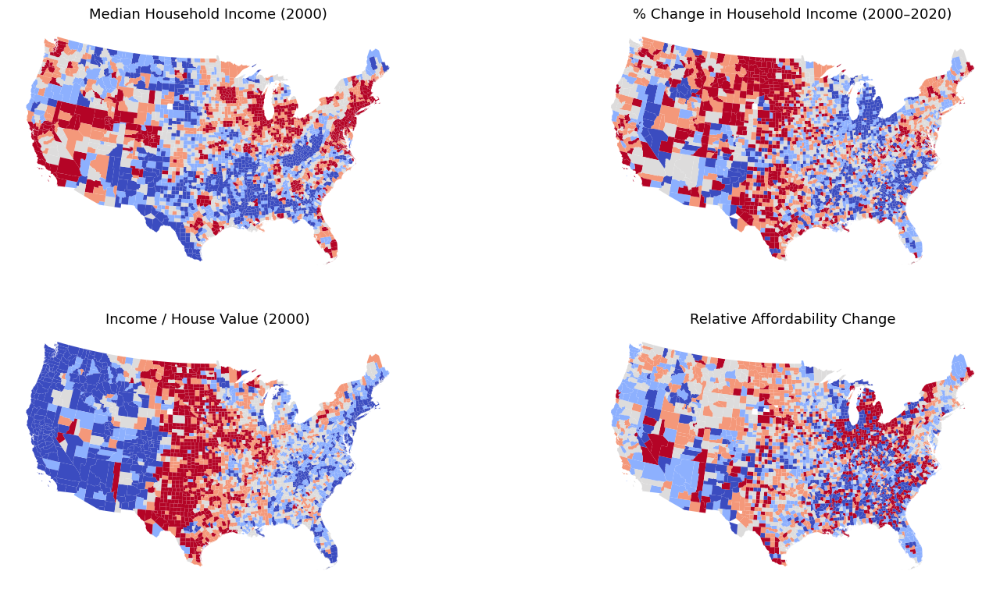

In [14]:
used_columns = [
    "MedianHouseholdIncome2000(adjusted)",
#                 "MedianHouseholdIncome2020",
                "%ChangeIncome",
                "income/value2000",
#                 "income/value2020",
                "%Income/%Value"]
titles = [
    'Median Household Income (2000)',
#     'Median Household Income (2020)',
    '% Change in Household Income (2000–2020)',
    'Income / House Value (2000)',
#     'Income / House Value (2020)',
    'Relative Affordability Change']
fig, axes = plt.subplots(2, 2, figsize=(18, 9), constrained_layout=True)
axes = axes.flatten()
for i, col in enumerate(used_columns):
    gdf_MedianHouseIndicator.plot(column=col,
             cmap='coolwarm',
              scheme = "quantiles" ,                   
#              linewidth=0.2,
#              edgecolor='black',
#              legend=True,
             ax=axes[i])
    axes[i].set_title(titles[i], fontsize=13)
    axes[i].axis('off')
plt.tight_layout()
plt.show()

### Process of Amenity data

In [15]:
# TJan["FIPS"]  = TJan["FIPS"].astype(str).str.rjust(5,"0")
# TJuly["FIPS"] = TJuly["FIPS"].astype(str).str.rjust(5,"0")
# TJan_sel  = TJan[["FIPS","MEAN"]].rename(columns={"MEAN":"TJAN"})
# TJuly_sel = TJuly[["FIPS","MEAN"]].rename(columns={"MEAN":"TJULY"})
# T_sel = pd.merge(TJan_sel,TJuly_sel,on="FIPS")

In [16]:
Amenity["FIPS"]  = Amenity["FIPS"].astype(str).str.rjust(5,"0")
Amenity = Amenity[["FIPS","Scale","Level"]]
Amenity.head()

,FIPS,Scale,Level
0,01001,0.78,4
1,01003,1.82,4
2,01005,0.19,4
3,01007,-0.15,3
4,01009,0.23,4


### Process of Location Affordability Index (LAI)

In [17]:
HAI["FIPS"]  = HAI["FIPS"].astype(str).str.rjust(5,"0")
HAI = HAI.rename(columns={
    "Weight_HAI":"W_HT_HAI"
#     "MEAN_hh_type1_h":"W_HT_LAI"
})
HAI = HAI[["FIPS","W_HT_HAI"]]
non_conus_fips_prefixes = ['02', '15', '60', '66', '69', '72', '78']  # Alaska, Hawaii, and island territories
HAI = HAI[
    ~HAI['FIPS'].str[:2].isin(non_conus_fips_prefixes)
]

### Process of SHELDUS

In [18]:
SHELDUS['County FIPS'] = SHELDUS['County FIPS'].str.replace("'", "")
SHELDUS_0020 = SHELDUS[(SHELDUS["Year"]<2021) & (SHELDUS["Year"]>2000)]
SHELDUS_0020 = SHELDUS_0020[~((SHELDUS_0020['Year'] == 2000) & (SHELDUS_0020['Month'] <= 6))]
SHELDUS_0020 = SHELDUS_0020[~((SHELDUS_0020['Year'] == 2020) & (SHELDUS_0020['Month'] >= 7))]
SHELDUS_0020["StateID"] = SHELDUS_0020["County FIPS"].astype(str).str[:2]
SHELDUS_0020 = SHELDUS_0020[~SHELDUS_0020["StateID"].isin(non_conus_fips_prefixes)]
SHELDUS_0020_dis = SHELDUS_0020.groupby(["Hazard"]).agg({"PropertyDmg(ADJ 2020)":"sum","Fatalities":"sum","Injuries":"sum"}).reset_index()
SHELDUS_0020_dis.sort_values(by="PropertyDmg(ADJ 2020)",ascending=False)

,Hazard,PropertyDmg(ADJ 2020),Fatalities,Injuries
4,Flooding,2.056574e+11,1648.020,1387.000
8,Hurricane/Tropical Storm,1.759030e+11,1215.980,1300.010
12,Tornado,3.784049e+10,1504.000,19077.000
15,Wildfire,3.218132e+10,296.000,1619.960
6,Hail,2.999533e+10,3.000,620.000
16,Wind,1.825596e+10,973.315,3993.930
17,Winter Weather,1.136860e+10,648.995,2833.035
11,Severe Storm/Thunder Storm,5.431994e+09,303.500,2387.000
3,Earthquake,4.256910e+09,7.990,223.000
9,Landslide,3.151915e+09,183.960,300.010


In [19]:
SHELDUS_0020_sel = SHELDUS_0020[SHELDUS_0020["Hazard"].isin(['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado'])].reset_index(drop=True)
SHELDUS_0020_sel_use = SHELDUS_0020_sel[['County FIPS', 'Hazard', 'Year',"Month",'PropertyDmg(ADJ 2020)','Fatalities','Injuries']]

def calculate_period(row):
    year = row['Year']
    month = row['Month']
    # If month is from July to December, the period is the current year
    if month >= 7:
        return year +1
    # If month is from January to June, the period is the previous year
    else:
        return year

# Apply the function to the dataframe
SHELDUS_0020_sel_use['Period'] = SHELDUS_0020_sel_use.apply(calculate_period, axis=1)
SHELDUS_0020_sel_use["Count"]  = 1
SHELDUS_0020_sel_use_group = SHELDUS_0020_sel_use.groupby(["County FIPS","Hazard","Period"]).agg({"PropertyDmg(ADJ 2020)":"sum",
                                                                                                 'Fatalities':"sum",
                                                                                                  'Injuries':"sum",
                                                                                                  "Count":"sum"}).reset_index()

C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\2092878197.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_0020_sel_use['Period'] = SHELDUS_0020_sel_use.apply(calculate_period, axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\2092878197.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_0020_sel_use["Count"]  = 1


In [20]:
disaster_list = ['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado']
flood_temp = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==disaster_list[0]]
flood_list = list(flood_temp["County FIPS"].unique())
hurricane_temp = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==disaster_list[1]]
hurricane_list = list(hurricane_temp["County FIPS"].unique())
wildfire_temp = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==disaster_list[2]]
wildfire_list = list(wildfire_temp["County FIPS"].unique())
tornado_temp = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==disaster_list[3]]
tornado_list = list(tornado_temp["County FIPS"].unique())

# Panel Regression Analysis

### Create the panel dataframe

In [21]:
correct_pop_columns = ["FIPS","POPESTIMATE2000","POPESTIMATE2001","POPESTIMATE2002","POPESTIMATE2003","POPESTIMATE2004",
                       "POPESTIMATE2005","POPESTIMATE2006","POPESTIMATE2007","POPESTIMATE2008","POPESTIMATE2009",
                       "POPESTIMATE2010_x","POPESTIMATE2011","POPESTIMATE2012","POPESTIMATE2013","POPESTIMATE2014",
                       "POPESTIMATE2015","POPESTIMATE2016","POPESTIMATE2017","POPESTIMATE2018","POPESTIMATE2019","POPESTIMATE2020"]
correct_pop_columns_rev = ["FIPS","POP2000","POP2001","POP2002","POP2003","POP2004",
                       "POP2005","POP2006","POP2007","POP2008","POP2009",
                       "POP2010","POP2011","POP2012","POP2013","POP2014",
                       "POP2015","POP2016","POP2017","POP2018","POP2019","POP2020"]
df_pep_0120_pop_use = df_pep_0120[correct_pop_columns]
df_pep_0120_pop_use.columns = correct_pop_columns_rev

In [22]:
years = range(2000, 2021)
year_cols = [f'POP{year}' for year in years]
df2_long = pd.melt(df_pep_0120_pop_use, id_vars=['FIPS'], value_vars=year_cols, var_name='Year', value_name='Population')
df2_long['Year'] = df2_long['Year'].str.extract('(\d+)').astype(int)  # Convert Year to integer

# Merge the dataframes
SHELDUS_0020_sel_use_group['County FIPS'] = SHELDUS_0020_sel_use_group['County FIPS'].astype(str)  # Ensure FIPS codes are strings if they have leading zeros
SHELDUS_0020_sel_use_group['Year'] = SHELDUS_0020_sel_use_group['Period'].astype(int)  # Ensure Year is integer
# merged_df = pd.merge(SHELDUS_0020_sel_use_group, df2_long, left_on=['County FIPS', 'Year'], right_on=['FIPS', 'Year'], how='left')

# Result
# merged_df["PropertyDmgPerCapita"] = merged_df["PropertyDmg(ADJ 2020)"] / merged_df["Population"]

<>:4: SyntaxWarning: invalid escape sequence '\d'
<>:4: SyntaxWarning: invalid escape sequence '\d'
C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\2987025524.py:4: SyntaxWarning: invalid escape sequence '\d'
  df2_long['Year'] = df2_long['Year'].str.extract('(\d+)').astype(int)  # Convert Year to integer


In [23]:
disaster_list = ['Flooding', 'Hurricane/Tropical Storm', 'Tornado', 'Wildfire']
df_disaster_year = list()
for each in disaster_list:
    df_temp_used = SHELDUS_0020_sel_use_group[SHELDUS_0020_sel_use_group["Hazard"]==each]
    df_temp_used_merge = pd.merge(df2_long,df_temp_used,left_on=["FIPS","Year"],right_on=["County FIPS","Year"],how = "outer")
    df_temp_used_merge = df_temp_used_merge[["FIPS","Year","Population","PropertyDmg(ADJ 2020)","Fatalities","Injuries","Count"]]
    df_temp_used_merge["PropertyDmgPerCapita"] = df_temp_used_merge["PropertyDmg(ADJ 2020)"]/df_temp_used_merge["Population"]
    df_temp_used_merge["Existance"] = np.where(
    df_temp_used_merge['Count'] > 0,
    1,
    0
)
    df_temp_used_merge = df_temp_used_merge.fillna(0)
    df_disaster_year.append(df_temp_used_merge)

### Next step is to create the yearly panel data for each disaster

In [24]:
df_flood_year = df_disaster_year[0]
df_hurricane_year = df_disaster_year[1]
df_tornado_year = df_disaster_year[2]
df_wildfire_year = df_disaster_year[3]

In [25]:
df_flood_year     = df_flood_year[df_flood_year["FIPS"].isin(flood_list)].reset_index()
df_hurricane_year = df_hurricane_year[df_hurricane_year["FIPS"].isin(hurricane_list)].reset_index()
df_tornado_year   = df_tornado_year[df_tornado_year["FIPS"].isin(tornado_list)].reset_index()
df_wildfire_year  = df_wildfire_year[df_wildfire_year["FIPS"].isin(wildfire_list)].reset_index()

In [143]:
df_flood_year_high     = df_flood_year[df_flood_year["FIPS"].isin(flooding_high_list)].reset_index()
df_hurricane_year_high = df_hurricane_year[df_hurricane_year["FIPS"].isin(hurricane_high_list)].reset_index()
df_tornado_year_high   = df_tornado_year[df_tornado_year["FIPS"].isin(tornado_high_list)].reset_index()
df_wildfire_year_high  = df_wildfire_year[df_wildfire_year["FIPS"].isin(wildfire_high_list)].reset_index()

In [148]:
df_flood_year_medhigh     = df_flood_year[df_flood_year["FIPS"].isin(flooding_high_list+flooding_med_list)].reset_index()
df_hurricane_year_medhigh = df_hurricane_year[df_hurricane_year["FIPS"].isin(hurricane_high_list+hurricane_med_list)].reset_index()
df_tornado_year_medhigh   = df_tornado_year[df_tornado_year["FIPS"].isin(tornado_high_list+tornado_med_list)].reset_index()
df_wildfire_year_medhigh  = df_wildfire_year[df_wildfire_year["FIPS"].isin(wildfire_high_list+wildfire_med_list)].reset_index()

In [26]:
def calculate_disaster_existence_percentages(df, fips_col="FIPS", year_col="Year", exist_col="Existance"):
    df_sorted = df.sort_values(by=[fips_col, year_col]).copy()
    df_sorted["Existance_lag1"] = df_sorted.groupby(fips_col)[exist_col].shift(1)

    both = ((df_sorted[exist_col] == 1) & (df_sorted["Existance_lag1"] == 1)).sum()
    either = ((df_sorted[exist_col] == 1) | (df_sorted["Existance_lag1"] == 1)).sum()
    neither = ((df_sorted[exist_col] == 0) & (df_sorted["Existance_lag1"] == 0)).sum()
    total = len(df_sorted)

    return {
        "both_current_and_last_year": round(100 * both / total, 2),
        "either_current_or_last_year": round(100 * either / total, 2),
        "neither_current_nor_last_year": round(100 * neither / total, 2)
    }

In [27]:
calculate_disaster_existence_percentages(df_flood_year)

{'both_current_and_last_year': 13.51,
 'either_current_or_last_year': 44.16,
 'neither_current_nor_last_year': 51.08}

In [28]:
calculate_disaster_existence_percentages(df_hurricane_year)

{'both_current_and_last_year': 2.06,
 'either_current_or_last_year': 20.85,
 'neither_current_nor_last_year': 74.39}

In [29]:
calculate_disaster_existence_percentages(df_tornado_year)

{'both_current_and_last_year': 4.73,
 'either_current_or_last_year': 30.95,
 'neither_current_nor_last_year': 64.29}

In [30]:
calculate_disaster_existence_percentages(df_wildfire_year)

{'both_current_and_last_year': 2.73,
 'either_current_or_last_year': 18.28,
 'neither_current_nor_last_year': 76.96}

In [31]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [32]:
correct_nmr_columns = ["FIPS","RNETMIG2001","RNETMIG2002","RNETMIG2003","RNETMIG2004",
                       "RNETMIG2005","RNETMIG2006","RNETMIG2007","RNETMIG2008","RNETMIG2009",
                       "RNETMIG2010","RNETMIG2011","RNETMIG2012","RNETMIG2013","RNETMIG2014",
                       "RNETMIG2015","RNETMIG2016","RNETMIG2017","RNETMIG2018","RNETMIG2019","RNETMIG2020"]
correct_nmr_columns_rev = ["FIPS","NMR2001","NMR2002","NMR2003","NMR2004",
                       "NMR2005","NMR2006","NMR2007","NMR2008","NMR2009",
                       "NMR2010","NMR2011","NMR2012","NMR2013","NMR2014",
                       "NMR2015","NMR2016","NMR2017","NMR2018","NMR2019","NMR2020"]

df_pep_0120_nmr_use = df_pep_0120[correct_nmr_columns]
df_pep_0120_nmr_use.columns = correct_nmr_columns_rev


In [33]:
years = range(2001, 2021)
year_cols = [f'NMR{year}' for year in years]
dfnmr_long = pd.melt(df_pep_0120_nmr_use, id_vars=['FIPS'], value_vars=year_cols, var_name='Year', value_name='NMR')
dfnmr_long['Year'] = dfnmr_long['Year'].str.extract('(\d+)').astype(int)

<>:4: SyntaxWarning: invalid escape sequence '\d'
<>:4: SyntaxWarning: invalid escape sequence '\d'
C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\910903619.py:4: SyntaxWarning: invalid escape sequence '\d'
  dfnmr_long['Year'] = dfnmr_long['Year'].str.extract('(\d+)').astype(int)


In [34]:
dfnmr_long.sort_values(by=['FIPS', 'Year'], inplace=True)

In [35]:
def add_log_transforms(df):
    df["log_count"] = np.log1p(df["Count"])
    df["log_injury"] = np.log1p(df["Injuries"])
    df["log_fatality"] = np.log1p(df["Fatalities"])
    df["log_damage"] = np.log1p(df["PropertyDmgPerCapita"])
    return df
def add_lagged_variables(df, group_col="FIPS"):
    to_lag = ["log_count", "log_injury", "log_fatality", "log_damage","Existance"]
    for var in to_lag:
        df[f"{var}_lag1"] = df.groupby(group_col)[var].shift(1)
    return df

In [150]:
# df_flood_year = add_dummy_variables(df_flood_year)
df_flood_year_high = add_log_transforms(df_flood_year_high)
df_flood_year_high = add_lagged_variables(df_flood_year_high)
# df_hurricane_year = add_dummy_variables(df_hurricane_year)
df_hurricane_year_high = add_log_transforms(df_hurricane_year_high)
df_hurricane_year_high = add_lagged_variables(df_hurricane_year_high)
# df_tornado_year = add_dummy_variables(df_tornado_year)
df_tornado_year_high = add_log_transforms(df_tornado_year_high)
df_tornado_year_high = add_lagged_variables(df_tornado_year_high)
# df_wildfire_year = add_dummy_variables(df_wildfire_year)
df_wildfire_year_high = add_log_transforms(df_wildfire_year_high)
df_wildfire_year_high = add_lagged_variables(df_wildfire_year_high)

In [151]:
# df_flood_year = add_dummy_variables(df_flood_year)
df_flood_year_medhigh = add_log_transforms(df_flood_year_medhigh)
df_flood_year_medhigh = add_lagged_variables(df_flood_year_medhigh)
# df_hurricane_year = add_dummy_variables(df_hurricane_year)
df_hurricane_year_medhigh = add_log_transforms(df_hurricane_year_medhigh)
df_hurricane_year_medhigh = add_lagged_variables(df_hurricane_year_medhigh)
# df_tornado_year = add_dummy_variables(df_tornado_year)
df_tornado_year_medhigh = add_log_transforms(df_tornado_year_medhigh)
df_tornado_year_medhigh = add_lagged_variables(df_tornado_year_medhigh)
# df_wildfire_year = add_dummy_variables(df_wildfire_year)
df_wildfire_year_medhigh = add_log_transforms(df_wildfire_year_medhigh)
df_wildfire_year_medhigh = add_lagged_variables(df_wildfire_year_medhigh)

In [36]:
# df_flood_year = add_dummy_variables(df_flood_year)
df_flood_year = add_log_transforms(df_flood_year)
df_flood_year = add_lagged_variables(df_flood_year)

In [37]:
# df_hurricane_year = add_dummy_variables(df_hurricane_year)
df_hurricane_year = add_log_transforms(df_hurricane_year)
df_hurricane_year = add_lagged_variables(df_hurricane_year)

In [38]:
# df_tornado_year = add_dummy_variables(df_tornado_year)
df_tornado_year = add_log_transforms(df_tornado_year)
df_tornado_year = add_lagged_variables(df_tornado_year)

In [39]:
# df_wildfire_year = add_dummy_variables(df_wildfire_year)
df_wildfire_year = add_log_transforms(df_wildfire_year)
df_wildfire_year = add_lagged_variables(df_wildfire_year)

In [152]:
df_year_nmr_flood_high     = pd.merge(dfnmr_long,df_flood_year_high,on=["FIPS",'Year'],how="inner")
df_year_nmr_hurricane_high = pd.merge(dfnmr_long,df_hurricane_year_high,on=["FIPS",'Year'],how="inner")
df_year_nmr_tornado_high   = pd.merge(dfnmr_long,df_tornado_year_high,on=["FIPS",'Year'],how="inner")
df_year_nmr_wildfire_high  = pd.merge(dfnmr_long,df_wildfire_year_high,on=["FIPS",'Year'],how="inner")

In [154]:
df_year_nmr_flood_medhigh     = pd.merge(dfnmr_long,df_flood_year_medhigh,on=["FIPS",'Year'],how="inner")
df_year_nmr_hurricane_medhigh = pd.merge(dfnmr_long,df_hurricane_year_medhigh,on=["FIPS",'Year'],how="inner")
df_year_nmr_tornado_medhigh   = pd.merge(dfnmr_long,df_tornado_year_medhigh,on=["FIPS",'Year'],how="inner")
df_year_nmr_wildfire_medhigh  = pd.merge(dfnmr_long,df_wildfire_year_medhigh,on=["FIPS",'Year'],how="inner")

In [40]:
df_year_nmr_flood     = pd.merge(dfnmr_long,df_flood_year,on=["FIPS",'Year'],how="inner")
df_year_nmr_hurricane = pd.merge(dfnmr_long,df_hurricane_year,on=["FIPS",'Year'],how="inner")
df_year_nmr_tornado   = pd.merge(dfnmr_long,df_tornado_year,on=["FIPS",'Year'],how="inner")
df_year_nmr_wildfire  = pd.merge(dfnmr_long,df_wildfire_year,on=["FIPS",'Year'],how="inner")

## Regression for Single Varible

In [201]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant


df_used_vif =  df_year_nmr_wildfire
df_vif = df_used_vif[["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
             "Existance",
#              "Existance_lag1"
                     ]]


X = add_constant(df_vif)


vif_data = pd.DataFrame()
vif_data['Variable'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print("VIF  results of wildfire")
print(vif_data)


VIF  results of wildfire
       Variable        VIF
0         const   1.126449
1    log_damage   1.709675
2  log_fatality   1.147485
3    log_injury   1.370144
4     log_count  13.706049
5     Existance  12.799967


In [243]:
def run_panel_regression_single(df, exog_vars, name="Model"):
    model_df = df.dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()
    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)
    return fe_result
def run_panel_regression_single1(df, exog_vars, name="Model"):
    model_df = df.dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()
    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)
    return fe_result

In [232]:
used_vars_single = ["log_damage",
             "log_damage_lag1",
             "log_fatality",
             "log_fatality_lag1",
             "log_injury",
             "log_injury_lag1",
             "log_count",
             "log_count_lag1",
             "Existance",
             "Existance_lag1"
            ]
used_vars_0 = ["log_damage",
             "log_fatality",
             "log_injury",
             "log_count",
#              "Existance",
#              "Existance_lag1"
            ]
used_vars_1 = [
             "log_damage_lag1",
             "log_fatality_lag1",
             "log_injury_lag1",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]

In [236]:
df_flood         = df_year_nmr_flood.set_index(["FIPS", "Year"])
df_flood_medhigh = df_year_nmr_flood_medhigh.set_index(["FIPS", "Year"])
df_flood_high    = df_year_nmr_flood_high.set_index(["FIPS", "Year"])

df_hurricane         = df_year_nmr_hurricane.set_index(["FIPS", "Year"])
df_hurricane_medhigh = df_year_nmr_hurricane_medhigh.set_index(["FIPS", "Year"])
df_hurricane_high    = df_year_nmr_hurricane_high.set_index(["FIPS", "Year"])

df_wildfire         = df_year_nmr_wildfire.set_index(["FIPS", "Year"])
df_wildfire_medhigh = df_year_nmr_wildfire_medhigh.set_index(["FIPS", "Year"])
df_wildfire_high    = df_year_nmr_wildfire_high.set_index(["FIPS", "Year"])

df_tornado         = df_year_nmr_tornado.set_index(["FIPS", "Year"])
df_tornado_medhigh = df_year_nmr_tornado_medhigh.set_index(["FIPS", "Year"])
df_tornado_high    = df_year_nmr_tornado_high.set_index(["FIPS", "Year"])

In [360]:
df_flood_medhigh

NMR  level_0  index  Population  PropertyDmg(ADJ 2020)  \
FIPS  Year                                                                 
01001 2001   7.189609        1     22     44509.0               54762.44   
      2002  11.302332        2     23     45207.0                   0.00   
      2003   8.442436        3     24     45762.0               71228.16   
      2004  21.594219        4     25     46948.0               11396.51   
      2005  14.911994        5     26     47875.0               36601.51   
...               ...      ...    ...         ...                    ...   
56045 2016   0.970201    61672  66989      7228.0                   0.00   
      2017 -36.081748    61673  66990      6962.0                   0.00   
      2018  -9.814534    61674  66991      6895.0                   0.00   
      2019   0.000000    61675  66992      6880.0                   0.00   
      2020 -17.176833    61676  66993      6743.0               35400.46   

            Fatalities  Injuries  Count  PropertyDmgPerCapita  Existance  \
FIPS  Year                                                                 
01001 2001         0.0       0.0    1.0              1.230368          1   
      2002         0.0       0.0    0.0              0.000000          0   
      2003         0.0       0.0    1.0              1.556491          1   
      2004         0.0       0.0    1.0              0.242748          1   
      2005         0.0       0.0    3.0              0.764522          1   
...                ...       ...    ...                   ...        ...   
56045 2016         0.0       0.0    0.0              0.000000          0   
      2017         0.0       0.0    0.0              0.000000          0   
      2018         0.0       0.0    0.0              0.000000          0   
      2019         0.0       0.0    0.0              0.000000          0   
      2020         0.0       0.0    2.0              5.249957          1   

            log_count  log_injury  log_fatality  log_damage  log_count_lag1  \
FIPS  Year                                                                    
01001 2001   0.693147         0.0           0.0    0.802167        0.000000   
      2002   0.000000         0.0           0.0    0.000000        0.693147   
      2003   0.693147         0.0           0.0    0.938636        0.000000   
      2004   0.693147         0.0           0.0    0.217325        0.693147   
      2005   1.386294         0.0           0.0    0.567880        0.693147   
...               ...         ...           ...         ...             ...   
56045 2016   0.000000         0.0           0.0    0.000000        0.693147   
      2017   0.000000         0.0           0.0    0.000000        0.000000   
      2018   0.000000         0.0           0.0    0.000000        0.000000   
      2019   0.000000         0.0           0.0    0.000000        0.000000   
      2020   1.098612         0.0           0.0    1.832575        0.000000   

            log_injury_lag1  log_fatality_lag1  log_damage_lag1  \
FIPS  Year                                                        
01001 2001              0.0                0.0         0.000000   
      2002              0.0                0.0         0.802167   
      2003              0.0                0.0         0.000000   
      2004              0.0                0.0         0.938636   
      2005              0.0                0.0         0.217325   
...                     ...                ...              ...   
56045 2016              0.0                0.0         1.723959   
      2017              0.0                0.0         0.000000   
      2018              0.0                0.0         0.000000   
      2019              0.0                0.0         0.000000   
      2020              0.0                0.0         0.000000   

            Existance_lag1  
FIPS  Year                  
01001 2001             0.0  
      2002             1.0  
      2003             0

In [297]:
factors = ['PropertyDmgPerCapita','Fatalities', 'Injuries','Count']
factors1= ["log_damage", "log_fatality", "log_injury", "log_count"]

def hist_plot(df):
    for factor in range(4):
        fig, axes = plt.subplots(1, 2, figsize=(12, 4)) 

        zeros = df[df[factors[factor]] == 0][factors[factor]]
        non_zero = df[df[factors[factor]] > 0][factors[factor]]
        zero_count = len(zeros)
        ax1 = axes[0]
        ax2 = ax1.twinx()
        if i == 0:
            ax1.bar(-50000, [len(zeros)], width=1, color='red', alpha=0.4, label='Zeros')
            ax1.set_ylabel("Zero Count (log scale)")
            ax1.set_yscale('log')
            ax1.tick_params(axis='y', labelcolor='red')
        else:
            ax1.bar(0, [len(zeros)], width=1, color='red', alpha=0.4, label='Zeros')
            ax1.set_ylabel("Zero Count (log scale)")
            ax1.set_yscale('log')
            ax1.tick_params(axis='y', labelcolor='red')
        if len(non_zero) > 0:
            ax2.hist(non_zero, bins=30, alpha=0.7, color='blue', 
                 label='Non-zero values', range=(0.1, non_zero.max()), zorder=4)
            ax2.set_ylabel("Non-zero Frequency")
            ax2.tick_params(axis='y', labelcolor='blue')

        ax1.set_title(f'{factors[factor]} (Original)')
        ax1.set_xlabel('Value')


        zeros_log = df[df[factors1[factor]] == 0][factors1[factor]]
        non_zero_log = df[df[factors1[factor]] > 0][factors1[factor]]

        ax3 = axes[1]
        ax4 = ax3.twinx()

        ax3.bar([0], [len(zeros_log)], width=0.3, color='red', alpha=0.6, label='Zeros')
        ax3.set_ylabel("Zero Count (log scale)")
        ax3.set_yscale('log')
        ax3.tick_params(axis='y', labelcolor='red')

        ax4.hist(non_zero_log, bins=30, alpha=0.7, color='green', label='Non-zero values')
        ax4.set_ylabel("Non-zero Frequency")
        ax4.tick_params(axis='y', labelcolor='green')

        ax3.set_title(f'{factors1[factor]} (Log-transformed)')
        ax3.set_xlabel('Log Value')

        plt.tight_layout()
        plt.show()


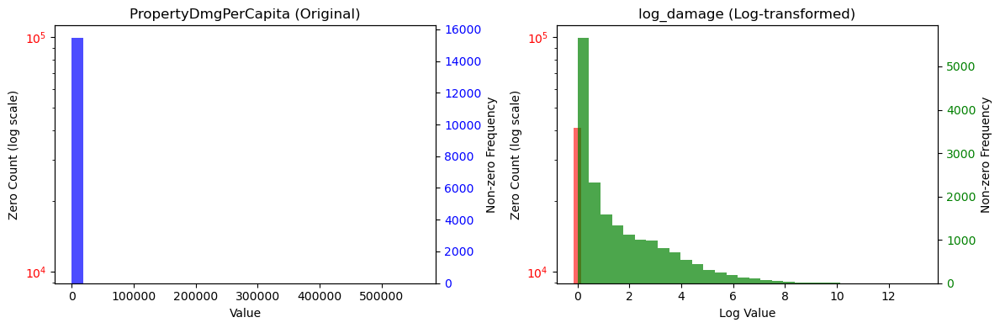

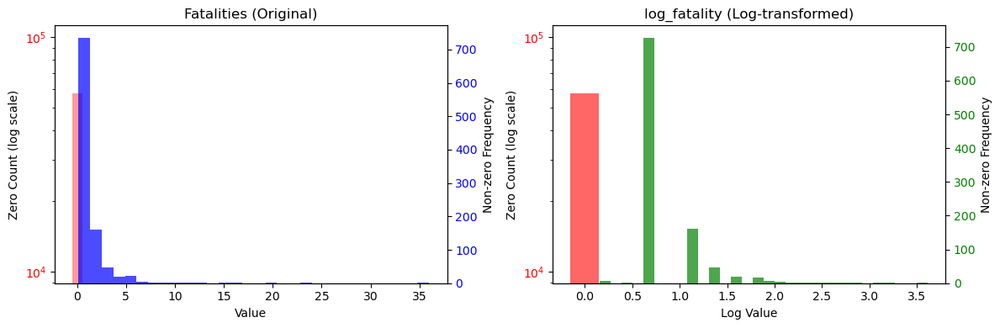

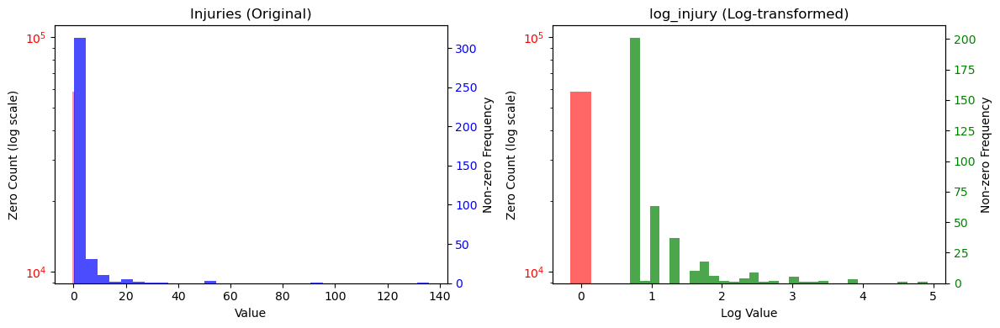

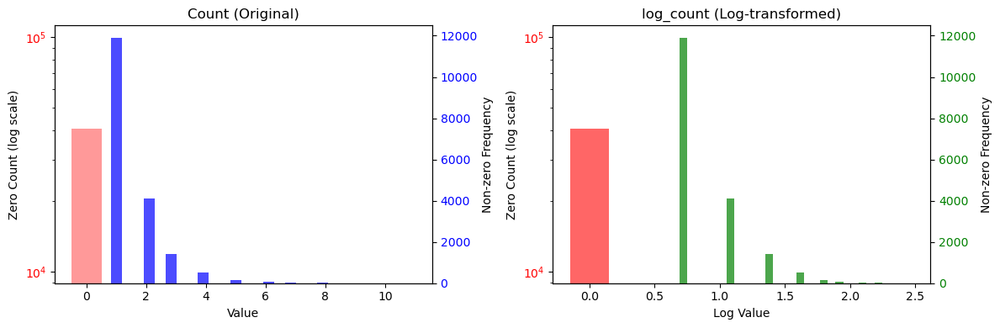

In [298]:
hist_plot(df_year_nmr_flood)

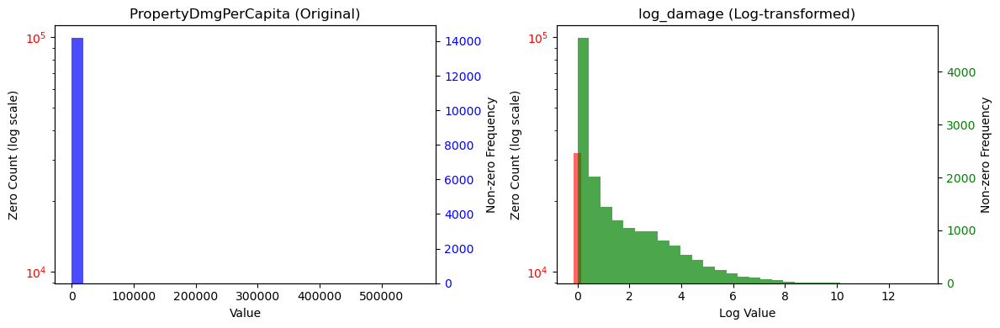

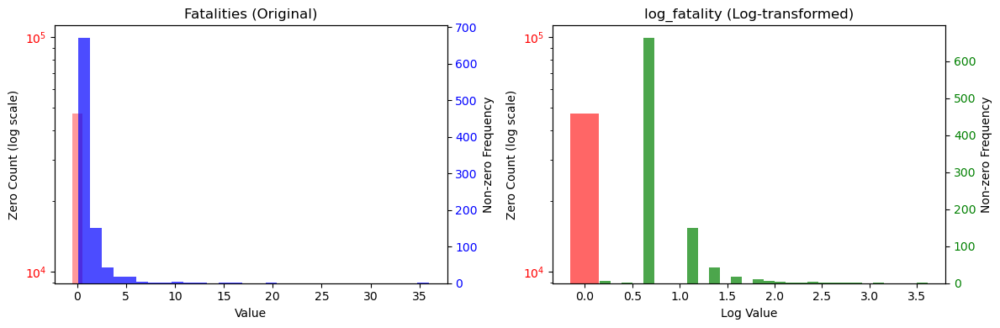

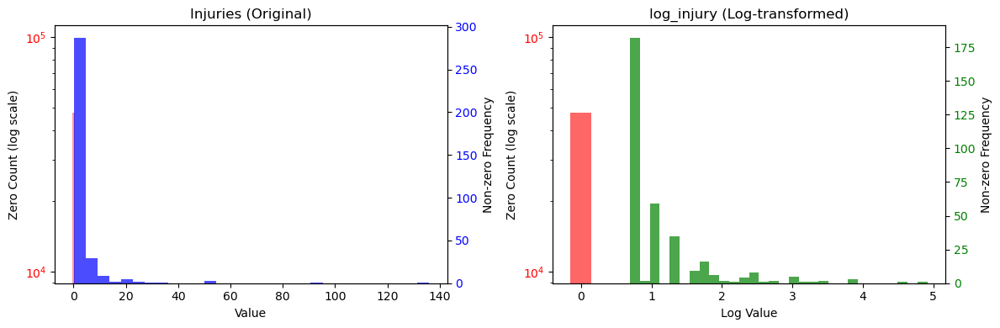

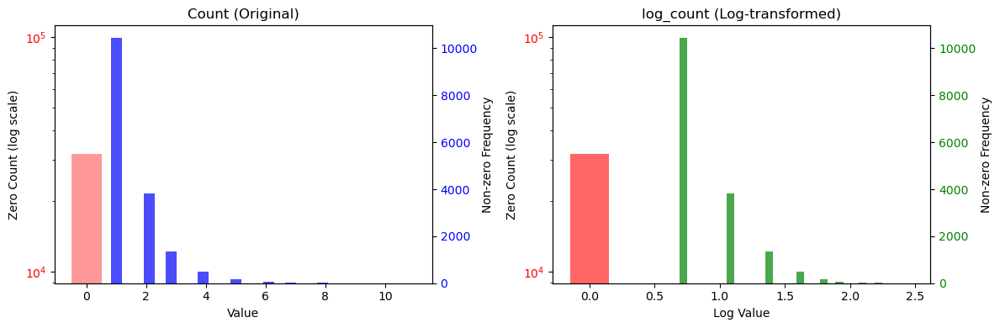

In [299]:
hist_plot(df_year_nmr_flood_medhigh)

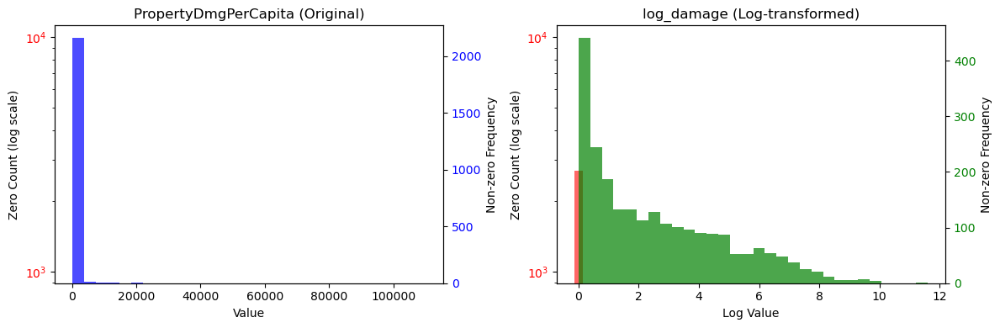

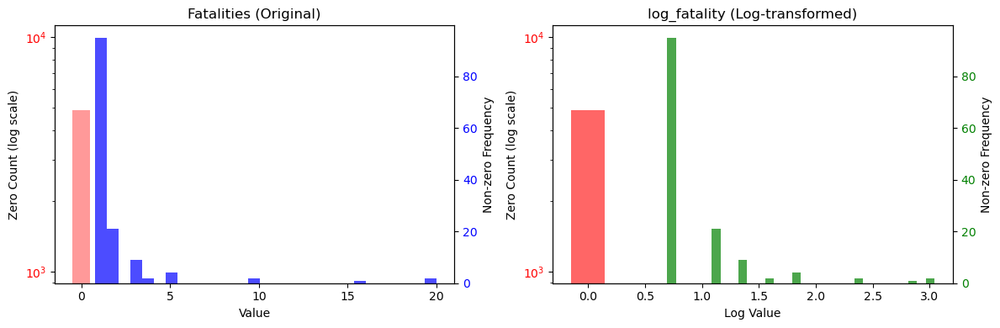

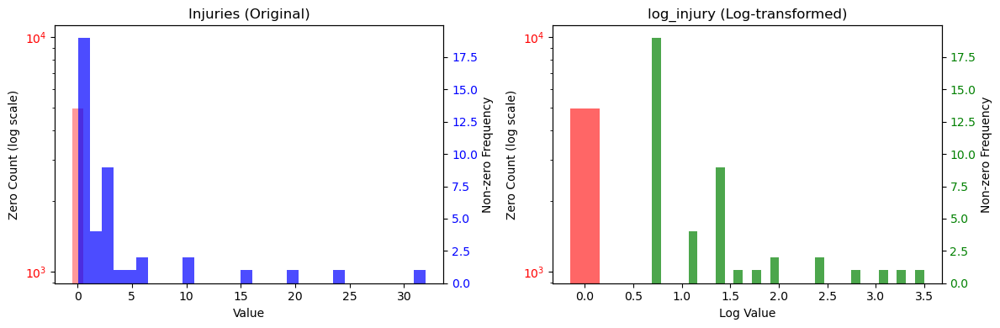

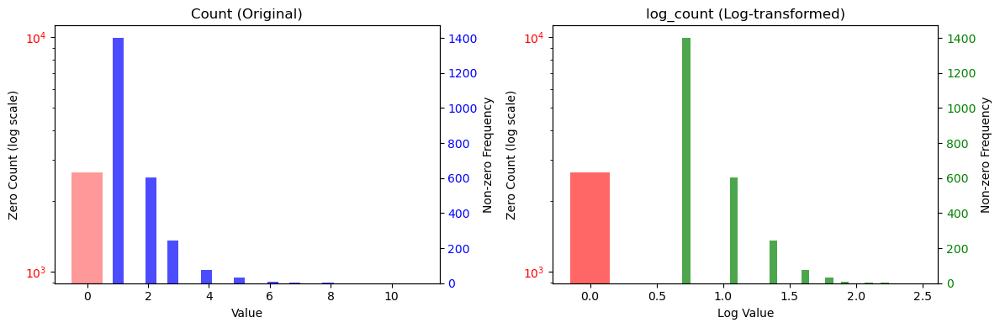

In [300]:
hist_plot(df_year_nmr_flood_high)

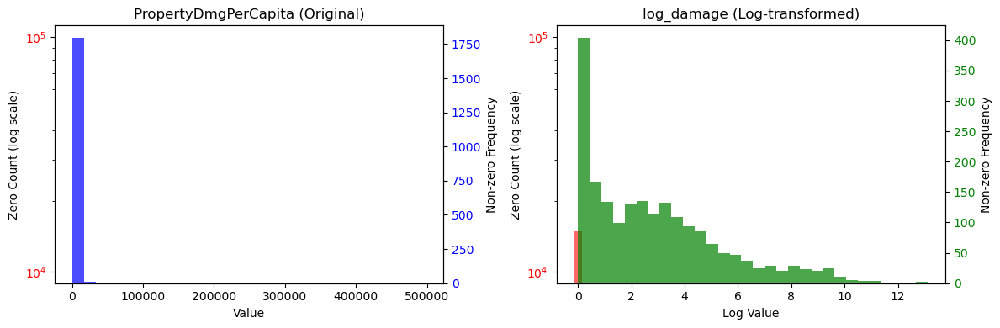

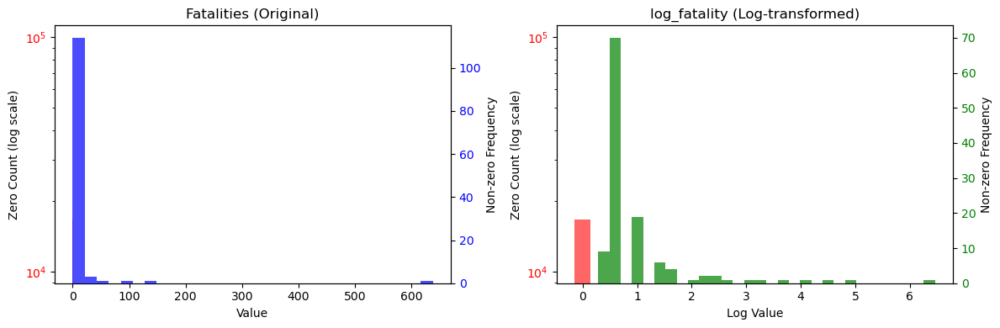

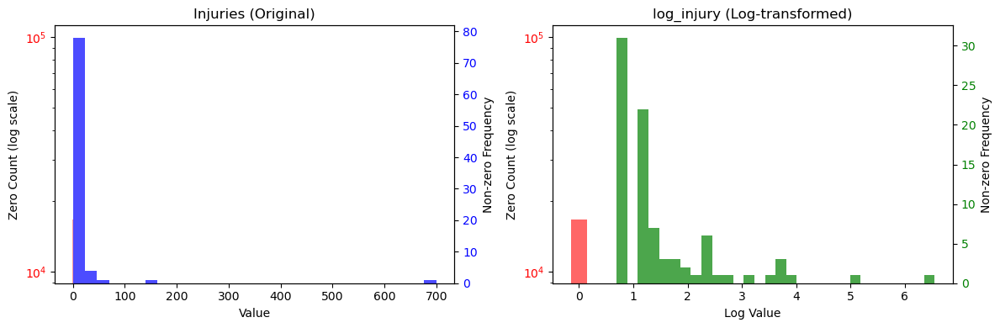

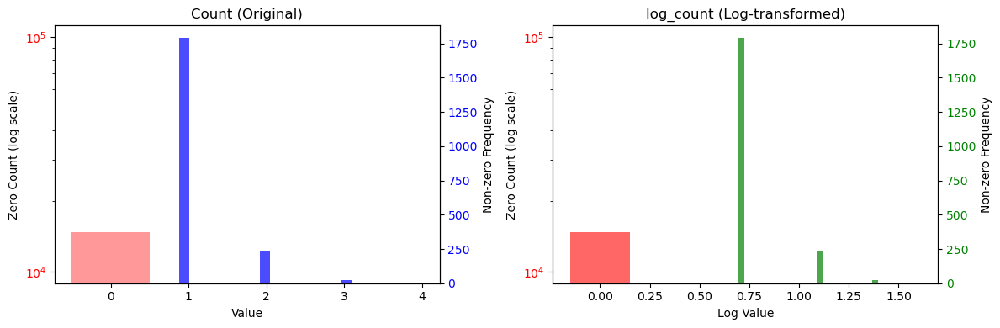

In [301]:
hist_plot(df_year_nmr_hurricane)

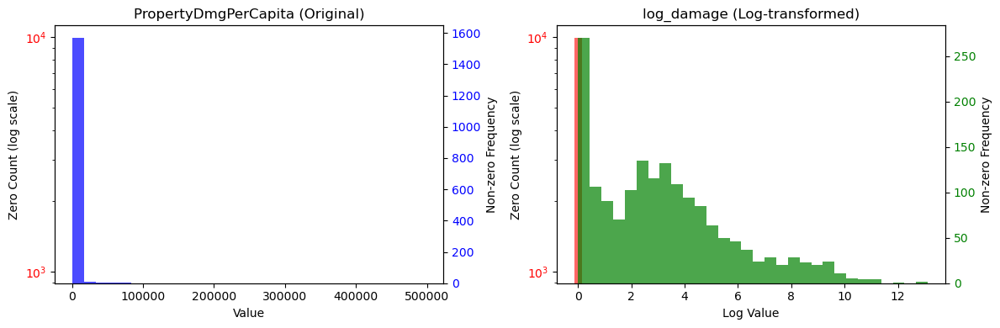

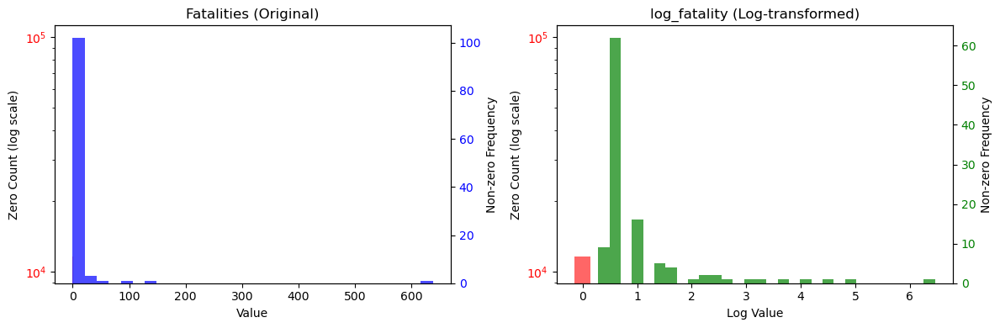

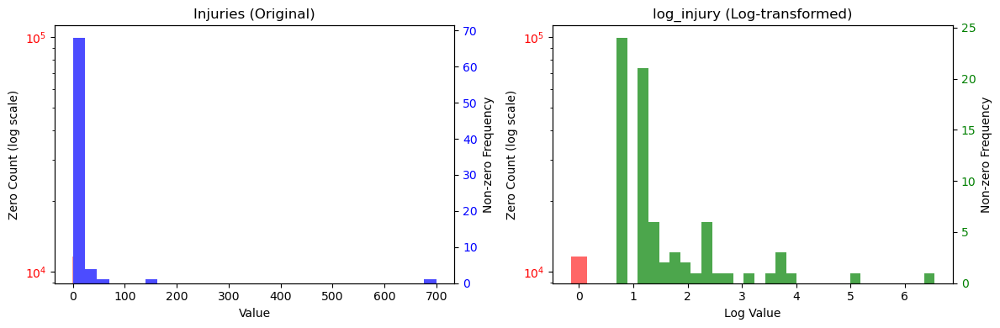

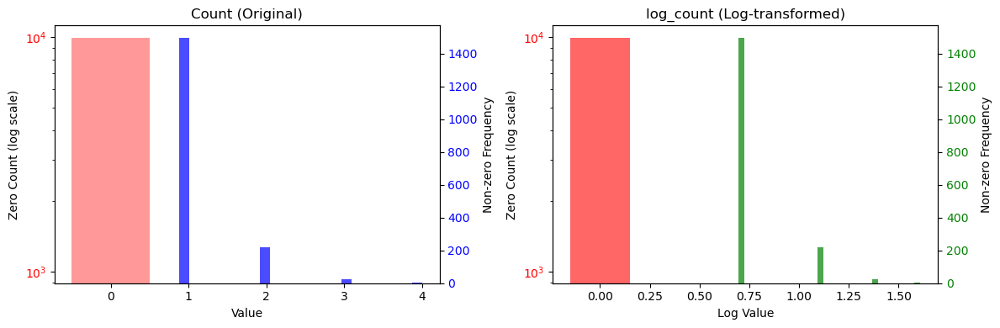

In [302]:
hist_plot(df_year_nmr_hurricane_medhigh)

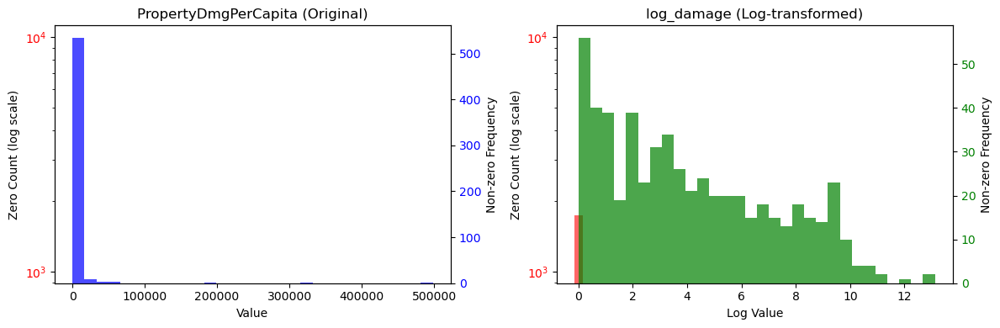

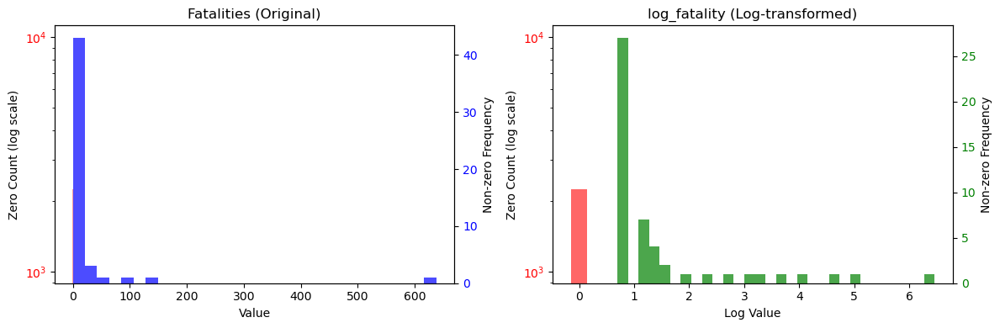

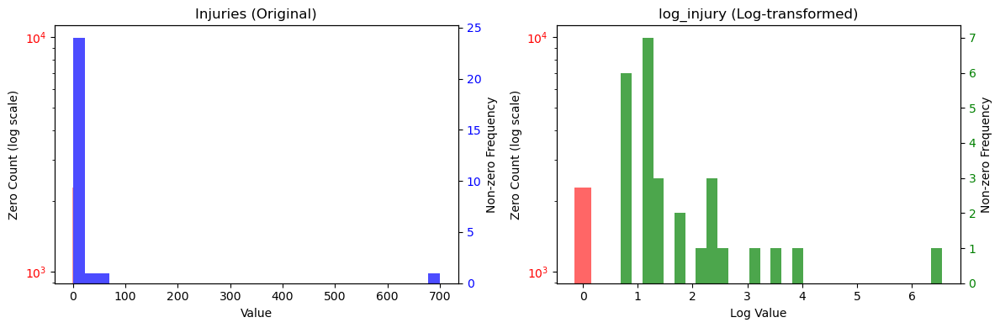

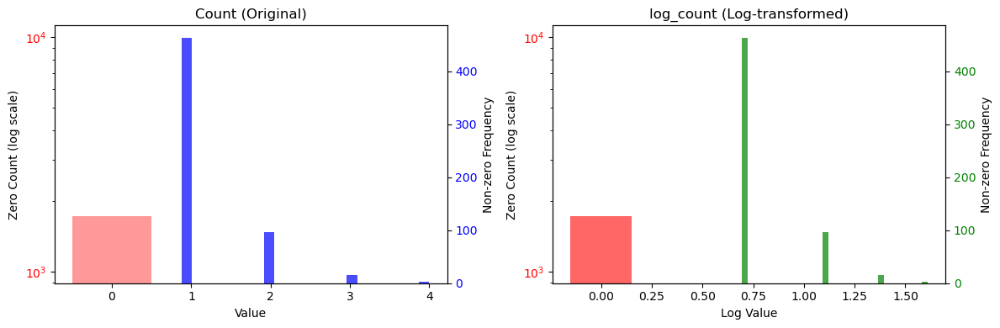

In [303]:
hist_plot(df_year_nmr_hurricane_high)

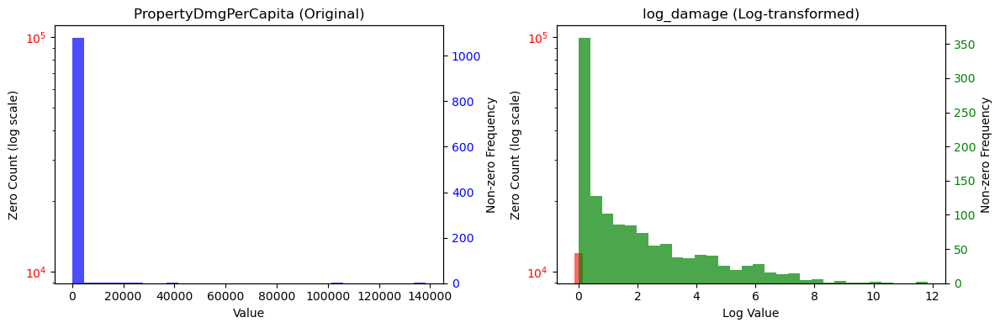

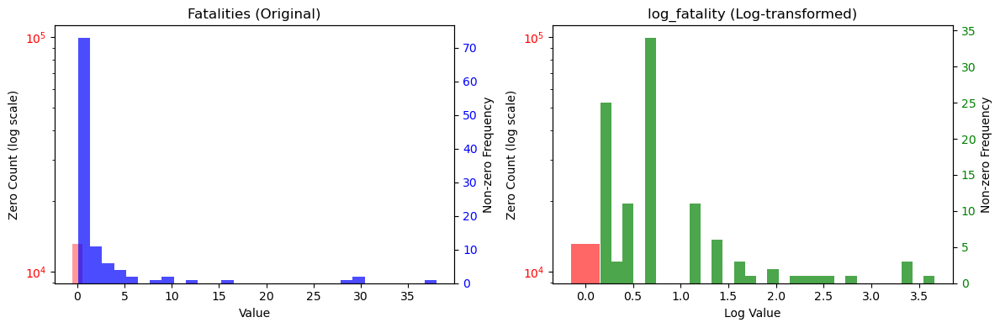

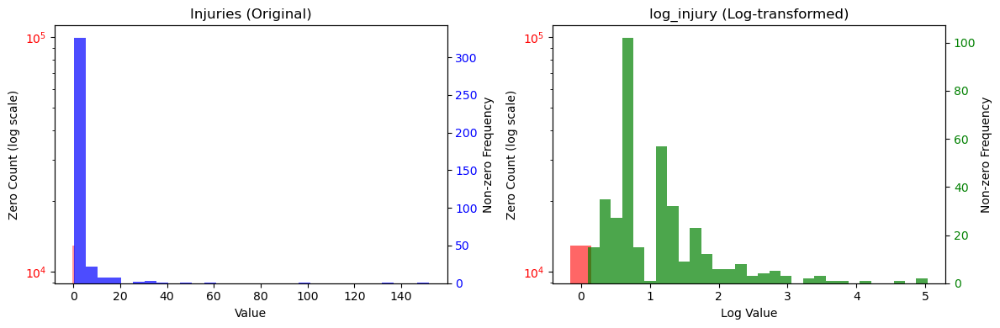

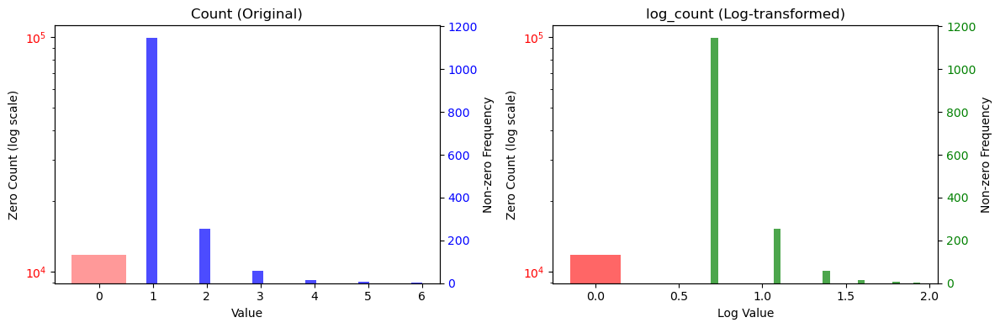

In [304]:
hist_plot(df_year_nmr_wildfire)

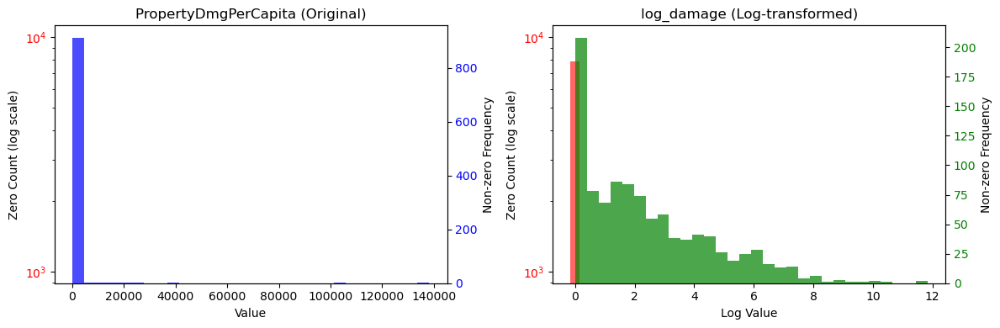

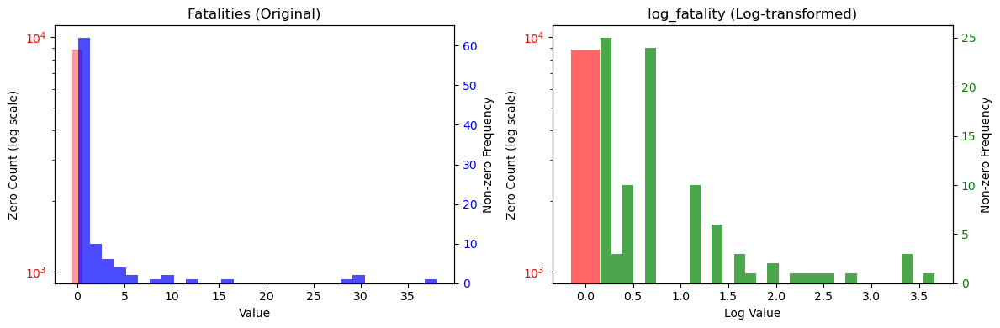

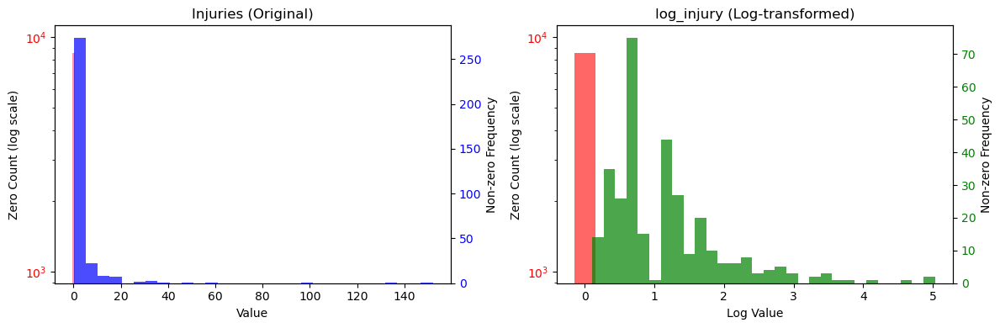

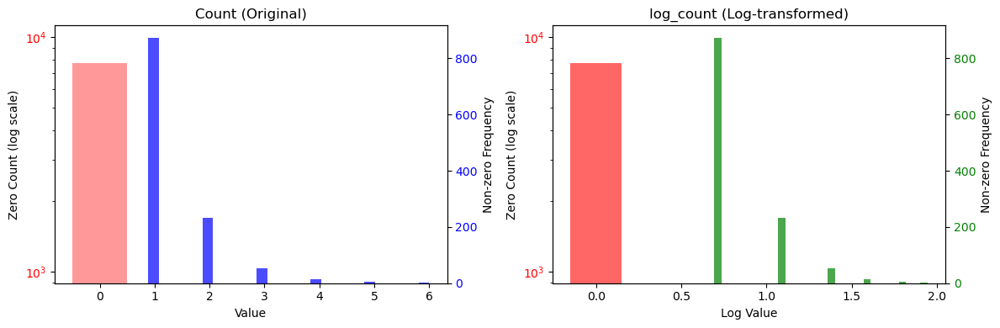

In [305]:
hist_plot(df_year_nmr_wildfire_medhigh)

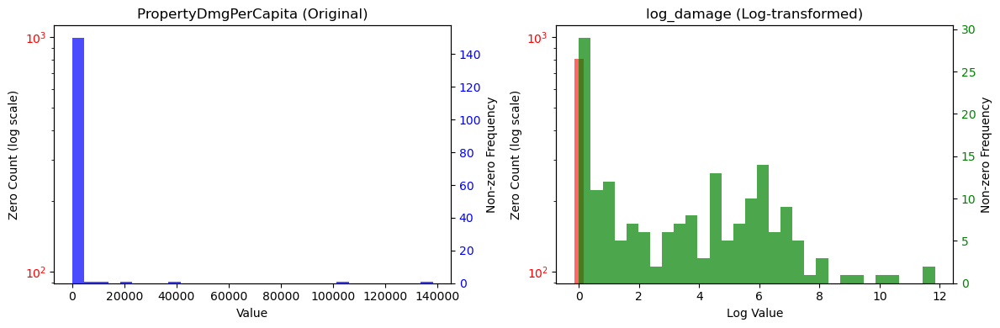

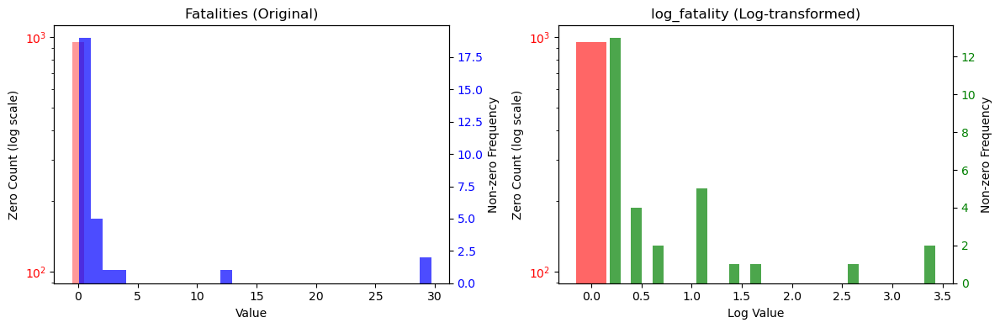

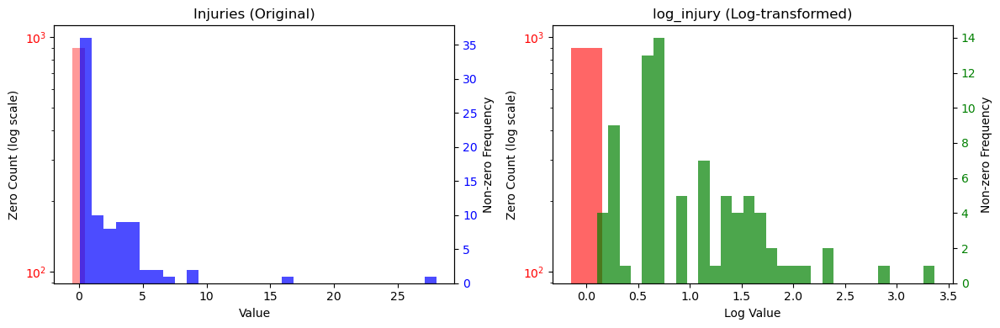

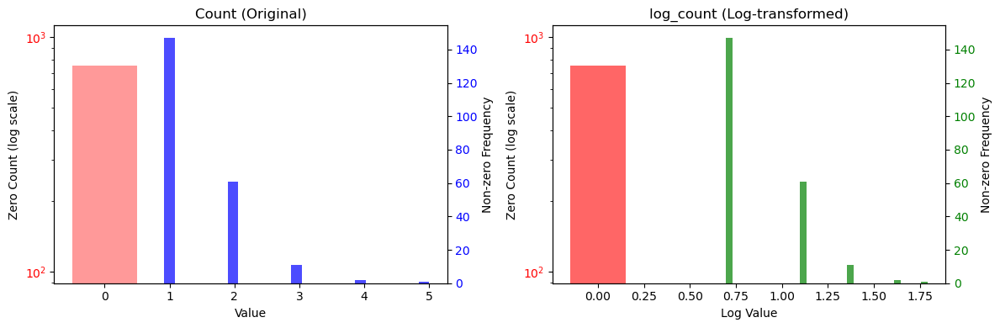

In [306]:
hist_plot(df_year_nmr_wildfire_high)

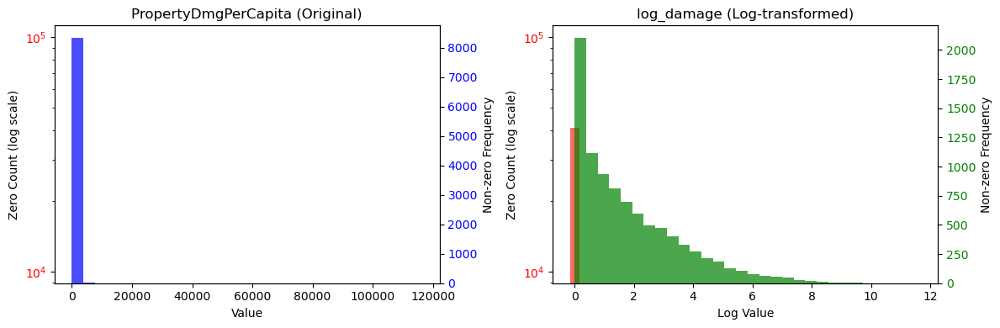

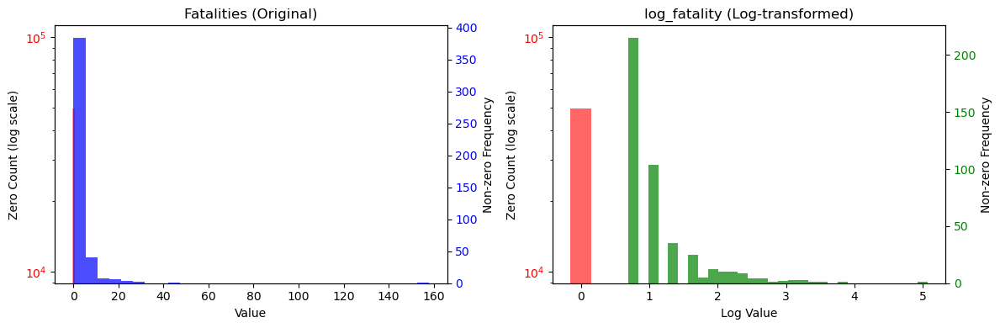

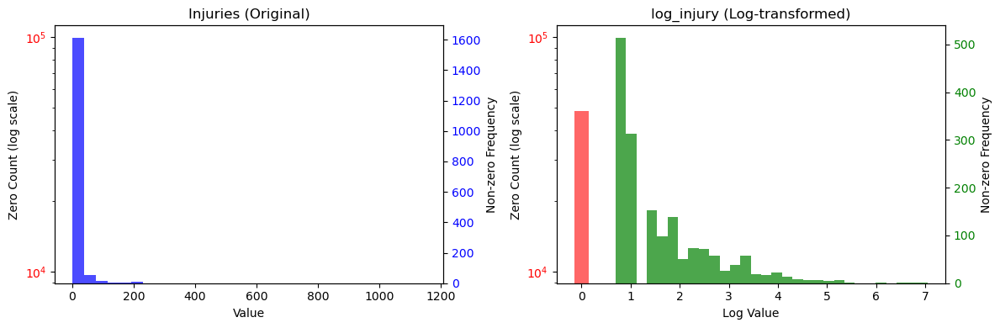

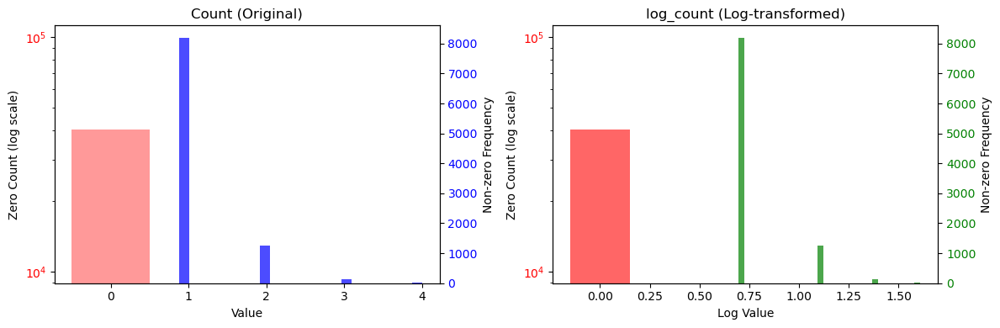

In [307]:
hist_plot(df_year_nmr_tornado)

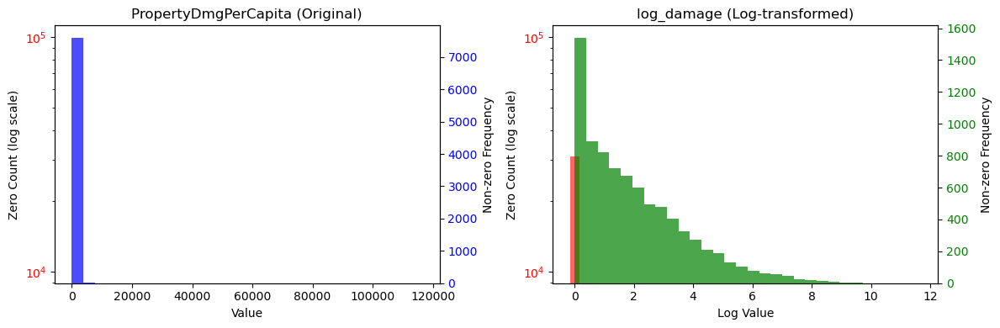

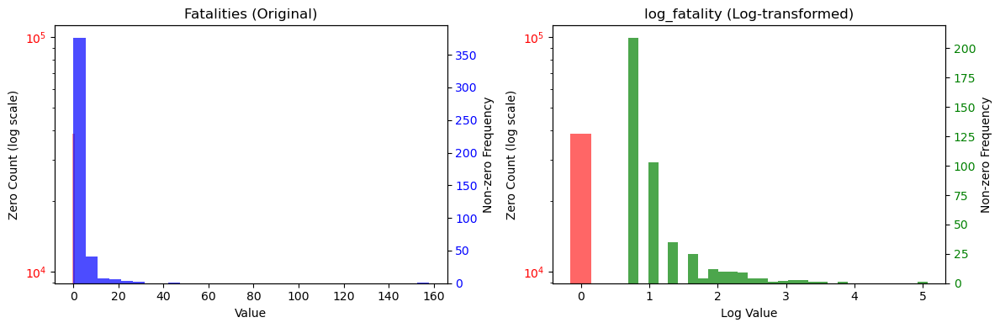

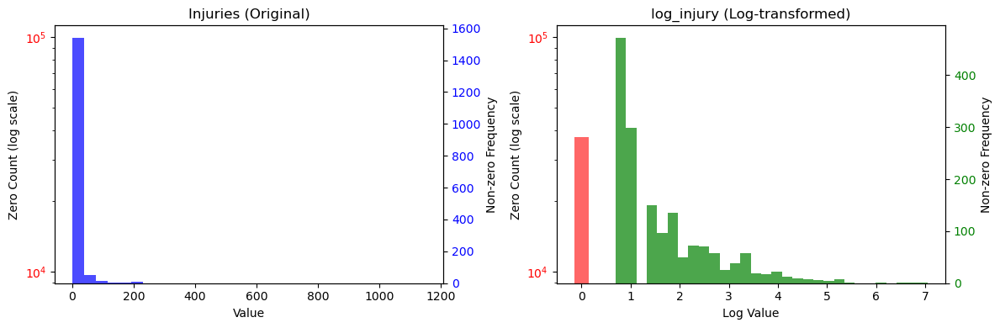

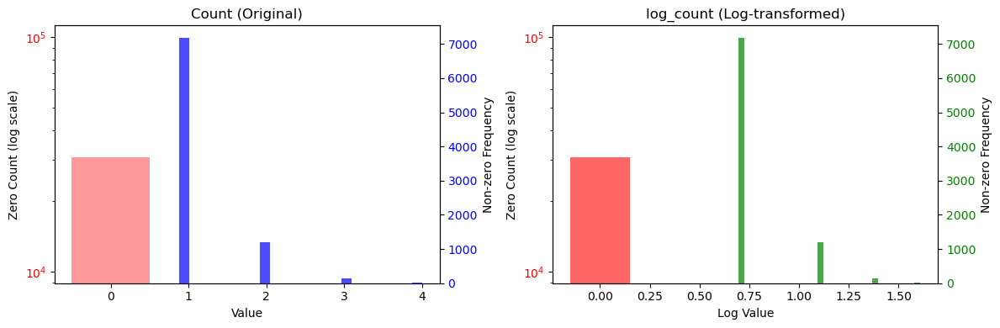

In [308]:
hist_plot(df_year_nmr_tornado_medhigh)

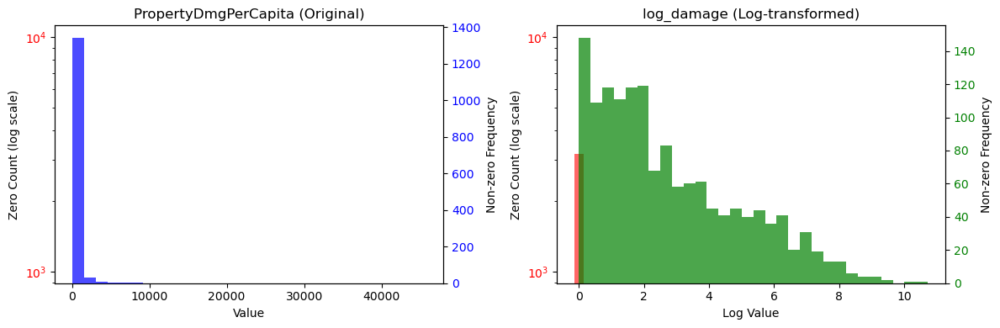

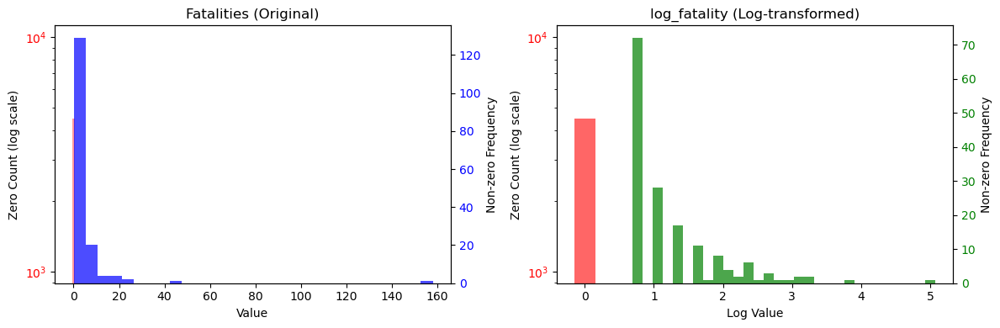

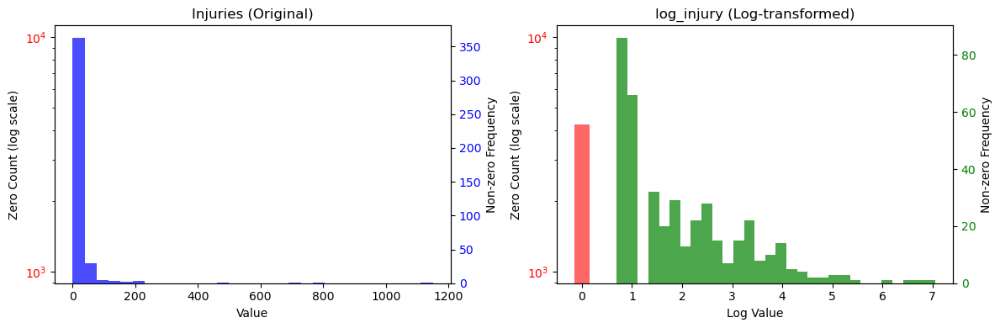

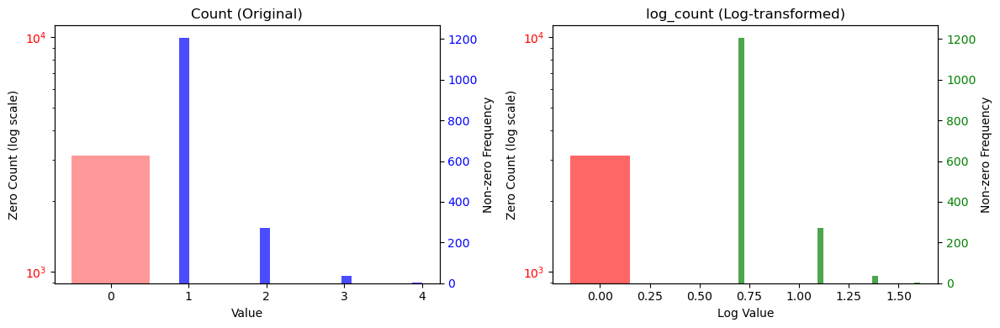

In [309]:
hist_plot(df_year_nmr_tornado_high)

In [245]:
for i in used_vars_0:
    exog_vars_current = i
    print("all")
    fe_current = run_panel_regression_single(df_flood, exog_vars_current, "Flood")
    
for i in used_vars_1:
    exog_vars_current = i
    print("all_1lag")
    fe_current = run_panel_regression_single1(df_flood, exog_vars_current, "Flood")
    
for i in used_vars_0:
    exog_vars_current = i
    print("medhigh")
    fe_current = run_panel_regression_single(df_flood_medhigh, exog_vars_current, "Flood")
    
for i in used_vars_1:
    exog_vars_current = i
    print("medhigh_1lag")
    fe_current = run_panel_regression_single1(df_flood_medhigh, exog_vars_current, "Flood")
    
for i in used_vars_0:
    exog_vars_current = i
    print("high")
    fe_current = run_panel_regression_single(df_flood_high, exog_vars_current, "Flood")
    
for i in used_vars_1:
    exog_vars_current = i
    print("high_1lag")
    fe_current = run_panel_regression_single1(df_flood_high, exog_vars_current, "Flood")
    

all

📘 Fixed Effects Results in current year – Flood
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0012
Estimator:                   PanelOLS   R-squared (Between):              0.0033
No. Observations:               58740   R-squared (Within):               0.0011
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0018
Time:                        00:45:03   Log-likelihood                -2.292e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      64.490
Entities:                        2937   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                 F(1,55783)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (rob


📘 Fixed Effects Results in 1 year lag – Flood
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     6.582e-05
Estimator:                   PanelOLS   R-squared (Between):             -0.0010
No. Observations:               58740   R-squared (Within):            1.783e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):             -0.0003
Time:                        00:45:04   Log-likelihood                -2.292e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      3.6718
Entities:                        2937   P-value                           0.0553
Avg Obs:                       20.000   Distribution:                 F(1,55783)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust): 


📘 Fixed Effects Results in current year – Flood
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0011
Estimator:                   PanelOLS   R-squared (Between):              0.0043
No. Observations:               48120   R-squared (Within):               0.0010
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0020
Time:                        00:45:05   Log-likelihood                -1.893e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      49.955
Entities:                        2406   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                 F(1,45694)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust)


📘 Fixed Effects Results in 1 year lag – Flood
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     5.623e-05
Estimator:                   PanelOLS   R-squared (Between):             -0.0012
No. Observations:               48120   R-squared (Within):            2.183e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):             -0.0003
Time:                        00:45:07   Log-likelihood                -1.893e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      2.5696
Entities:                        2406   P-value                           0.1089
Avg Obs:                       20.000   Distribution:                 F(1,45694)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust): 


📘 Fixed Effects Results in current year – Flood
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     2.745e-05
Estimator:                   PanelOLS   R-squared (Between):              0.0035
No. Observations:                5020   R-squared (Within):           -6.289e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0014
Time:                        00:45:08   Log-likelihood                -1.806e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.1304
Entities:                         251   P-value                           0.7181
Avg Obs:                       20.000   Distribution:                  F(1,4749)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust)


📘 Fixed Effects Results in 1 year lag – Flood
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     5.378e-05
Estimator:                   PanelOLS   R-squared (Between):             -0.0048
No. Observations:                5020   R-squared (Within):               0.0001
Date:                Wed, Jul 30 2025   R-squared (Overall):             -0.0019
Time:                        00:45:08   Log-likelihood                -1.806e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.2554
Entities:                         251   P-value                           0.6133
Avg Obs:                       20.000   Distribution:                  F(1,4749)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust): 

In [246]:
for i in used_vars_0:
    exog_vars_current = i
    print("all")
    fe_current = run_panel_regression_single(df_hurricane, exog_vars_current, "Hurricane")
    
for i in used_vars_1:
    exog_vars_current = i
    print("all_1lag")
    fe_current = run_panel_regression_single1(df_hurricane, exog_vars_current, "Hurricane")
    
for i in used_vars_0:
    exog_vars_current = i
    print("medhigh")
    fe_current = run_panel_regression_single(df_hurricane_medhigh, exog_vars_current, "Hurricane")
    
for i in used_vars_1:
    exog_vars_current = i
    print("medhigh_1lag")
    fe_current = run_panel_regression_single1(df_hurricane_medhigh, exog_vars_current, "Hurricane")
    
for i in used_vars_0:
    exog_vars_current = i
    print("high")
    fe_current = run_panel_regression_single(df_hurricane_high, exog_vars_current, "Hurricane")
    
for i in used_vars_1:
    exog_vars_current = i
    print("high_1lag")
    fe_current = run_panel_regression_single1(df_hurricane_high, exog_vars_current, "Hurricane")
    

all

📘 Fixed Effects Results in current year – Hurricane
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0084
Estimator:                   PanelOLS   R-squared (Between):             -0.0127
No. Observations:               16800   R-squared (Within):               0.0064
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0005
Time:                        00:45:43   Log-likelihood                -6.966e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      135.76
Entities:                         840   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                 F(1,15940)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic 


📘 Fixed Effects Results in 1 year lag – Hurricane
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0062
Estimator:                   PanelOLS   R-squared (Between):              0.0013
No. Observations:               16800   R-squared (Within):               0.0066
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0050
Time:                        00:45:43   Log-likelihood                -6.968e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      99.818
Entities:                         840   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                 F(1,15940)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robus


📘 Fixed Effects Results in current year – Hurricane
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     7.906e-05
Estimator:                   PanelOLS   R-squared (Between):             -0.0010
No. Observations:               11660   R-squared (Within):            4.242e-06
Date:                Wed, Jul 30 2025   R-squared (Overall):             -0.0003
Time:                        00:45:44   Log-likelihood                -4.982e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.8743
Entities:                         583   P-value                           0.3498
Avg Obs:                       20.000   Distribution:                 F(1,11057)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (rob


📘 Fixed Effects Results in current year – Hurricane
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0166
Estimator:                   PanelOLS   R-squared (Between):             -0.0634
No. Observations:                2300   R-squared (Within):               0.0262
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0180
Time:                        00:45:44   Log-likelihood                -1.137e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      36.484
Entities:                         115   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                  F(1,2165)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (rob


📘 Fixed Effects Results in 1 year lag – Hurricane
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0158
Estimator:                   PanelOLS   R-squared (Between):             -0.0202
No. Observations:                2300   R-squared (Within):               0.0138
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0107
Time:                        00:45:45   Log-likelihood                -1.137e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      34.646
Entities:                         115   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                  F(1,2165)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robus

In [247]:
for i in used_vars_0:
    exog_vars_current = i
    print("all")
    fe_current = run_panel_regression_single(df_wildfire, exog_vars_current, "wildfire")
    
for i in used_vars_1:
    exog_vars_current = i
    print("all_1lag")
    fe_current = run_panel_regression_single1(df_wildfire, exog_vars_current, "wildfire")
    
for i in used_vars_0:
    exog_vars_current = i
    print("medhigh")
    fe_current = run_panel_regression_single(df_wildfire_medhigh, exog_vars_current, "wildfire")
    
for i in used_vars_1:
    exog_vars_current = i
    print("medhigh_1lag")
    fe_current = run_panel_regression_single1(df_wildfire_medhigh, exog_vars_current, "wildfire")
    
for i in used_vars_0:
    exog_vars_current = i
    print("high")
    fe_current = run_panel_regression_single(df_wildfire_high, exog_vars_current, "wildfire")
    
for i in used_vars_1:
    exog_vars_current = i
    print("high_1lag")
    fe_current = run_panel_regression_single1(df_wildfire_high, exog_vars_current, "wildfire")
    

all

📘 Fixed Effects Results in current year – wildfire
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0002
Estimator:                   PanelOLS   R-squared (Between):             -0.0012
No. Observations:               13220   R-squared (Within):               0.0004
Date:                Wed, Jul 30 2025   R-squared (Overall):             -0.0003
Time:                        00:46:19   Log-likelihood                -5.102e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      2.0868
Entities:                         661   P-value                           0.1486
Avg Obs:                       20.000   Distribution:                 F(1,12539)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (


📘 Fixed Effects Results in 1 year lag – wildfire
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     8.784e-06
Estimator:                   PanelOLS   R-squared (Between):              0.0003
No. Observations:               13220   R-squared (Within):           -4.481e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):           8.771e-05
Time:                        00:46:19   Log-likelihood                -5.102e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.1101
Entities:                         661   P-value                           0.7400
Avg Obs:                       20.000   Distribution:                 F(1,12539)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust

                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0002
Estimator:                   PanelOLS   R-squared (Between):             -0.0017
No. Observations:                8920   R-squared (Within):               0.0005
Date:                Wed, Jul 30 2025   R-squared (Overall):             -0.0003
Time:                        00:46:20   Log-likelihood                -3.482e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      2.0386
Entities:                         446   P-value                           0.1534
Avg Obs:                       20.000   Distribution:                  F(1,8454)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust):             2.0386
                            


📘 Fixed Effects Results in 1 year lag – wildfire
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     2.748e-05
Estimator:                   PanelOLS   R-squared (Between):             -0.0006
No. Observations:                8920   R-squared (Within):            4.817e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):             -0.0002
Time:                        00:46:20   Log-likelihood                -3.483e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.2323
Entities:                         446   P-value                           0.6298
Avg Obs:                       20.000   Distribution:                  F(1,8454)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust


📘 Fixed Effects Results in current year – wildfire
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0054
Estimator:                   PanelOLS   R-squared (Between):             -0.0122
No. Observations:                 980   R-squared (Within):               0.0061
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0009
Time:                        00:46:21   Log-likelihood                   -3886.1
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      4.9555
Entities:                          49   P-value                           0.0263
Avg Obs:                       20.000   Distribution:                   F(1,911)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robu


📘 Fixed Effects Results in 1 year lag – wildfire
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0004
Estimator:                   PanelOLS   R-squared (Between):             -0.0108
No. Observations:                 980   R-squared (Within):               0.0017
Date:                Wed, Jul 30 2025   R-squared (Overall):             -0.0019
Time:                        00:46:21   Log-likelihood                   -3888.6
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.3684
Entities:                          49   P-value                           0.5441
Avg Obs:                       20.000   Distribution:                   F(1,911)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust

In [248]:
for i in used_vars_0:
    exog_vars_current = i
    print("all")
    fe_current = run_panel_regression_single(df_tornado, exog_vars_current, "tornado")
    
for i in used_vars_1:
    exog_vars_current = i
    print("all_1lag")
    fe_current = run_panel_regression_single1(df_tornado, exog_vars_current, "tornado")
    
for i in used_vars_0:
    exog_vars_current = i
    print("medhigh")
    fe_current = run_panel_regression_single(df_tornado_medhigh, exog_vars_current, "tornado")
    
for i in used_vars_1:
    exog_vars_current = i
    print("medhigh_1lag")
    fe_current = run_panel_regression_single1(df_tornado_medhigh, exog_vars_current, "tornado")
    
for i in used_vars_0:
    exog_vars_current = i
    print("high")
    fe_current = run_panel_regression_single(df_tornado_high, exog_vars_current, "tornado")
    
for i in used_vars_1:
    exog_vars_current = i
    print("high_1lag")
    fe_current = run_panel_regression_single1(df_tornado_high, exog_vars_current, "tornado")
    

all

📘 Fixed Effects Results in current year – tornado
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     2.833e-05
Estimator:                   PanelOLS   R-squared (Between):              0.0006
No. Observations:               50100   R-squared (Within):            2.225e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0002
Time:                        00:46:50   Log-likelihood                 -1.94e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      1.3476
Entities:                        2505   P-value                           0.2457
Avg Obs:                       20.000   Distribution:                 F(1,47575)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (r


📘 Fixed Effects Results in 1 year lag – tornado
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     7.475e-06
Estimator:                   PanelOLS   R-squared (Between):              0.0003
No. Observations:               50100   R-squared (Within):            2.515e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0001
Time:                        00:46:51   Log-likelihood                 -1.94e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.3556
Entities:                        2505   P-value                           0.5509
Avg Obs:                       20.000   Distribution:                 F(1,47575)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust)


📘 Fixed Effects Results in current year – tornado
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     3.171e-05
Estimator:                   PanelOLS   R-squared (Between):              0.0008
No. Observations:               39220   R-squared (Within):            1.994e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0003
Time:                        00:46:52   Log-likelihood                -1.545e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      1.1809
Entities:                        1961   P-value                           0.2772
Avg Obs:                       20.000   Distribution:                 F(1,37239)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robus


📘 Fixed Effects Results in 1 year lag – tornado
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     1.358e-05
Estimator:                   PanelOLS   R-squared (Between):              0.0006
No. Observations:               39220   R-squared (Within):            3.391e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0002
Time:                        00:46:53   Log-likelihood                -1.545e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.5057
Entities:                        1961   P-value                           0.4770
Avg Obs:                       20.000   Distribution:                 F(1,37239)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust)


📘 Fixed Effects Results in current year – tornado
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0011
Estimator:                   PanelOLS   R-squared (Between):              0.0049
No. Observations:                4640   R-squared (Within):               0.0001
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0023
Time:                        00:46:54   Log-likelihood                -1.679e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      4.7305
Entities:                         232   P-value                           0.0297
Avg Obs:                       20.000   Distribution:                  F(1,4388)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robus


📘 Fixed Effects Results in 1 year lag – tornado
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     2.848e-05
Estimator:                   PanelOLS   R-squared (Between):              0.0010
No. Observations:                4640   R-squared (Within):             7.76e-05
Date:                Wed, Jul 30 2025   R-squared (Overall):              0.0005
Time:                        00:46:54   Log-likelihood                -1.679e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.1250
Entities:                         232   P-value                           0.7237
Avg Obs:                       20.000   Distribution:                  F(1,4388)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust)

## All Variables

In [218]:
df_used = df_year_nmr_flood_high.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Flood")

df_used = df_year_nmr_flood_high.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Flood")


📘 Fixed Effects Results in current year – Flood
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0007
Estimator:                   PanelOLS   R-squared (Between):             -0.0008
No. Observations:                5020   R-squared (Within):               0.0005
Date:                Mon, Jul 28 2025   R-squared (Overall):          -3.168e-05
Time:                        17:01:43   Log-likelihood                -1.806e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.8271
Entities:                         251   P-value                           0.5077
Avg Obs:                       20.000   Distribution:                  F(4,4746)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust)

In [219]:
df_used = df_year_nmr_flood_medhigh.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Flood")

df_used = df_year_nmr_flood_medhigh.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Flood")


📘 Fixed Effects Results in current year – Flood
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0012
Estimator:                   PanelOLS   R-squared (Between):              0.0068
No. Observations:               48120   R-squared (Within):               0.0011
Date:                Mon, Jul 28 2025   R-squared (Overall):              0.0028
Time:                        17:01:54   Log-likelihood                -1.893e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      14.207
Entities:                        2406   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                 F(4,45691)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust)

In [220]:
df_used = df_year_nmr_flood.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Flood")

df_used = df_year_nmr_flood.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Flood")


📘 Fixed Effects Results in current year – Flood
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0013
Estimator:                   PanelOLS   R-squared (Between):              0.0062
No. Observations:               58740   R-squared (Within):               0.0012
Date:                Mon, Jul 28 2025   R-squared (Overall):              0.0028
Time:                        17:02:34   Log-likelihood                -2.292e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      18.203
Entities:                        2937   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                 F(4,55780)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robust)

In [221]:
df_used = df_year_nmr_hurricane_high.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Hurricane")

df_used = df_year_nmr_hurricane_high.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Hurricane")


📘 Fixed Effects Results in current year – Hurricane
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.3512
Estimator:                   PanelOLS   R-squared (Between):             -0.1375
No. Observations:                2300   R-squared (Within):               0.3570
Date:                Mon, Jul 28 2025   R-squared (Overall):              0.3117
Time:                        17:02:47   Log-likelihood                -1.089e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      292.52
Entities:                         115   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                  F(4,2162)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (rob

In [222]:
df_used = df_year_nmr_hurricane_medhigh.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Hurricane")

df_used = df_year_nmr_hurricane_medhigh.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Hurricane")


📘 Fixed Effects Results in current year – Hurricane
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.2260
Estimator:                   PanelOLS   R-squared (Between):             -0.0371
No. Observations:               11660   R-squared (Within):               0.2207
Date:                Mon, Jul 28 2025   R-squared (Overall):              0.1559
Time:                        17:02:50   Log-likelihood                -4.833e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      806.76
Entities:                         583   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                 F(4,11054)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (rob

In [223]:
df_used = df_year_nmr_hurricane.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Hurricane")

df_used = df_year_nmr_hurricane.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Hurricane")


📘 Fixed Effects Results in current year – Hurricane
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.1948
Estimator:                   PanelOLS   R-squared (Between):             -0.0202
No. Observations:               16800   R-squared (Within):               0.1878
Date:                Mon, Jul 28 2025   R-squared (Overall):              0.1231
Time:                        17:02:55   Log-likelihood                -6.791e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      963.71
Entities:                         840   P-value                           0.0000
Avg Obs:                       20.000   Distribution:                 F(4,15937)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (rob

In [224]:
df_used = df_year_nmr_tornado_high.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Tornado")

df_used = df_year_nmr_tornado_high.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Tornado")


📘 Fixed Effects Results in current year – Tornado
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0022
Estimator:                   PanelOLS   R-squared (Between):              0.0044
No. Observations:                4640   R-squared (Within):               0.0010
Date:                Mon, Jul 28 2025   R-squared (Overall):              0.0025
Time:                        17:03:00   Log-likelihood                -1.679e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      2.4710
Entities:                         232   P-value                           0.0426
Avg Obs:                       20.000   Distribution:                  F(4,4385)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robus

In [225]:
df_used = df_year_nmr_tornado_medhigh.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Tornado")

df_used = df_year_nmr_tornado_medhigh.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Tornado")


📘 Fixed Effects Results in current year – Tornado
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     8.505e-05
Estimator:                   PanelOLS   R-squared (Between):              0.0012
No. Observations:               39220   R-squared (Within):             8.39e-05
Date:                Mon, Jul 28 2025   R-squared (Overall):              0.0004
Time:                        17:03:03   Log-likelihood                -1.545e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      0.7918
Entities:                        1961   P-value                           0.5303
Avg Obs:                       20.000   Distribution:                 F(4,37236)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robus

In [226]:
df_used = df_year_nmr_tornado.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Tornado")

df_used = df_year_nmr_tornado.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Tornado")


📘 Fixed Effects Results in current year – Tornado
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                     8.689e-05
Estimator:                   PanelOLS   R-squared (Between):             -0.0002
No. Observations:               50100   R-squared (Within):               0.0001
Date:                Mon, Jul 28 2025   R-squared (Overall):           5.156e-06
Time:                        17:03:07   Log-likelihood                 -1.94e+05
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      1.0335
Entities:                        2505   P-value                           0.3882
Avg Obs:                       20.000   Distribution:                 F(4,47572)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robus

In [227]:
df_used = df_year_nmr_wildfire_high.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Wildfire")

df_used = df_year_nmr_wildfire_high.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Wildfire")


📘 Fixed Effects Results in current year – Wildfire
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0078
Estimator:                   PanelOLS   R-squared (Between):             -0.0327
No. Observations:                 980   R-squared (Within):               0.0116
Date:                Mon, Jul 28 2025   R-squared (Overall):             -0.0010
Time:                        17:03:12   Log-likelihood                   -3884.9
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      1.7772
Entities:                          49   P-value                           0.1313
Avg Obs:                       20.000   Distribution:                   F(4,908)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robu

In [228]:
df_used = df_year_nmr_wildfire_medhigh.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Wildfire")

df_used = df_year_nmr_wildfire_medhigh.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Wildfire")


📘 Fixed Effects Results in current year – Wildfire
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0010
Estimator:                   PanelOLS   R-squared (Between):             -0.0073
No. Observations:                8920   R-squared (Within):               0.0012
Date:                Mon, Jul 28 2025   R-squared (Overall):             -0.0021
Time:                        17:03:15   Log-likelihood                -3.482e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      2.0725
Entities:                         446   P-value                           0.0816
Avg Obs:                       20.000   Distribution:                  F(4,8451)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robu

In [229]:
df_used = df_year_nmr_wildfire.set_index(["FIPS", "Year"])
used_vars = ["log_damage",
#              "log_damage_lag1",
             "log_fatality",
#              "log_fatality_lag1",
             "log_injury",
#              "log_injury_lag1",
             "log_count",
#              "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in current year – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Wildfire")

df_used = df_year_nmr_wildfire.set_index(["FIPS", "Year"])
used_vars = [
#              "log_damage",
             "log_damage_lag1",
#              "log_fatality",
             "log_fatality_lag1",
#              "log_injury",
             "log_injury_lag1",
#              "log_count",
             "log_count_lag1",
#              "Existance",
#              "Existance_lag1"
            ]
def run_panel_regression(df, exog_vars, name="Model"):
    # Drop rows with NaNs in any exog or endog
    model_df = df[exog_vars + ['NMR']].dropna()
    exog = model_df[exog_vars]
    endog = model_df['NMR']
    
    fe_model = PanelOLS(endog, exog, entity_effects=True, time_effects=True)
    fe_result = fe_model.fit()

    print(f"\n📘 Fixed Effects Results in 1 year lag – {name}")
    print(fe_result)

    return fe_result
exog_vars_current = used_vars 
fe_current = run_panel_regression(df_used, exog_vars_current, "Wildfire")


📘 Fixed Effects Results in current year – Wildfire
                          PanelOLS Estimation Summary                           
Dep. Variable:                    NMR   R-squared:                        0.0007
Estimator:                   PanelOLS   R-squared (Between):             -0.0057
No. Observations:               13220   R-squared (Within):               0.0010
Date:                Mon, Jul 28 2025   R-squared (Overall):             -0.0017
Time:                        17:03:20   Log-likelihood                -5.102e+04
Cov. Estimator:            Unadjusted                                           
                                        F-statistic:                      2.1908
Entities:                         661   P-value                           0.0674
Avg Obs:                       20.000   Distribution:                 F(4,12536)
Min Obs:                       20.000                                           
Max Obs:                       20.000   F-statistic (robu

## Preprocessing for Time Series Analysis, XGBOOST, and regression analysis

In [45]:
SHELDUS_0020_hurricane = SHELDUS_0020_sel[SHELDUS_0020_sel["Hazard"]=="Hurricane/Tropical Storm"].reset_index()
SHELDUS_0020_flooding  = SHELDUS_0020_sel[SHELDUS_0020_sel["Hazard"]=="Flooding"].reset_index()

In [46]:
hurricane_induced_floods = pd.merge(
    SHELDUS_0020_flooding, 
    SHELDUS_0020_hurricane, 
    on=['County FIPS', 'Year', 'Month'],
    suffixes=('_flood', '_hurricane')
)
flood_indices = hurricane_induced_floods['index_flood']

In [47]:
SHELDUS_0020_sel.loc[flood_indices, 'Hazard'] = 'Hurricane/Tropical Storm'

In [48]:
SHELDUS_0020_use = SHELDUS_0020_sel[(SHELDUS_0020_sel["Fatalities"]!=0)|(SHELDUS_0020_sel["Injuries"]!=0)|(SHELDUS_0020_sel["PropertyDmgPerCapita(ADJ 2020)"]>1)]
def calculate_period(row):
    year = row['Year']
    month = row['Month']
    # If month is from July to December, the period is the current year
    if month >= 7:
        return year +1
    # If month is from January to June, the period is the previous year
    else:
        return year

# Apply the function to the dataframe
SHELDUS_0020_use['Period'] = SHELDUS_0020_use.apply(calculate_period, axis=1)
SHELDUS_0020_use["Year"] = SHELDUS_0020_use["Period"]
SHELDUS_0020_use_group = SHELDUS_0020_use.groupby(["County FIPS","Hazard","Year"]).agg({"Month":"count",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        
                                                                                        
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean",
                                                                                       "CropDmg(ADJ 2020)":"sum",
                                                                                       "CropDmgPerCapita(ADJ 2020)":"mean"}).reset_index()
SHELDUS_0020_use_group = SHELDUS_0020_use_group.rename(columns={"Month":"count"})

# SHELDUS_0020_use_group["Loss"] = SHELDUS_0020_use_group["Fatalities"] * 11600000 + SHELDUS_0020_use_group["Injuries"] / 10 * 11600000 + SHELDUS_0020_use_group["PropertyDmg(ADJ 2020)"]

df_20_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean",
                                                                                        "CropDmg(ADJ 2020)":"sum",
                                                                                        "CropDmgPerCapita(ADJ 2020)":"mean"
                                                                                        }).reset_index()


C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\2773851128.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_0020_use['Period'] = SHELDUS_0020_use.apply(calculate_period, axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\2773851128.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_0020_use["Year"] = SHELDUS_0020_use["Period"]


In [49]:
df_20_years_by_county = df_20_years_by_county.rename(columns={"count":"frequency"})

In [50]:
def classify_impact(data, value_column):
    Q1 = data[value_column].quantile(0.25)
    Q3 = data[value_column].quantile(0.75)
    
    def classification(value):
        if value <= Q1:
            return 'Low Impact'
        elif (value > Q1) & (value < Q3):
            return 'Moderate Impact'
        elif value >= Q3:
            return 'High Impact'
    
    return data[value_column].apply(classification)

In [51]:
def classify_combined_impact(data, column1, column2, new_column):
    def determine_impact(impact1, impact2):
        if impact1 == 'High Impact' and impact2 == 'High Impact':
            return 'High Impact'
        elif impact1 == 'Low Impact' and impact2 == 'Low Impact':
            return 'Low Impact'
        else:
            return 'Moderate Impact'

    data[new_column] = data.apply(lambda row: determine_impact(row[column1], row[column2]), axis=1)
    return data

In [52]:
disaster_list = ['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado']
SHELDUS_20_use_flooding  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Flooding"]
SHELDUS_20_use_hurricane = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_20_use_wildfire  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Wildfire"]
# SHELDUS_20_use_heat      = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Heat"]
SHELDUS_20_use_tornado   = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Tornado"]


SHELDUS_20_use_flooding['ImpactLevel_1'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_hurricane['ImpactLevel_1'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_wildfire['ImpactLevel_1'] = classify_impact(SHELDUS_20_use_wildfire, "PropertyDmgPerCapita(ADJ 2020)")
# SHELDUS_20_use_heat['ImpactLevel_1'] = classify_impact(SHELDUS_20_use_heat, "Loss")
SHELDUS_20_use_tornado['ImpactLevel_1'] = classify_impact(SHELDUS_20_use_tornado, "PropertyDmgPerCapita(ADJ 2020)")

SHELDUS_20_use_flooding['ImpactLevel_2'] = classify_impact(SHELDUS_20_use_flooding, "frequency")
SHELDUS_20_use_hurricane['ImpactLevel_2'] = classify_impact(SHELDUS_20_use_hurricane,"frequency")
SHELDUS_20_use_wildfire['ImpactLevel_2'] = classify_impact(SHELDUS_20_use_wildfire, "frequency")
# SHELDUS_20_use_heat['ImpactLevel_2'] = classify_impact(SHELDUS_20_use_heat, "frequency")
SHELDUS_20_use_tornado['ImpactLevel_2'] = classify_impact(SHELDUS_20_use_tornado, "frequency")

SHELDUS_20_use_flooding = classify_combined_impact(SHELDUS_20_use_flooding, 'ImpactLevel_1', 'ImpactLevel_2', 'ImpactLevel')
SHELDUS_20_use_hurricane = classify_combined_impact(SHELDUS_20_use_hurricane, 'ImpactLevel_1', 'ImpactLevel_2', 'ImpactLevel')
SHELDUS_20_use_wildfire = classify_combined_impact(SHELDUS_20_use_wildfire, 'ImpactLevel_1', 'ImpactLevel_2', 'ImpactLevel')
# SHELDUS_20_use_heat = classify_combined_impact(SHELDUS_20_use_heat, 'ImpactLevel_1', 'ImpactLevel_2', 'ImpactLevel')
SHELDUS_20_use_tornado = classify_combined_impact(SHELDUS_20_use_tornado, 'ImpactLevel_1', 'ImpactLevel_2', 'ImpactLevel')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\4100627513.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_flooding['ImpactLevel_1'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\4100627513.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_hurricane['ImpactLevel_1'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykern

In [53]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [54]:
flooding_list = list(SHELDUS_20_use_flooding["County FIPS"])
flooding_high_list = list(SHELDUS_20_use_flooding[SHELDUS_20_use_flooding["ImpactLevel"] == "High Impact"]["County FIPS"])
flooding_low_list = list(SHELDUS_20_use_flooding[SHELDUS_20_use_flooding["ImpactLevel"] == "Low Impact"]["County FIPS"])
flooding_med_list = list(SHELDUS_20_use_flooding[SHELDUS_20_use_flooding["ImpactLevel"] == "Moderate Impact"]["County FIPS"])

hurricane_list = list(SHELDUS_20_use_hurricane["County FIPS"])
hurricane_high_list = list(SHELDUS_20_use_hurricane[SHELDUS_20_use_hurricane["ImpactLevel"] == "High Impact"]["County FIPS"])
hurricane_low_list = list(SHELDUS_20_use_hurricane[SHELDUS_20_use_hurricane["ImpactLevel"] == "Low Impact"]["County FIPS"])
hurricane_med_list = list(SHELDUS_20_use_hurricane[SHELDUS_20_use_hurricane["ImpactLevel"] == "Moderate Impact"]["County FIPS"])

wildfire_list = list(SHELDUS_20_use_wildfire["County FIPS"])
wildfire_high_list = list(SHELDUS_20_use_wildfire[SHELDUS_20_use_wildfire["ImpactLevel"] == "High Impact"]["County FIPS"])
wildfire_low_list = list(SHELDUS_20_use_wildfire[SHELDUS_20_use_wildfire["ImpactLevel"] == "Low Impact"]["County FIPS"])
wildfire_med_list = list(SHELDUS_20_use_wildfire[SHELDUS_20_use_wildfire["ImpactLevel"] == "Moderate Impact"]["County FIPS"])

# heat_list = list(SHELDUS_20_use_heat["County FIPS"])
# heat_high_list = list(SHELDUS_20_use_heat[SHELDUS_20_use_heat["ImpactLevel"] == "High Impact"]["County FIPS"])
# heat_low_list = list(SHELDUS_20_use_heat[SHELDUS_20_use_heat["ImpactLevel"] == "Low Impact"]["County FIPS"])
# heat_med_list = list(SHELDUS_20_use_heat[SHELDUS_20_use_heat["ImpactLevel"] == "Moderate Impact"]["County FIPS"])

tornado_list = list(SHELDUS_20_use_tornado["County FIPS"])
tornado_high_list = list(SHELDUS_20_use_tornado[SHELDUS_20_use_tornado["ImpactLevel"] == "High Impact"]["County FIPS"])
tornado_low_list = list(SHELDUS_20_use_tornado[SHELDUS_20_use_tornado["ImpactLevel"] == "Low Impact"]["County FIPS"])
tornado_med_list = list(SHELDUS_20_use_tornado[SHELDUS_20_use_tornado["ImpactLevel"] == "Moderate Impact"]["County FIPS"])

In [55]:
yearly_flooding_all      = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_list)]
yearly_flooding_all_mean = yearly_flooding_all[correct_netmig_columns].mean()
yearly_flooding_high     = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_high_list)] 
yearly_flooding_high_mean= yearly_flooding_high[correct_netmig_columns].mean()
yearly_flooding_low      = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_low_list)] 
yearly_flooding_low_mean = yearly_flooding_low[correct_netmig_columns].mean()
yearly_flooding_med      = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_med_list)] 
yearly_flooding_med_mean = yearly_flooding_med[correct_netmig_columns].mean()

yearly_hurricane_all      = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_list)]
yearly_hurricane_all_mean = yearly_hurricane_all[correct_netmig_columns].mean()
yearly_hurricane_high     = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_high_list)] 
yearly_hurricane_high_mean= yearly_hurricane_high[correct_netmig_columns].mean()
yearly_hurricane_low      = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_low_list)] 
yearly_hurricane_low_mean = yearly_hurricane_low[correct_netmig_columns].mean()
yearly_hurricane_med      = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_med_list)] 
yearly_hurricane_med_mean = yearly_hurricane_med[correct_netmig_columns].mean()

yearly_wildfire_all      = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_list)]
yearly_wildfire_all_mean = yearly_wildfire_all[correct_netmig_columns].mean()
yearly_wildfire_high     = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_high_list)] 
yearly_wildfire_high_mean= yearly_wildfire_high[correct_netmig_columns].mean()
yearly_wildfire_low      = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_low_list)] 
yearly_wildfire_low_mean = yearly_wildfire_low[correct_netmig_columns].mean()
yearly_wildfire_med      = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_med_list)] 
yearly_wildfire_med_mean = yearly_wildfire_med[correct_netmig_columns].mean()

# yearly_heat_all      = df_pep_0120[df_pep_0120["FIPS"].isin(heat_list)]
# yearly_heat_all_mean = yearly_heat_all[correct_netmig_columns].mean()
# yearly_heat_high     = df_pep_0120[df_pep_0120["FIPS"].isin(heat_high_list)] 
# yearly_heat_high_mean= yearly_heat_high[correct_netmig_columns].mean()
# yearly_heat_low      = df_pep_0120[df_pep_0120["FIPS"].isin(heat_low_list)] 
# yearly_heat_low_mean = yearly_heat_low[correct_netmig_columns].mean()
# yearly_heat_med      = df_pep_0120[df_pep_0120["FIPS"].isin(heat_med_list)] 
# yearly_heat_med_mean = yearly_heat_med[correct_netmig_columns].mean()

yearly_tornado_all      = df_pep_0120[df_pep_0120["FIPS"].isin(tornado_list)]
yearly_tornado_all_mean = yearly_tornado_all[correct_netmig_columns].mean()
yearly_tornado_high     = df_pep_0120[df_pep_0120["FIPS"].isin(tornado_high_list)] 
yearly_tornado_high_mean= yearly_tornado_high[correct_netmig_columns].mean()
yearly_tornado_low      = df_pep_0120[df_pep_0120["FIPS"].isin(tornado_low_list)] 
yearly_tornado_low_mean = yearly_tornado_low[correct_netmig_columns].mean()
yearly_tornado_med      = df_pep_0120[df_pep_0120["FIPS"].isin(tornado_med_list)] 
yearly_tornado_med_mean = yearly_tornado_med[correct_netmig_columns].mean()

In [56]:
disaster_list = ['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado']
Year_list = []
Disaster_list= []
for each in disaster_list:
    df_disaster_year_temp = SHELDUS_0020_use_group[SHELDUS_0020_use_group["Hazard"]==each]
    df_disaster_year_temp = df_disaster_year_temp.groupby("Year").sum("PropertyDmg(ADJ 2020)").reset_index()
    df_disaster_year_temp.sort_values("Year")
    Year_list.append(df_disaster_year_temp.Year.unique())
    Disaster_list.append(df_disaster_year_temp["PropertyDmg(ADJ 2020)"].unique())

In [57]:
flood_dmg_list = Disaster_list[0]
log_flood_dmg = np.log10(flood_dmg_list)
hurricane_dmg_list = Disaster_list[1]
log_hurricane_dmg = np.log10(hurricane_dmg_list)
wildfire_dmg_list = Disaster_list[2]
log_wildfire_dmg = np.log10(wildfire_dmg_list)
tornado_dmg_list = Disaster_list[3]
log_tornado_dmg = np.log10(tornado_dmg_list)

## Time Series Analysis Result

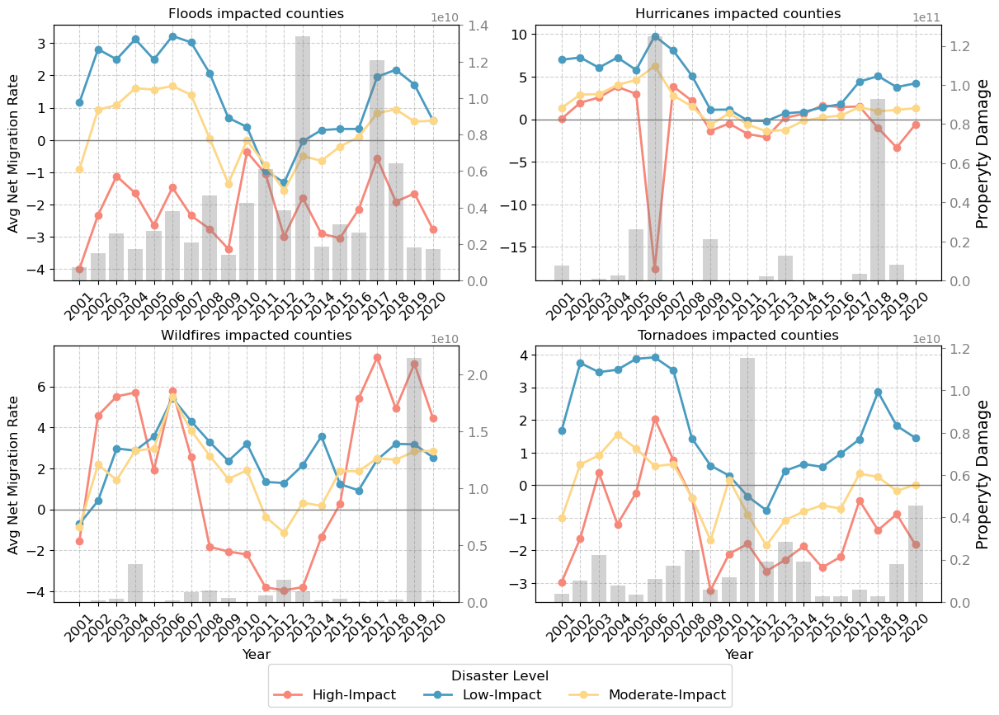

In [58]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)
axes = axes.flatten()
years = list(range(2001, 2021))
fontsize = 12  # Slightly larger font for better readability
bar_x = 2020
bar_width = 0.8
# Improved color palette for visual distinction
colors = ['#499BC0', '#FDD786', '#F78779']

# Plotting data for floods
axes[0].plot(years, yearly_flooding_high_mean.values, marker='o', linestyle='-', color=colors[2], label='High', linewidth=2)
axes[0].plot(years, yearly_flooding_low_mean.values, marker='o', linestyle='-', color=colors[0], label='Low', linewidth=2)
axes[0].plot(years, yearly_flooding_med_mean.values, marker='o', linestyle='-', color=colors[1], label='Medium', linewidth=2)
ax1 = axes[0]
ax2 = ax1.twinx()
ax2.bar(Year_list[0], flood_dmg_list, width=bar_width, color="grey", alpha=0.35)
# ax2.set_ylabel("Properyty Damage", fontsize=14)
ax2.tick_params(axis='y', labelsize=12, colors='gray')
axes[0].set_title("Floods impacted counties", fontsize=fontsize)
# axes[0].set_xlabel("Year", fontsize=fontsize)
axes[0].set_ylabel("Avg Net Migration Rate", fontsize=fontsize)
axes[0].set_xticks(years)
axes[0].set_xticklabels(years, rotation=45, fontsize=fontsize)
axes[0].tick_params(axis='y', labelsize=fontsize)
# axes[0].legend(title="Disaster Level", fontsize=fontsize)
axes[0].grid(True, linestyle='--', alpha=0.6)
axes[0].axhline(0, color='gray', linewidth=1)

# Plotting data for hurricanes
axes[1].plot(years, yearly_hurricane_high_mean.values, marker='o', linestyle='-', color=colors[2], label='High-Impact', linewidth=2)
axes[1].plot(years, yearly_hurricane_low_mean.values, marker='o', linestyle='-', color=colors[0], label='Low-Impact', linewidth=2)
axes[1].plot(years, yearly_hurricane_med_mean.values, marker='o', linestyle='-', color=colors[1], label='Moderate-Impact', linewidth=2)
ax1 = axes[1]
ax2 = ax1.twinx()
ax2.bar(Year_list[1], hurricane_dmg_list, width=bar_width, color="grey", alpha=0.35)
ax2.set_ylabel("Properyty Damage", fontsize=14)
ax2.tick_params(axis='y', labelsize=12, colors='gray')
axes[1].set_title("Hurricanes impacted counties", fontsize=fontsize)
# axes[1].set_xlabel("Year", fontsize=fontsize)
# axes[1].set_ylabel("Avg Net Migration Rate", fontsize=fontsize)
axes[1].set_xticks(years)
axes[1].set_xticklabels(years, rotation=45, fontsize=fontsize)
# axes[1].legend(title="Disaster Level",fontsize=fontsize,loc='best')
axes[1].tick_params(axis='y', labelsize=fontsize)
axes[1].grid(True, linestyle='--', alpha=0.6)
axes[1].axhline(0, color='gray', linewidth=1)

# Plotting data for wildfires
axes[2].plot(years, yearly_wildfire_high_mean.values, marker='o', linestyle='-', color=colors[2], label='High', linewidth=2)
axes[2].plot(years, yearly_wildfire_low_mean.values, marker='o', linestyle='-', color=colors[0], label='Low', linewidth=2)
axes[2].plot(years, yearly_wildfire_med_mean.values, marker='o', linestyle='-', color=colors[1], label='Medium', linewidth=2)
ax1 = axes[2]
ax2 = ax1.twinx()
ax2.bar(Year_list[2], wildfire_dmg_list, width=bar_width, color="grey", alpha=0.35)
# ax2.set_ylabel("Properyty Damage", fontsize=14)
ax2.tick_params(axis='y', labelsize=12, colors='gray')
axes[2].set_title("Wildfires impacted counties", fontsize=fontsize)
axes[2].set_xlabel("Year", fontsize=fontsize)
axes[2].set_ylabel("Avg Net Migration Rate", fontsize=fontsize)
axes[2].set_xticks(years)
axes[2].set_xticklabels(years, rotation=45, fontsize=fontsize)
axes[2].tick_params(axis='y', labelsize=fontsize)
# axes[2].legend(title="Disaster Level", fontsize=fontsize)
axes[2].grid(True, linestyle='--', alpha=0.6)
axes[2].axhline(0, color='gray', linewidth=1)

# Plotting data for tornadoes
axes[3].plot(years, yearly_tornado_high_mean.values, marker='o', linestyle='-', color=colors[2], label='High', linewidth=2)
axes[3].plot(years, yearly_tornado_low_mean.values, marker='o', linestyle='-', color=colors[0], label='Low', linewidth=2)
axes[3].plot(years, yearly_tornado_med_mean.values, marker='o', linestyle='-', color=colors[1], label='Medium', linewidth=2)
ax1 = axes[3]
ax2 = ax1.twinx()
ax2.bar(Year_list[3], tornado_dmg_list, width=bar_width, color="grey", alpha=0.35)
ax2.set_ylabel("Properyty Damage", fontsize=14)
ax2.tick_params(axis='y', labelsize=12, colors='gray')
axes[3].set_title("Tornadoes impacted counties", fontsize=fontsize)
axes[3].set_xlabel("Year", fontsize=fontsize)
# axes[3].set_ylabel("Avg Net Migration Rate", fontsize=fontsize)
axes[3].set_xticks(years)
axes[3].set_xticklabels(years, rotation=45, fontsize=fontsize)
axes[3].tick_params(axis='y', labelsize=fontsize)
# axes[3].legend(title="Disaster Level", fontsize=fontsize)
axes[3].grid(True, linestyle='--', alpha=0.6)
axes[3].axhline(0, color='gray', linewidth=1)

handles, labels = axes[1].get_legend_handles_labels()
fig.legend(handles, labels,
           loc='upper center',
           bbox_to_anchor=(0.5, 0.01),
           ncol=3,
           fontsize=fontsize,
           title='Disaster Level',
           title_fontsize=fontsize)

# plt.tight_layout()
plt.show()

# fig.savefig(r"F:\LongMig2025\results\maps\plot2\NMR_0402.png", dpi=300, bbox_inches="tight")


In [59]:
Floods = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Flooding"]
Floods = Floods.rename(columns={"frequency":"Flood_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Flood_Loss","Fatalities":"Flood_Fatalities","Injuries":"Flood_Injuries"})
Hurricane = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
Hurricane = Hurricane.rename(columns={"frequency":"Hurricane_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Hurricane_Loss","Fatalities":"Hurricane_Fatalities","Injuries":"Hurricane_Injuries"})
Wildfire = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Wildfire"]
Wildfire = Wildfire.rename(columns={"frequency":"Wildfire_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Wildfire_Loss","Fatalities":"Wildfire_Fatalities","Injuries":"Wildfire_Injuries"})
Tornado = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Tornado"]
Tornado = Tornado.rename(columns={"frequency":"Tornado_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Tornado_Loss","Fatalities":"Tornado_Fatalities","Injuries":"Tornado_Injuries"})
# Heat = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Heat"]
# Heat = Heat.rename(columns={"frequency":"Heat_Frequency","PropertyDmgPerCapita(ADJ 2020)":"Heat_Loss","Fatalities":"Heat_Fatalities","Injuries":"Heat_Injuries"})
Floods["Flood_Occur"] = 1
Hurricane["Hurricane_Occur"] = 1
Wildfire["Wildfire_Occur"] = 1
Tornado["Tornado_Occur"] = 1
# Heat["Heat_Occur"] = 1
Floods = Floods[["County FIPS","Flood_Frequency","Flood_Loss","Flood_Occur","Flood_Fatalities","Flood_Injuries"]]
Hurricane = Hurricane[["County FIPS","Hurricane_Frequency","Hurricane_Loss","Hurricane_Occur","Hurricane_Fatalities","Hurricane_Injuries"]]
Wildfire = Wildfire[["County FIPS","Wildfire_Frequency","Wildfire_Loss","Wildfire_Occur","Wildfire_Fatalities","Wildfire_Injuries"]]
Tornado = Tornado[["County FIPS","Tornado_Frequency","Tornado_Loss","Tornado_Occur","Tornado_Fatalities","Tornado_Injuries"]]
# Heat = Heat[["County FIPS","Heat_Frequency","Heat_Loss","Heat_Occur","Heat_Fatalities","Heat_Injuries"]]

In [60]:
Disaster = pd.merge(Floods,Hurricane,on="County FIPS",how='outer')
Disaster = pd.merge(Disaster,Wildfire,on="County FIPS",how='outer')
Disaster = pd.merge(Disaster,Tornado,on="County FIPS",how='outer')
# Disaster = pd.merge(Disaster,Heat,on="County FIPS",how='outer')
Disaster = Disaster.fillna(0)
Disaster["FIPS"] = Disaster["County FIPS"].astype(str).str.rjust(5,"0")

In [61]:
Disaster.head()

,County FIPS,Flood_Frequency,Flood_Loss,Flood_Occur,Flood_Fatalities,Flood_Injuries,Hurricane_Frequency,Hurricane_Loss,Hurricane_Occur,Hurricane_Fatalities,...,Wildfire_Loss,Wildfire_Occur,Wildfire_Fatalities,Wildfire_Injuries,Tornado_Frequency,Tornado_Loss,Tornado_Occur,Tornado_Fatalities,Tornado_Injuries,FIPS
0,01001,5.0,8.460414,1.0,0.0,0.0,2.0,3.644830,1.0,0.0,...,0.0,0.0,0.0,0.0,7.0,49.856793,1.0,3.0,57.0,01001
1,01003,6.0,18.341990,1.0,2.0,1.0,4.0,18.590288,1.0,0.0,...,0.0,0.0,0.0,0.0,5.0,2.931754,1.0,0.0,7.0,01003
2,01005,2.0,1.249390,1.0,0.0,0.0,2.0,1.754460,1.0,0.0,...,0.0,0.0,0.0,0.0,6.0,5.448765,1.0,0.0,4.0,01005
3,01007,1.0,9.961340,1.0,0.0,0.0,2.0,8.162715,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,736.519440,1.0,1.0,10.0,01007
4,01009,2.0,2.889540,1.0,0.0,0.0,1.0,1.463220,1.0,0.0,...,0.0,0.0,0.0,0.0,8.0,74.229791,1.0,0.0,40.0,01009


### Compute Net Migration Rate (NMR)

In [62]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [63]:
df_pep_0120["NetMigrationRateTotal"] = df_pep_0120[correct_netmig_columns].mean(axis=1)
df_pep_0120_used = df_pep_0120[['FIPS','STNAME_x', 'CTYNAME_x', 'NetMigrationRateTotal']]

In [64]:
# df_pep_0120.to_csv(data_path+"pep.csv")

In [65]:
df_NMR = pd.merge(df_pep_0120_used,county,on="FIPS",how="inner")
gdf_NMR = gpd.GeoDataFrame(df_NMR,geometry="geometry")

## NMR Map

<Figure size 1000x800 with 0 Axes>

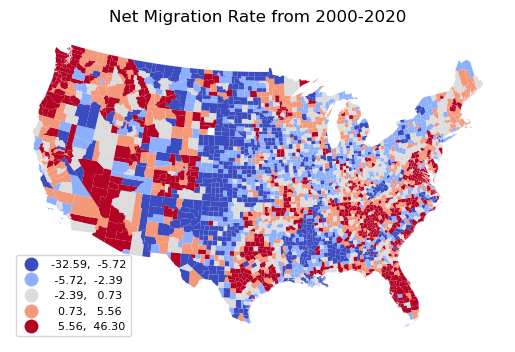

In [66]:
plt.figure(figsize=(10, 8))
gdf_NMR.plot(column="NetMigrationRateTotal",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,legend_kwds={
        "fontsize": 8,  # Adjust font size for smaller text
        "loc": "lower left",  # Position the legend
    })
plt.title("Net Migration Rate from 2000-2020")
plt.axis('off')
plt.show()

## Disaster Map
### Map the frequency and loss

In [67]:
df_disaster = pd.merge(df_20_years_by_county,county,left_on="County FIPS",right_on="FIPS",how="inner")
gdf_disaster = gpd.GeoDataFrame(df_disaster,geometry="geometry")

C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\mapclassify\classifiers.py:1653: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  self.bins = quantile(y, k=k)
C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\mapclassify\classifiers.py:1653: UserWarning: Not enough unique values in array to form 5 classes. Setting k to 4.
  self.bins = quantile(y, k=k)


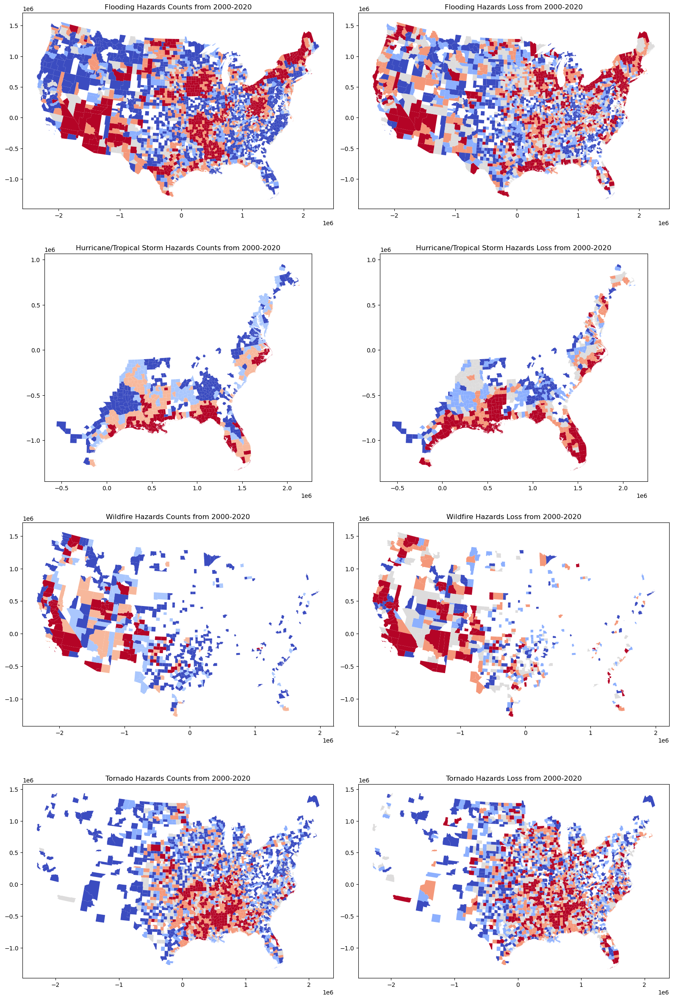

In [68]:
fig, axes = plt.subplots(4,2,figsize=(16,24))
list_disaster = ['Flooding','Hurricane/Tropical Storm','Wildfire','Tornado']
for i in range(4):
    use_df_disaster = gdf_disaster[gdf_disaster["Hazard"] == str(list_disaster[i])]
#     print(use_df_disaster.head())
    use_df_disaster.plot(column="frequency",cmap="coolwarm",scheme='quantiles',
#                          classification_kwds={'bins':[1,3,5,10,20,50]},
                         ax=axes[i,0])
    use_df_disaster.plot(column="PropertyDmg(ADJ 2020)",cmap="coolwarm",scheme="quantiles",
#                          ,legend=True,
                         ax=axes[i,1])
    axes[i,0].set_title(f"{list_disaster[i]} Hazards Counts from 2000-2020")
    axes[i,1].set_title(f"{list_disaster[i]} Hazards Loss from 2000-2020")
plt.tight_layout()
plt.show()

## XGBoost
### Combine each dataset

In [326]:
Regression_data = pd.DataFrame()
Regression_data = df_pep_0120
Regression_data = pd.merge(Regression_data,Disaster,on="FIPS",how="outer")
Regression_data = pd.merge(Regression_data,HAI,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,Hurricane,left_on="FIPS",right_on="County FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,Wildfire,left_on="FIPS",right_on="County FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,Tornado,left_on="FIPS",right_on="County FIPS",how="outer")
# Regression_data = pd.merge(Regression_data,Heat,left_on="FIPS",right_on="County FIPS",how="outer")
Regression_data = pd.merge(Regression_data,SVI_10,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,NRI_CONUS,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,unemployment_rate_pivot,on="FIPS",how="inner")
Regression_data = pd.merge(Regression_data,PopDensity_CONUS_sel,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,conus_annual_prices,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,MedianHouseValue,on="FIPS",how="inner")
Regression_data = pd.merge(Regression_data,MedianHouseIndicator,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,GDP_final_data,on="FIPS",how="inner")
# Regression_data = pd.merge(Regression_data,T_sel,on="FIPS",how="inner")
Regression_data = pd.merge(Regression_data,Amenity,on="FIPS",how="inner")

In [327]:
Regression_data = Regression_data.fillna(0)

In [328]:
used_list_flood = [
    "FIPS","NetMigrationRateTotal",#PEP
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity
]

standard_list_flood = [
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity'
]


name_list_flood = [
    "FIPS","NMR",
    "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
    "%BelowPoverty","%Unemployed","PerCapitaIncome","%NoHighDiploma25+","%Age65+",
    "%Age18-","%Single-parent-H","%Minority","%Age5+LessEnglish",
    "%Multi-Unit House","%MobileHome","%HousePop>Room","%NoVehicleH","%GroupQuarters",
    "Pop Density",
    "HAI",
    "MedianHIncome",
#     "MedianHHIncome2020",
    "%ChangeIncome","Income/HValue",
#     "Income/Value2020",
    "%Income/%HValue",#House Indicators
    'Amenity Scale' #Amenity
]    

used_list_hurricane = [
    "FIPS","NetMigrationRateTotal",#PEP
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity
]

standard_list_hurricane = [
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity'
]


name_list_hurricane = [
    "FIPS","NMR",
    "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
    "%BelowPoverty","%Unemployed","PerCapitaIncome","%NoHighDiploma25+","%Age65+",
    "%Age18-","%Single-parent-H","%Minority","%Age5+LessEnglish",
    "%Multi-Unit House","%MobileHome","%HousePop>Room","%NoVehicleH","%GroupQuarters",
    "Pop Density",
    "HAI",
    "MedianHIncome",
#     "MedianHHIncome2020",
    "%ChangeIncome","Income/HValue",
#     "Income/Value2020",
    "%Income/%HValue",#House Indicators
    'Amenity Scale' #Amenity
]    


used_list_wildfire = [
    "FIPS","NetMigrationRateTotal",#PEP
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity
]

standard_list_wildfire = [
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity'
]


name_list_wildfire = [
    "FIPS","NMR",
    "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
    "%BelowPoverty","%Unemployed","PerCapitaIncome","%NoHighDiploma25+","%Age65+",
    "%Age18-","%Single-parent-H","%Minority","%Age5+LessEnglish",
    "%Multi-Unit House","%MobileHome","%HousePop>Room","%NoVehicleH","%GroupQuarters",
    "Pop Density",
    "HAI",
    "MedianHIncome",
#     "MedianHHIncome2020",
    "%ChangeIncome","Income/HValue",
#     "Income/Value2020",
    "%Income/%HValue",#House Indicators
    'Amenity Scale' #Amenity
]    



used_list_tornado = [
    "FIPS","NetMigrationRateTotal",#PEP
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity
]

standard_list_tornado = [
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries",
    "E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT",
    "P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ", #SVI
    "POPDENS10",#POP DENSITY
    "W_HT_HAI_rev",#HAI_reversed
    "MedianHouseholdIncome2000(adjusted)",
#     "MedianHouseholdIncome2020",
    "%ChangeIncome","income/value2000",
#     "income/value2020",
    "%Income/%Value",#House Indicators
    'Scale' #Amenity'
]


name_list_tornado = [
    "FIPS","NMR",
    "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
#     "Disaster_Count","Disaster_Loss","Disaster_Fatality","Disaster_Injury",
    "%BelowPoverty","%Unemployed","PerCapitaIncome","%NoHighDiploma25+","%Age65+",
    "%Age18-","%Single-parent-H","%Minority","%Age5+LessEnglish",
    "%Multi-Unit House","%MobileHome","%HousePop>Room","%NoVehicleH","%GroupQuarters",
    "Pop Density",
    "HAI",
    "MedianHIncome",
#     "MedianHHIncome2020",
    "%ChangeIncome","Income/HValue",
#     "Income/Value2020",
    "%Income/%HValue",#House Indicators
    'Amenity Scale' #Amenity
]    

In [329]:
Regression_data = Regression_data[~np.isinf(Regression_data['income/value2000'])]

In [330]:
Regression_data["W_HT_HAI_rev"]=Regression_data["W_HT_HAI"].max()-Regression_data['W_HT_HAI']

In [331]:
Flood_Regression_data = Regression_data[Regression_data["Flood_Occur"]!=0].reset_index()
Hurricane_Regression_data = Regression_data[Regression_data["Hurricane_Occur"]!=0].reset_index()
Wildfire_Regression_data = Regression_data[Regression_data["Wildfire_Occur"]!=0].reset_index()
Tornado_Regression_data = Regression_data[Regression_data["Tornado_Occur"]!=0].reset_index()

## Remove FIPS 21193, 39071, 47135 due to extremly large or small %Income/%Value

In [332]:
scaler = RobustScaler()
remove_list = ["21193","39071","47135"]
Flood_Regression_data_used = Flood_Regression_data[used_list_flood]
Flood_Regression_data_used[standard_list_flood] = scaler.fit_transform(Flood_Regression_data_used[standard_list_flood])
Flood_Regression_data_used.columns = name_list_flood
Flood_Regression_data_used = Flood_Regression_data_used[~Flood_Regression_data_used["FIPS"].isin(remove_list)]

Hurricane_Regression_data_used = Hurricane_Regression_data[used_list_hurricane]
Hurricane_Regression_data_used[standard_list_hurricane] = scaler.fit_transform(Hurricane_Regression_data_used[standard_list_hurricane])
Hurricane_Regression_data_used.columns = name_list_hurricane
Hurricane_Regression_data_used = Hurricane_Regression_data_used[~Hurricane_Regression_data_used["FIPS"].isin(remove_list)]

Wildfire_Regression_data_used = Wildfire_Regression_data[used_list_wildfire]
Wildfire_Regression_data_used[standard_list_wildfire] = scaler.fit_transform(Wildfire_Regression_data_used[standard_list_wildfire])
Wildfire_Regression_data_used.columns = name_list_wildfire
Wildfire_Regression_data_used = Wildfire_Regression_data_used[~Wildfire_Regression_data_used["FIPS"].isin(remove_list)]

Tornado_Regression_data_used = Tornado_Regression_data[used_list_tornado]
Tornado_Regression_data_used[standard_list_tornado] = scaler.fit_transform(Tornado_Regression_data_used[standard_list_tornado])
Tornado_Regression_data_used.columns = name_list_tornado
Tornado_Regression_data_used = Tornado_Regression_data_used[~Tornado_Regression_data_used["FIPS"].isin(remove_list)]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\112036943.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Flood_Regression_data_used[standard_list_flood] = scaler.fit_transform(Flood_Regression_data_used[standard_list_flood])
C:\Users\xiang11\AppData\Local\Temp\ipykernel_28980\112036943.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Hurricane_Regression_data_used[standard_list_hurricane] = scaler.fit_transform(Hurricane_Regression_data_used[standard_list_hurricane])
C:\Users\xiang11\AppData\Loc

In [321]:
Flood_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Flood_Regression_data.csv")
Hurricane_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Hurricane_Regression_data.csv")
Wildfire_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Wildfire_Regression_data.csv")
Tornado_Regression_data_used.to_csv("F:/LongMig2025/data/Regression/Tornado_Regression_data.csv")

## VIF is not required for XGBoost.

### XGBOOST with all factors in Hurricane, Flood, Wildfire, Tornado

## Test for the best parameters
## Flood

In [76]:
X = Flood_Regression_data_used.drop(columns=['NMR', 'FIPS'])
# ,
# #     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
#                                             ])
y = Flood_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

param_grid = {
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 500, 1000],
    'subsample': [0.8, 1.0]
}

grid_search = GridSearchCV(xgb.XGBRegressor(objective="reg:squarederror"), param_grid, scoring="neg_mean_squared_error", cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 1000, 'subsample': 0.8}


## Hurricane

In [77]:
X = Hurricane_Regression_data_used.drop(columns=['NMR', 'FIPS',
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ])
y = Hurricane_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

param_grid = {
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 500, 1000],
    'subsample': [0.8, 1.0]
}

grid_search = GridSearchCV(xgb.XGBRegressor(objective="reg:squarederror"), param_grid, scoring="neg_mean_squared_error", cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 1.0}


## Wildfire

In [78]:
X = Wildfire_Regression_data_used.drop(columns=['NMR', 'FIPS',
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ])
y = Wildfire_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

param_grid = {
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 500, 1000],
    'subsample': [0.8, 1.0]
}

grid_search = GridSearchCV(xgb.XGBRegressor(objective="reg:squarederror"), param_grid, scoring="neg_mean_squared_error", cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 0.8}


## Tornado

In [79]:
X = Tornado_Regression_data_used.drop(columns=['NMR', 'FIPS',
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ])
y = Tornado_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

param_grid = {
    'max_depth': [3, 6, 9],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 500, 1000],
    'subsample': [0.8, 1.0]
}

grid_search = GridSearchCV(xgb.XGBRegressor(objective="reg:squarederror"), param_grid, scoring="neg_mean_squared_error", cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 1000, 'subsample': 0.8}


Mean Squared Error: 20.795501111232404


 99%|===================| 686/693 [00:29<00:00]        

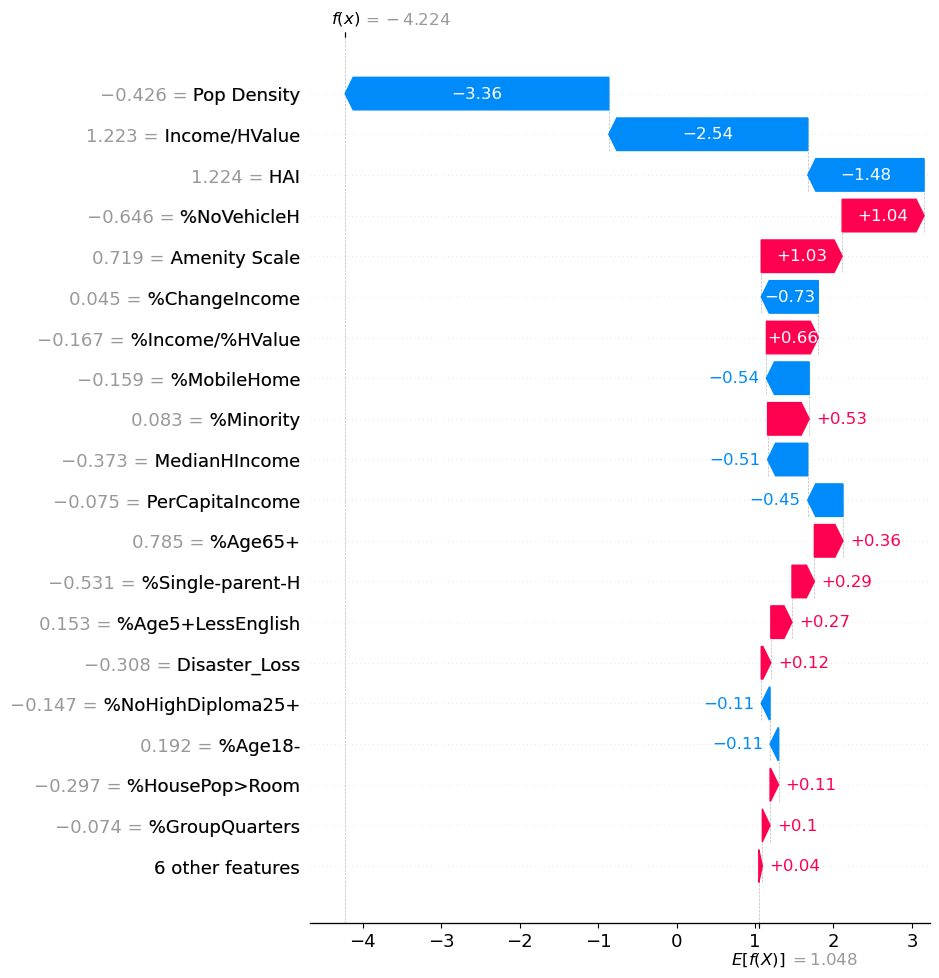

<Figure size 640x480 with 0 Axes>

In [368]:
X = Flood_Regression_data_used.drop(columns=['NMR', 'FIPS'])
y = Flood_Regression_data_used['NMR']
# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.05,
    max_depth=6,  
    subsample=0.8,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
shap.plots.waterfall(shap_values[0], max_display=20)
# shap.summary_plot(shap_values, X_test, show=False, max_display=30)
# shap.summary_plot(shap_values, X_test, show=False)
plt.savefig(r'F:\LongMig2025\results\maps\xgboost\flood_waterfall.png', dpi=600, bbox_inches='tight')
fig.clf()

Mean Squared Error: 26.27752079145081


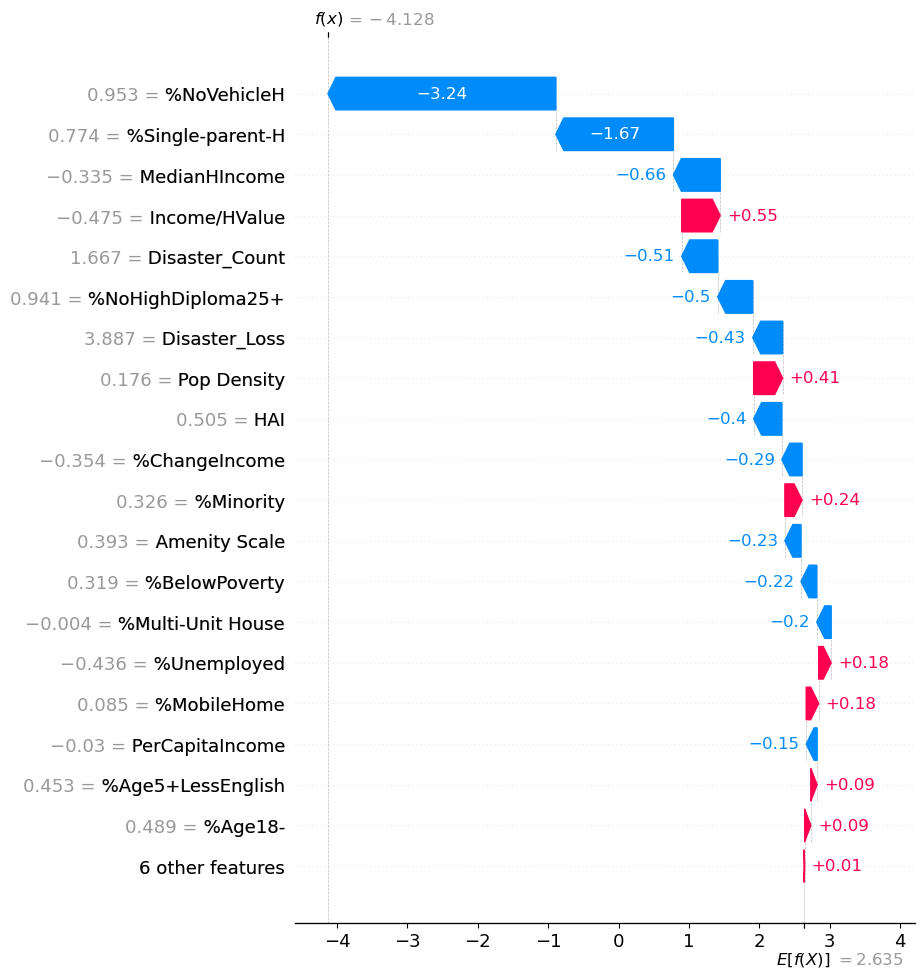

<Figure size 640x480 with 0 Axes>

In [367]:
X = Hurricane_Regression_data_used.drop(columns=['NMR', 'FIPS'])
y = Hurricane_Regression_data_used['NMR']
# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.05,
    max_depth=6,  
    subsample=0.8,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
# shap.summary_plot(shap_values, X_test, show=False, max_display=30)
# shap.summary_plot(shap_values, X_test, show=False)
shap.plots.waterfall(shap_values[0], max_display=20)
plt.savefig(r'F:\LongMig2025\results\maps\xgboost\hurricane_waterfall.png', dpi=600, bbox_inches='tight')
fig.clf()

Mean Squared Error: 39.65487050967625


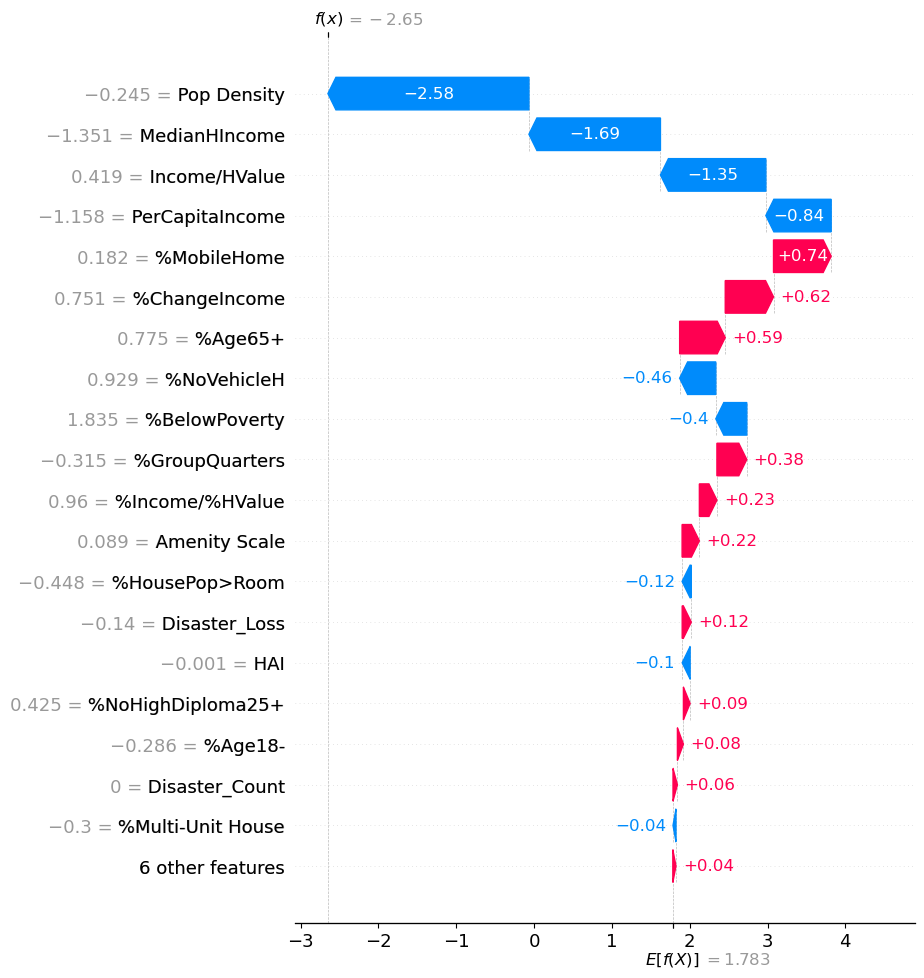

<Figure size 640x480 with 0 Axes>

In [366]:
X = Wildfire_Regression_data_used.drop(columns=['NMR', 'FIPS'])
y = Wildfire_Regression_data_used['NMR']
# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.05,
    max_depth=6,  
    subsample=0.8,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
# shap.summary_plot(shap_values, X_test, show=False, max_display=30)
# shap.summary_plot(shap_values, X_test, show=False)
shap.plots.waterfall(shap_values[0], max_display=20)
plt.savefig(r'F:\LongMig2025\results\maps\xgboost\Wildfire_waterfall.png', dpi=600, bbox_inches='tight')
fig.clf()

Mean Squared Error: 22.935006717033993


 98%|===================| 557/566 [00:23<00:00]        

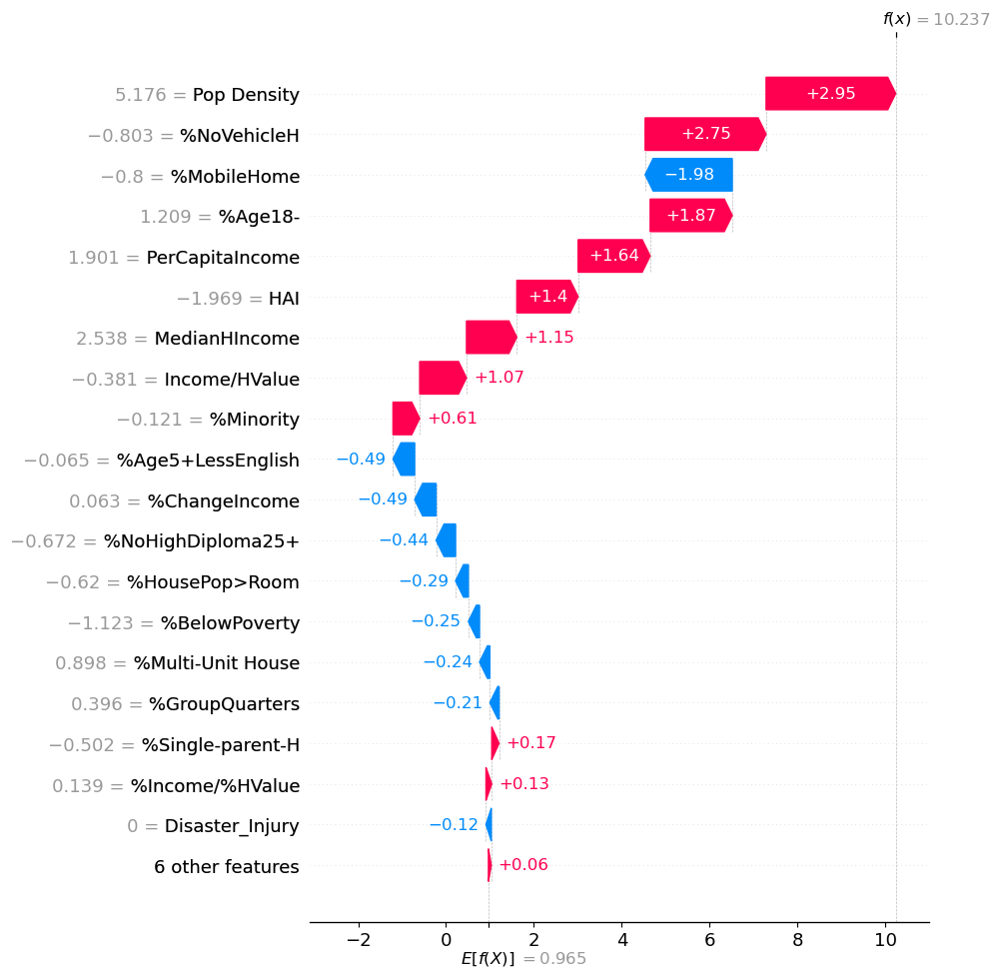

<Figure size 640x480 with 0 Axes>

In [365]:
X = Tornado_Regression_data_used.drop(columns=['NMR', 'FIPS'])
y = Tornado_Regression_data_used['NMR']
# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.05,
    max_depth=6,  
    subsample=0.8,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
# shap.summary_plot(shap_values, X_test, show=False, max_display=30)
# shap.summary_plot(shap_values, X_test, show=False)
shap.plots.waterfall(shap_values[0], max_display=20)
plt.savefig(r'F:\LongMig2025\results\maps\xgboost\Tornado_waterfall.png', dpi=600, bbox_inches='tight')
fig.clf()

## Results of XGBoost Flood

Mean Squared Error: 20.795501111232404


 99%|===================| 684/693 [00:28<00:00]        

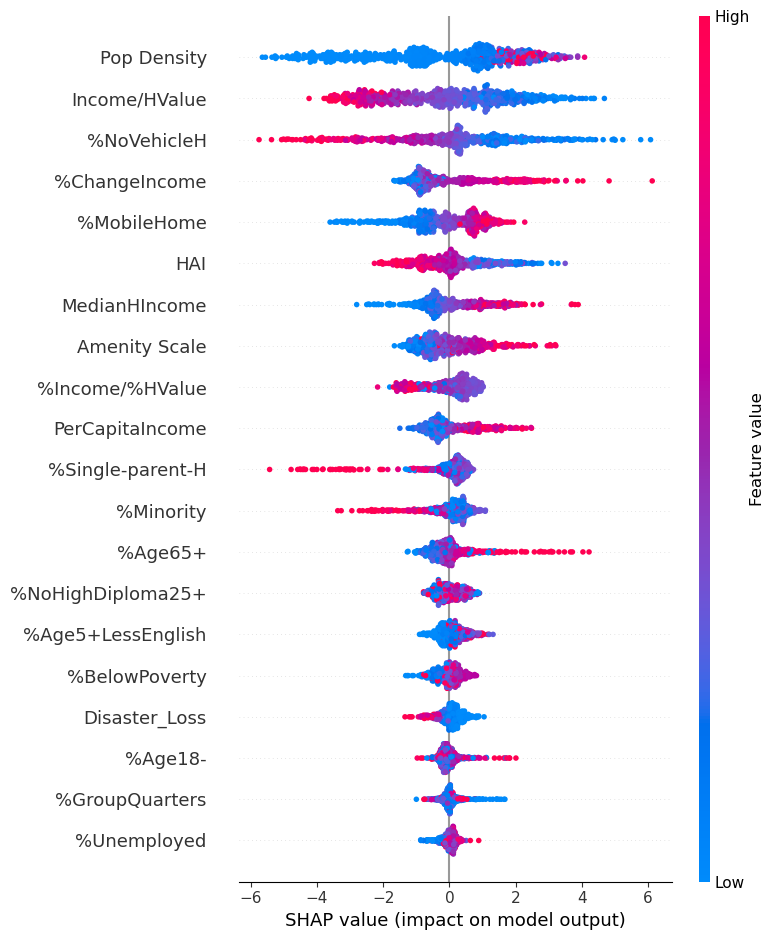

In [338]:
X = Flood_Regression_data_used.drop(columns=['NMR', 'FIPS'])
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
#                                             ])
y = Flood_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.05,
    max_depth=6,  
    subsample=0.8,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
shap.summary_plot(shap_values, X_test, show=False)
plt.savefig(r'F:\LongMig2025\results\maps\xgboost\flood.png', dpi=600, bbox_inches='tight')
fig.clf()

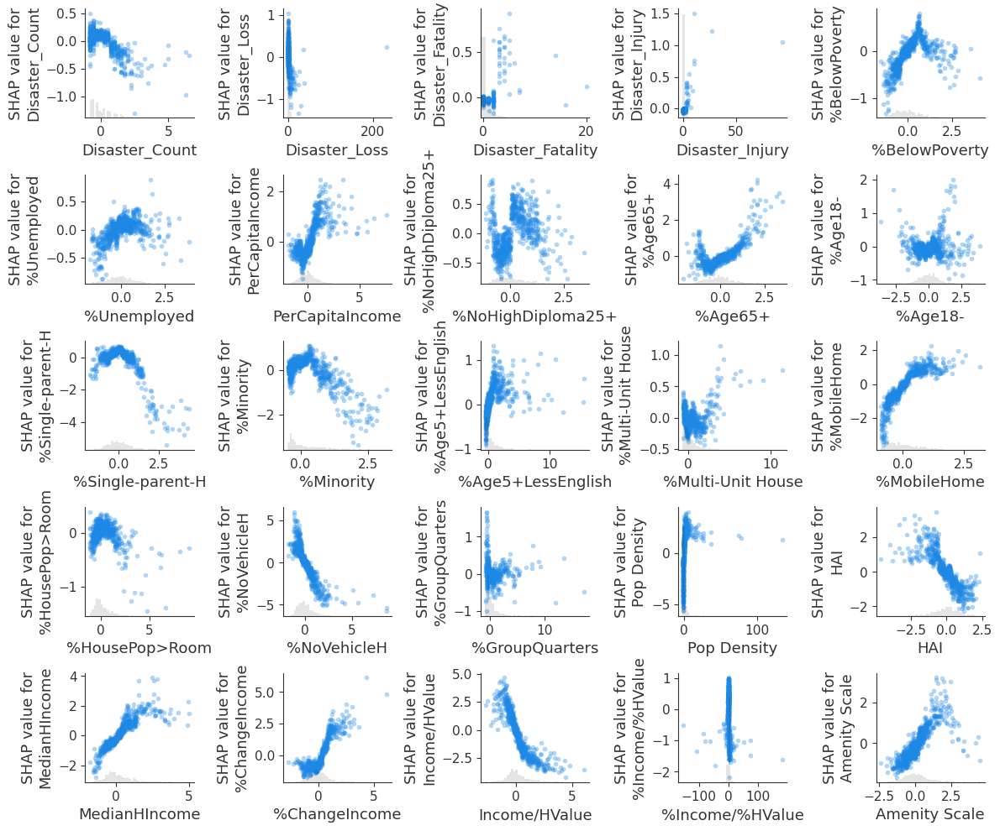

In [335]:
# Define all the features in your dataset
all_features = X_test.columns  # Replace with the features from your test set

# Set up the number of rows and columns for subplots
num_features = len(all_features)
cols = 5  # Number of columns in the subplot grid
rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# Create the subplots
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# Flatten axes for easy iteration
axes = axes.flatten()

# Generate SHAP dependence plots for each feature
for i, feature in enumerate(all_features):
    shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
#     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
#     shap.dependence_plot(
#         feature, shap_values.values, X_test, ax=axes[i], show=False
#     )
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# Turn off unused subplots if the number of features is less than total subplots
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# Show the final figure
plt.tight_layout()
plt.show()


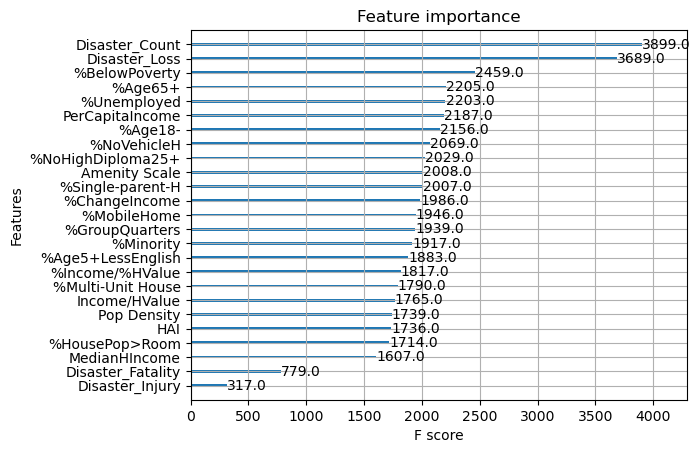

In [336]:
xgb.plot_importance(model)
plt.show()

In [337]:
r2 = r2_score(y_test, y_pred)

# RMSE (Root Mean Squared Error)
rmse = mean_squared_error(y_test, y_pred, squared=False)

# ME (Mean Error, aka Bias)
me = (y_test - y_pred).mean()

print(f"R²: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"Mean Error (ME): {me:.3f}")


R²: 0.706
RMSE: 4.560
Mean Error (ME): 0.048


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Remove Flood Variables

In [339]:
# X = Flood_Regression_data_used.drop(columns=['NMR', 'FIPS'])
# #     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
# #     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
# #     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
# #     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
# #                                             ])
# y = Flood_Regression_data_used['NMR']

# # # Split the dataset into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # # Train an XGBoost regression model
# model = xgb.XGBRegressor(objective='reg:squarederror',
#                              n_estimators=1000,  
#     learning_rate=0.05,
#     max_depth=6,  
#     subsample=0.8,  
#     colsample_bytree=0.8,
#     reg_lambda=1,  
#     reg_alpha=0,  
#     missing=0)
# model.fit(X_train, y_train)

# # Evaluate the model
# y_pred = model.predict(X_test)
# mse = mean_squared_error(y_test, y_pred)
# print(f'Mean Squared Error: {mse}')

# # Explain the model with SHAP
# explainer = shap.Explainer(model, X_train)
# shap_values = explainer(X_test)

# # Summary plot of feature importance
# plt.figure()
# shap.summary_plot(shap_values, X_test, show=False)
# # plt.savefig(r'F:\LongMig2025\results\maps\xgboost\summary.png', dpi=600, bbox_inches='tight')
# fig.clf()

In [340]:
# # Define all the features in your dataset
# all_features = X_test.columns  # Replace with the features from your test set

# # Set up the number of rows and columns for subplots
# num_features = len(all_features)
# cols = 5  # Number of columns in the subplot grid
# rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# # Create the subplots
# fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# # Flatten axes for easy iteration
# axes = axes.flatten()

# # Generate SHAP dependence plots for each feature
# for i, feature in enumerate(all_features):
#     shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
# #     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
# #     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
# #     shap.dependence_plot(
# #         feature, shap_values.values, X_test, ax=axes[i], show=False
# #     )
# #     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# # Turn off unused subplots if the number of features is less than total subplots
# for j in range(len(all_features), len(axes)):
#     axes[j].axis("off")
# # plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# # Show the final figure
# plt.tight_layout()
# plt.show()


In [341]:
# xgb.plot_importance(model)
# plt.show()

In [342]:
# r2 = r2_score(y_test, y_pred)

# # RMSE (Root Mean Squared Error)
# rmse = mean_squared_error(y_test, y_pred, squared=False)

# # ME (Mean Error, aka Bias)
# me = (y_test - y_pred).mean()

# print(f"R²: {r2:.3f}")
# print(f"RMSE: {rmse:.3f}")
# print(f"Mean Error (ME): {me:.3f}")


## Results of XGBoost Hurricane

In [88]:
X = Hurricane_Regression_data_used.drop(columns=['NMR', 'FIPS'])
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
# #     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
#                                             ])
y = Hurricane_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.1,
    max_depth=3,  
    subsample=1,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
shap.summary_plot(shap_values, X_test, show=False)
plt.savefig(r'F:\LongMig2025\results\maps\xgboost\summary.png', dpi=600, bbox_inches='tight')
fig.clf()

In [89]:
# # Define all the features in your dataset
# all_features = X_test.columns  # Replace with the features from your test set

# # Set up the number of rows and columns for subplots
# num_features = len(all_features)
# cols = 5  # Number of columns in the subplot grid
# rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# # Create the subplots
# fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# # Flatten axes for easy iteration
# axes = axes.flatten()

# # Generate SHAP dependence plots for each feature
# for i, feature in enumerate(all_features):
#     shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
# #     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
# #     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
# #     shap.dependence_plot(
# #         feature, shap_values.values, X_test, ax=axes[i], show=False
# #     )
# #     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# # Turn off unused subplots if the number of features is less than total subplots
# for j in range(len(all_features), len(axes)):
#     axes[j].axis("off")
# # plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# # Show the final figure
# plt.tight_layout()
# plt.show()


In [90]:
# xgb.plot_importance(model)
# plt.show()

In [91]:
# r2 = r2_score(y_test, y_pred)

# # RMSE (Root Mean Squared Error)
# rmse = mean_squared_error(y_test, y_pred, squared=False)

# # ME (Mean Error, aka Bias)
# me = (y_test - y_pred).mean()

# print(f"R²: {r2:.3f}")
# print(f"RMSE: {rmse:.3f}")
# print(f"Mean Error (ME): {me:.3f}")


Mean Squared Error: 31.40511455477586


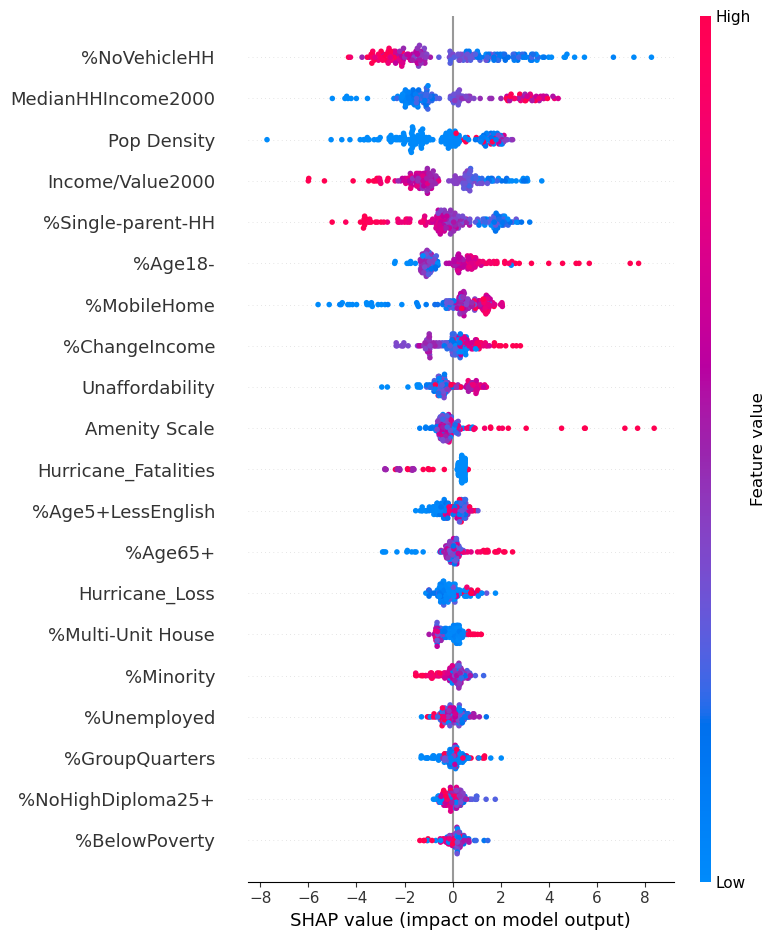

In [92]:
X = Hurricane_Regression_data_used.drop(columns=['NMR', 'FIPS', "PerCapitaIncome",
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ])
y = Hurricane_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.1,
    max_depth=3,  
    subsample=1,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
shap.summary_plot(shap_values, X_test, show=False)
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\summary.png', dpi=600, bbox_inches='tight')
fig.clf()

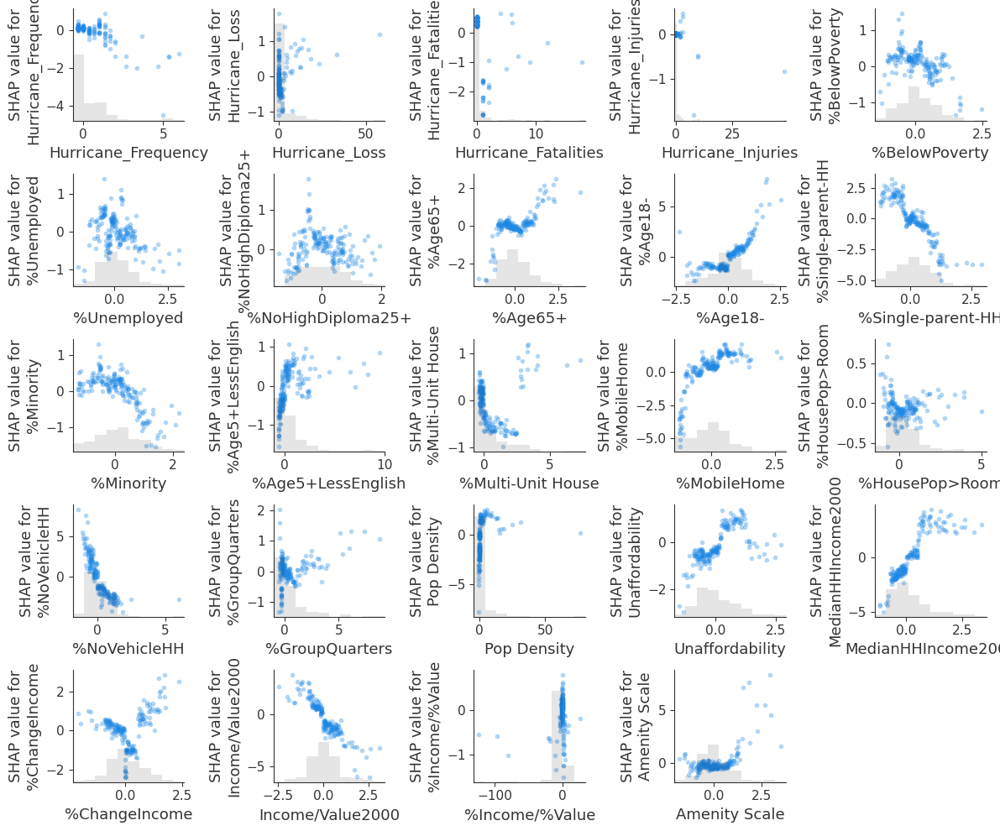

In [93]:
# Define all the features in your dataset
all_features = X_test.columns  # Replace with the features from your test set

# Set up the number of rows and columns for subplots
num_features = len(all_features)
cols = 5  # Number of columns in the subplot grid
rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# Create the subplots
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# Flatten axes for easy iteration
axes = axes.flatten()

# Generate SHAP dependence plots for each feature
for i, feature in enumerate(all_features):
    shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
#     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
#     shap.dependence_plot(
#         feature, shap_values.values, X_test, ax=axes[i], show=False
#     )
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# Turn off unused subplots if the number of features is less than total subplots
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# Show the final figure
plt.tight_layout()
plt.show()


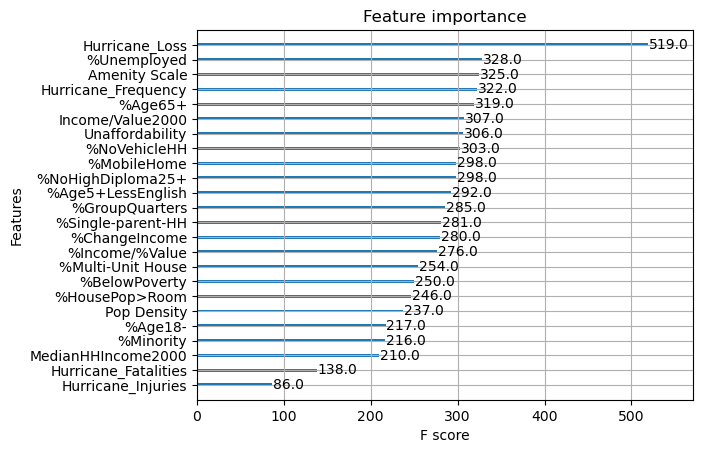

In [94]:
xgb.plot_importance(model)
plt.show()

In [95]:
r2 = r2_score(y_test, y_pred)

# RMSE (Root Mean Squared Error)
rmse = mean_squared_error(y_test, y_pred, squared=False)

# ME (Mean Error, aka Bias)
me = (y_test - y_pred).mean()

print(f"R²: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"Mean Error (ME): {me:.3f}")


R²: 0.656
RMSE: 5.604
Mean Error (ME): 0.319


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Remove Hurricane Variables

In [96]:
# X = Hurricane_Regression_data_used.drop(columns=['NMR', 'FIPS',
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
#                                             ])
# y = Hurricane_Regression_data_used['NMR']

# # # Split the dataset into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # # Train an XGBoost regression model
# model = xgb.XGBRegressor(objective='reg:squarederror',
#                              n_estimators=1000,  
#     learning_rate=0.1,
#     max_depth=3,  
#     subsample=1,  
#     colsample_bytree=0.8,
#     reg_lambda=1,  
#     reg_alpha=0,  
#     missing=0)
# model.fit(X_train, y_train)

# # Evaluate the model
# y_pred = model.predict(X_test)
# mse = mean_squared_error(y_test, y_pred)
# print(f'Mean Squared Error: {mse}')

# # Explain the model with SHAP
# explainer = shap.Explainer(model, X_train)
# shap_values = explainer(X_test)

# # Summary plot of feature importance
# plt.figure()
# shap.summary_plot(shap_values, X_test, show=False)
# # plt.savefig(r'F:\LongMig2025\results\maps\xgboost\summary.png', dpi=600, bbox_inches='tight')
# fig.clf()

In [97]:
# # Define all the features in your dataset
# all_features = X_test.columns  # Replace with the features from your test set

# # Set up the number of rows and columns for subplots
# num_features = len(all_features)
# cols = 5  # Number of columns in the subplot grid
# rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# # Create the subplots
# fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# # Flatten axes for easy iteration
# axes = axes.flatten()

# # Generate SHAP dependence plots for each feature
# for i, feature in enumerate(all_features):
#     shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
# #     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
# #     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
# #     shap.dependence_plot(
# #         feature, shap_values.values, X_test, ax=axes[i], show=False
# #     )
# #     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# # Turn off unused subplots if the number of features is less than total subplots
# for j in range(len(all_features), len(axes)):
#     axes[j].axis("off")
# # plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# # Show the final figure
# plt.tight_layout()
# plt.show()


In [98]:
# xgb.plot_importance(model)
# plt.show()

In [99]:
# r2 = r2_score(y_test, y_pred)

# # RMSE (Root Mean Squared Error)
# rmse = mean_squared_error(y_test, y_pred, squared=False)

# # ME (Mean Error, aka Bias)
# me = (y_test - y_pred).mean()

# print(f"R²: {r2:.3f}")
# print(f"RMSE: {rmse:.3f}")
# print(f"Mean Error (ME): {me:.3f}")


Mean Squared Error: 33.68574549247672


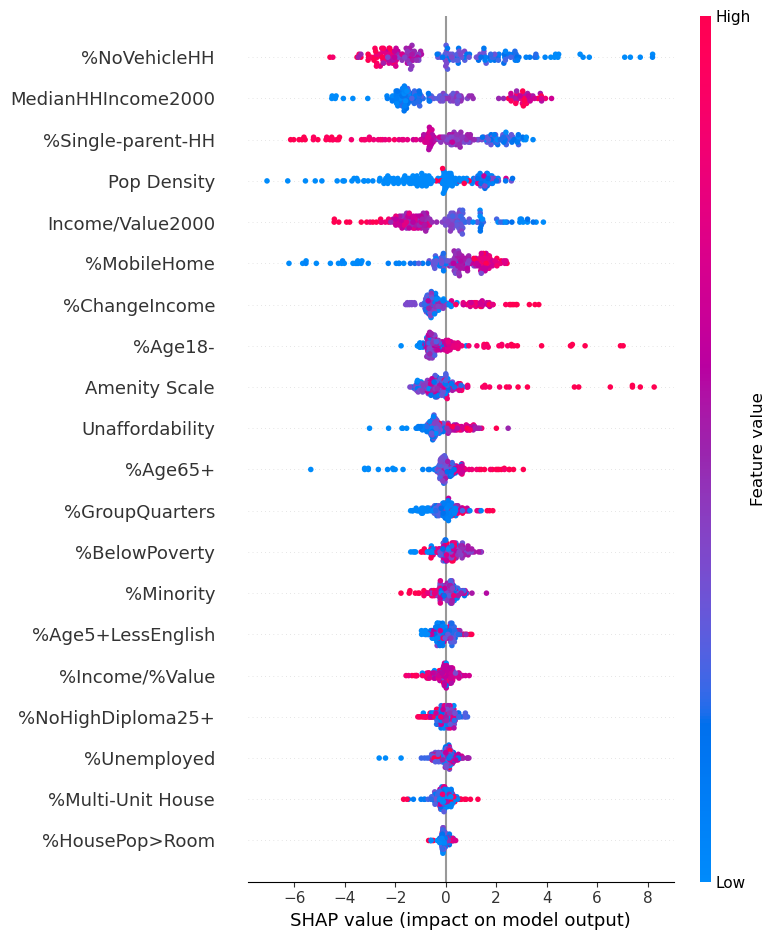

In [100]:
X = Hurricane_Regression_data_used.drop(columns=['NMR', 'FIPS', "PerCapitaIncome",
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ])
y = Hurricane_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.1,
    max_depth=3,  
    subsample=1,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
shap.summary_plot(shap_values, X_test, show=False)
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\summary.png', dpi=600, bbox_inches='tight')
fig.clf()

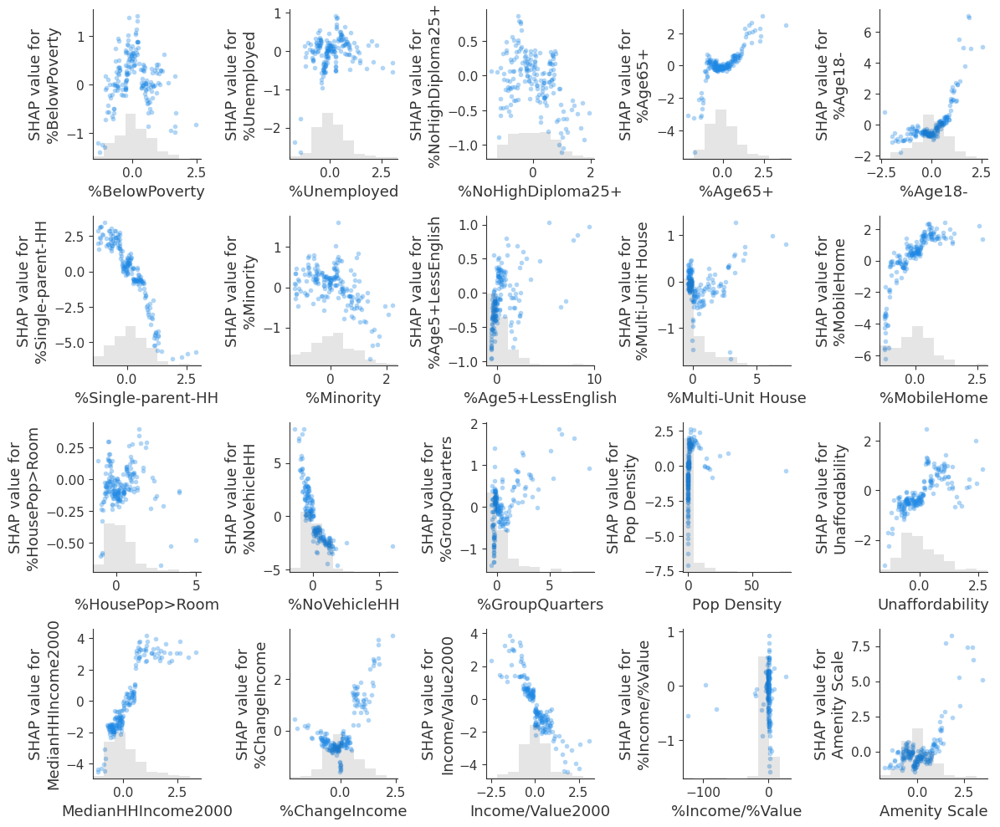

In [101]:
# Define all the features in your dataset
all_features = X_test.columns  # Replace with the features from your test set

# Set up the number of rows and columns for subplots
num_features = len(all_features)
cols = 5  # Number of columns in the subplot grid
rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# Create the subplots
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# Flatten axes for easy iteration
axes = axes.flatten()

# Generate SHAP dependence plots for each feature
for i, feature in enumerate(all_features):
    shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
#     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
#     shap.dependence_plot(
#         feature, shap_values.values, X_test, ax=axes[i], show=False
#     )
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# Turn off unused subplots if the number of features is less than total subplots
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# Show the final figure
plt.tight_layout()
plt.show()


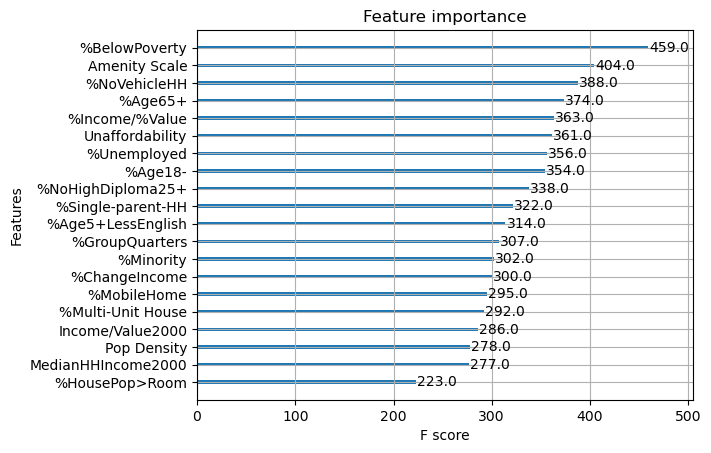

In [102]:
xgb.plot_importance(model)
plt.show()

In [103]:
r2 = r2_score(y_test, y_pred)

# RMSE (Root Mean Squared Error)
rmse = mean_squared_error(y_test, y_pred, squared=False)

# ME (Mean Error, aka Bias)
me = (y_test - y_pred).mean()

print(f"R²: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"Mean Error (ME): {me:.3f}")


R²: 0.631
RMSE: 5.804
Mean Error (ME): 0.398


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Results of XGBoost Wildfire

Mean Squared Error: 39.72659998096373


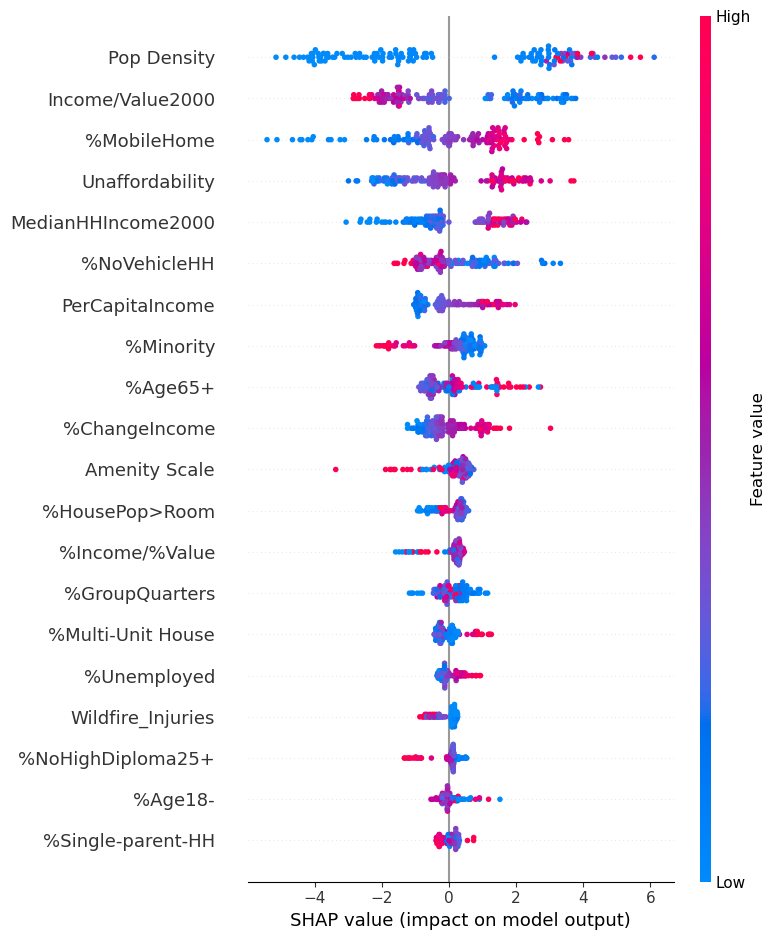

In [104]:
X = Wildfire_Regression_data_used.drop(columns=['NMR', 'FIPS',
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ])
y = Wildfire_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.01,
    max_depth=3,  
    subsample=0.8,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
shap.summary_plot(shap_values, X_test, show=False)
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\summary.png', dpi=600, bbox_inches='tight')
fig.clf()

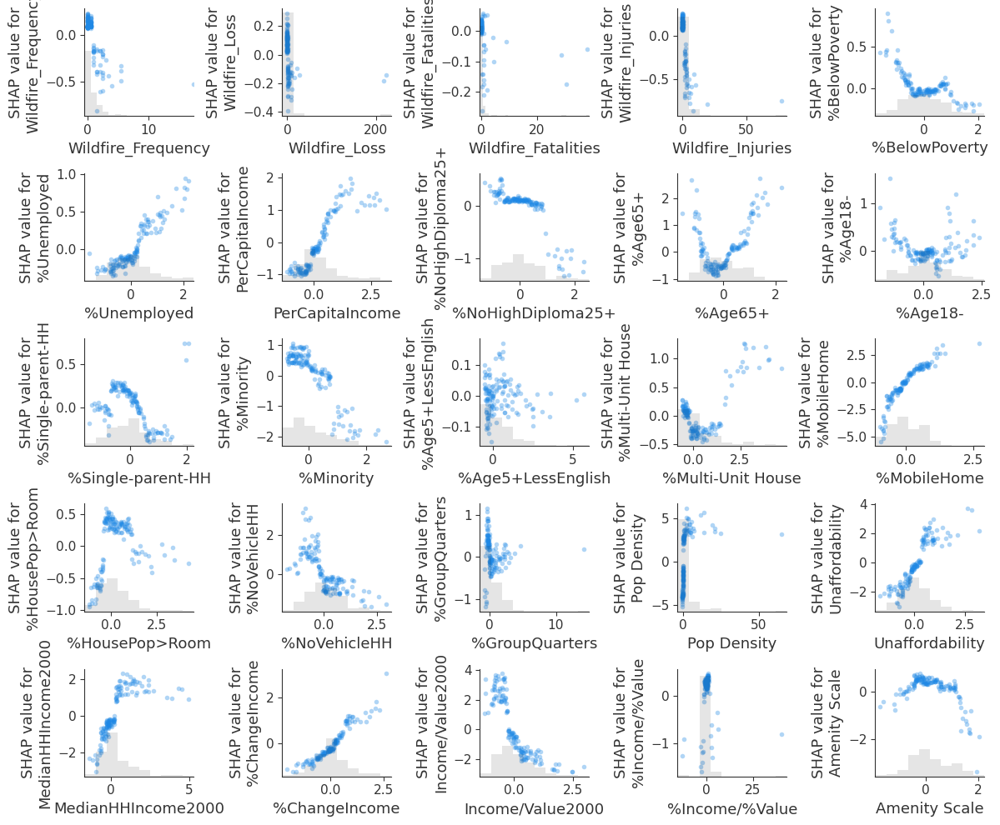

In [105]:
# Define all the features in your dataset
all_features = X_test.columns  # Replace with the features from your test set

# Set up the number of rows and columns for subplots
num_features = len(all_features)
cols = 5  # Number of columns in the subplot grid
rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# Create the subplots
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# Flatten axes for easy iteration
axes = axes.flatten()

# Generate SHAP dependence plots for each feature
for i, feature in enumerate(all_features):
    shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
#     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
#     shap.dependence_plot(
#         feature, shap_values.values, X_test, ax=axes[i], show=False
#     )
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# Turn off unused subplots if the number of features is less than total subplots
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# Show the final figure
plt.tight_layout()
plt.show()


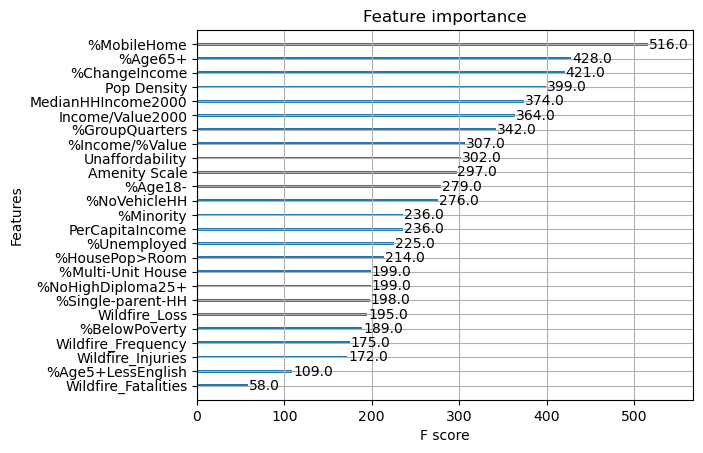

In [106]:
xgb.plot_importance(model)
plt.show()

In [107]:
r2 = r2_score(y_test, y_pred)

# RMSE (Root Mean Squared Error)
rmse = mean_squared_error(y_test, y_pred, squared=False)

# ME (Mean Error, aka Bias)
me = (y_test - y_pred).mean()

print(f"R²: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"Mean Error (ME): {me:.3f}")


R²: 0.630
RMSE: 6.303
Mean Error (ME): -0.320


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Remove Wildfire Variables

Mean Squared Error: 38.902952592129374


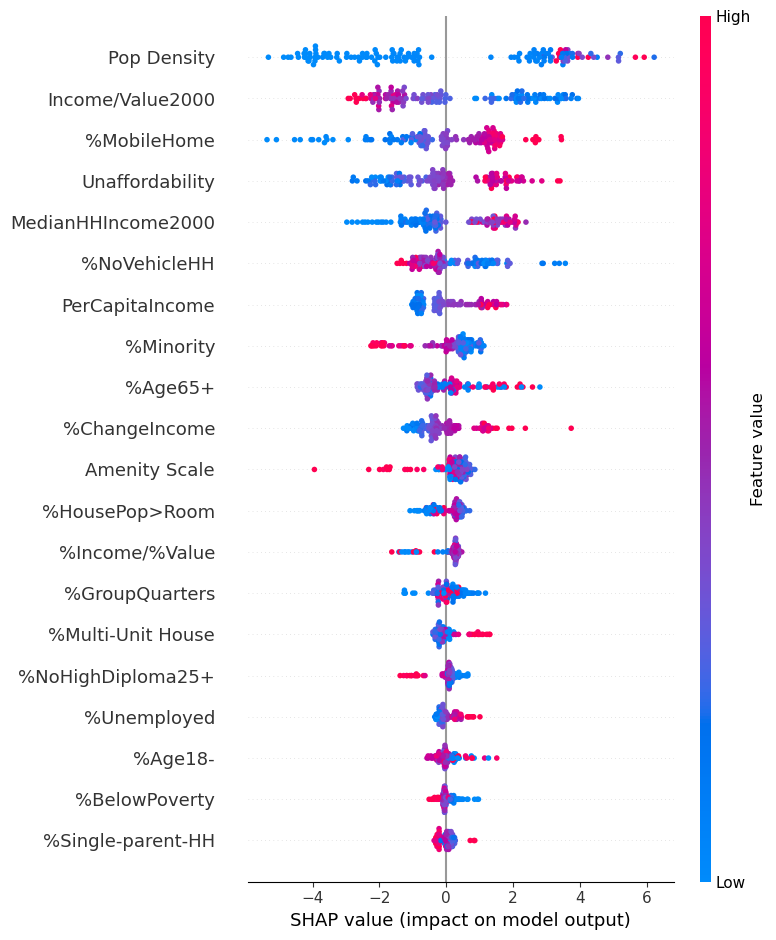

In [108]:
X = Wildfire_Regression_data_used.drop(columns=['NMR', 'FIPS',
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ])
y = Wildfire_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.01,
    max_depth=3,  
    subsample=0.8,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
shap.summary_plot(shap_values, X_test, show=False)
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\summary.png', dpi=600, bbox_inches='tight')
fig.clf()

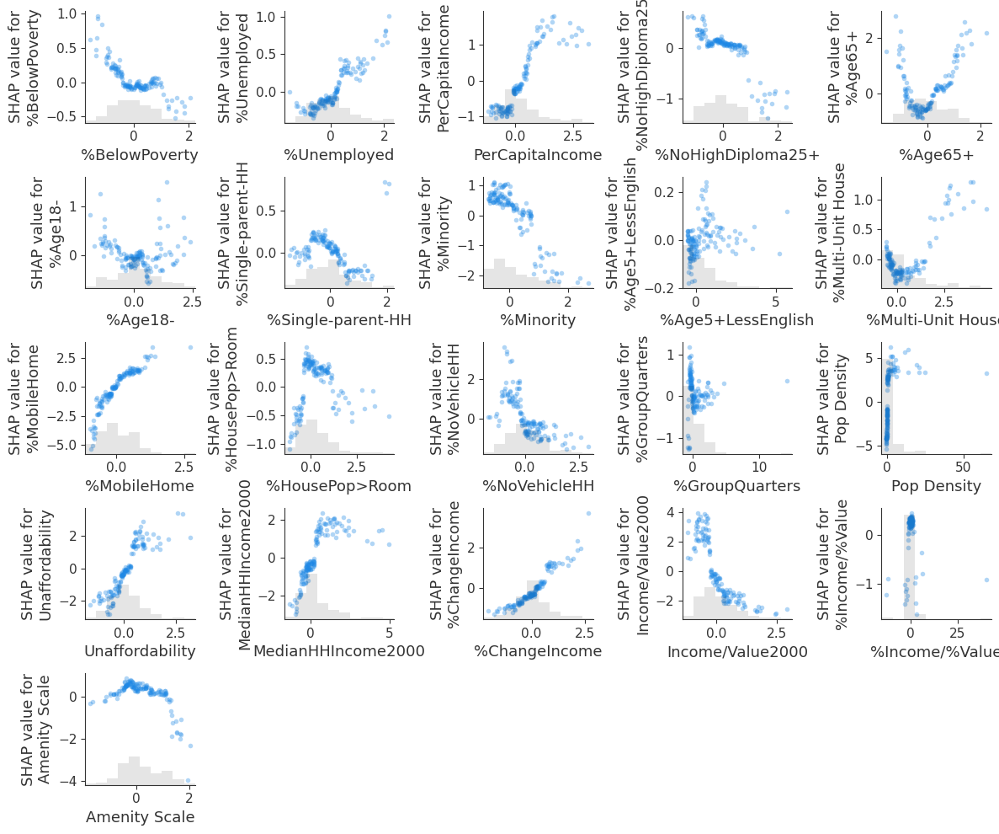

In [109]:
# Define all the features in your dataset
all_features = X_test.columns  # Replace with the features from your test set

# Set up the number of rows and columns for subplots
num_features = len(all_features)
cols = 5  # Number of columns in the subplot grid
rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# Create the subplots
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# Flatten axes for easy iteration
axes = axes.flatten()

# Generate SHAP dependence plots for each feature
for i, feature in enumerate(all_features):
    shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
#     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
#     shap.dependence_plot(
#         feature, shap_values.values, X_test, ax=axes[i], show=False
#     )
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# Turn off unused subplots if the number of features is less than total subplots
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# Show the final figure
plt.tight_layout()
plt.show()


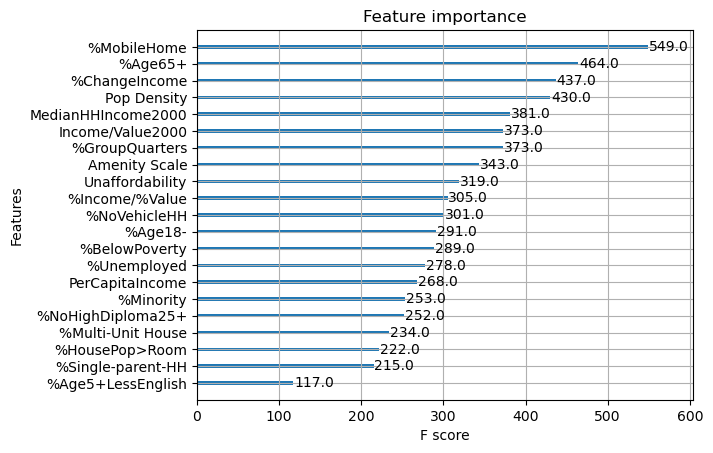

In [110]:
xgb.plot_importance(model)
plt.show()

In [111]:
r2 = r2_score(y_test, y_pred)

# RMSE (Root Mean Squared Error)
rmse = mean_squared_error(y_test, y_pred, squared=False)

# ME (Mean Error, aka Bias)
me = (y_test - y_pred).mean()

print(f"R²: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"Mean Error (ME): {me:.3f}")


R²: 0.638
RMSE: 6.237
Mean Error (ME): -0.298


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Results of XGBoost Tornado

Mean Squared Error: 22.706531465111063


100%|===================| 565/566 [00:24<00:00]        

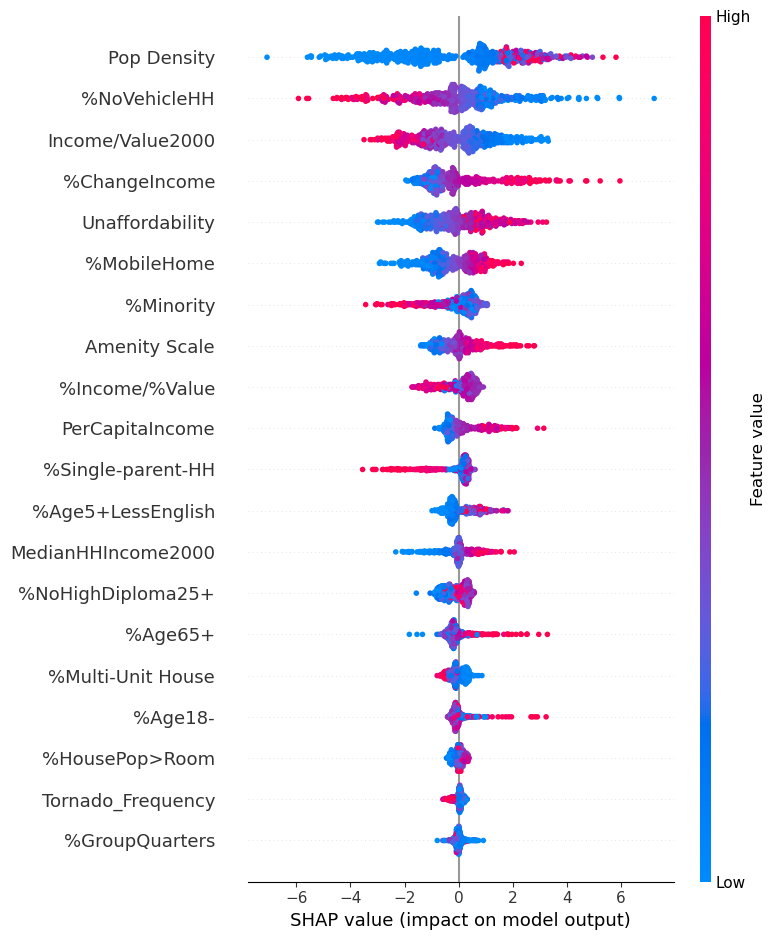

In [112]:
X = Tornado_Regression_data_used.drop(columns=['NMR', 'FIPS',
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ])
y = Tornado_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.01,
    max_depth=6,  
    subsample=0.8,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
shap.summary_plot(shap_values, X_test, show=False)
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\summary.png', dpi=600, bbox_inches='tight')
fig.clf()

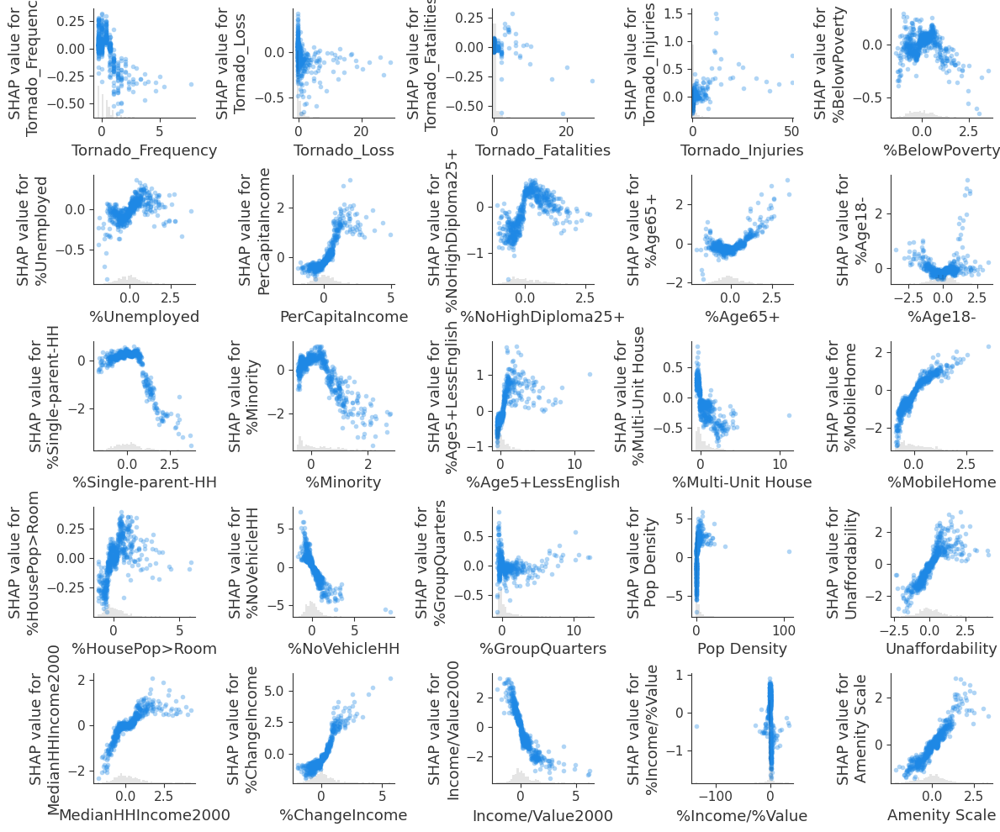

In [113]:
# Define all the features in your dataset
all_features = X_test.columns  # Replace with the features from your test set

# Set up the number of rows and columns for subplots
num_features = len(all_features)
cols = 5  # Number of columns in the subplot grid
rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# Create the subplots
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# Flatten axes for easy iteration
axes = axes.flatten()

# Generate SHAP dependence plots for each feature
for i, feature in enumerate(all_features):
    shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
#     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
#     shap.dependence_plot(
#         feature, shap_values.values, X_test, ax=axes[i], show=False
#     )
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# Turn off unused subplots if the number of features is less than total subplots
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# Show the final figure
plt.tight_layout()
plt.show()


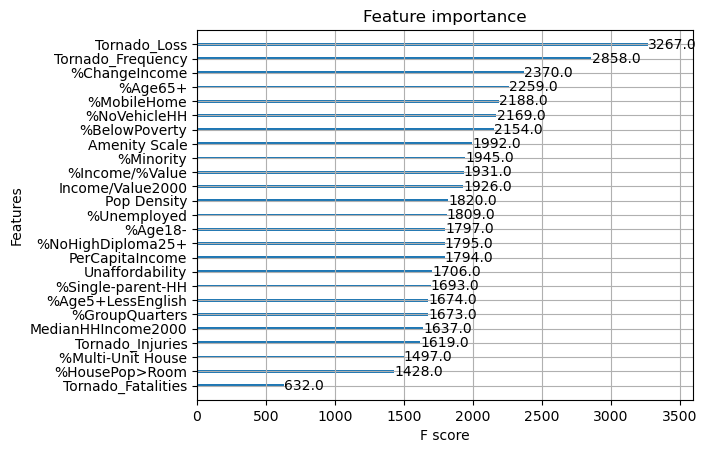

In [114]:
xgb.plot_importance(model)
plt.show()

In [115]:
r2 = r2_score(y_test, y_pred)

# RMSE (Root Mean Squared Error)
rmse = mean_squared_error(y_test, y_pred, squared=False)

# ME (Mean Error, aka Bias)
me = (y_test - y_pred).mean()

print(f"R²: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"Mean Error (ME): {me:.3f}")


R²: 0.713
RMSE: 4.765
Mean Error (ME): 0.490


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Remove Tornado Variables

Mean Squared Error: 22.19957231384448


100%|===================| 564/566 [00:24<00:00]        

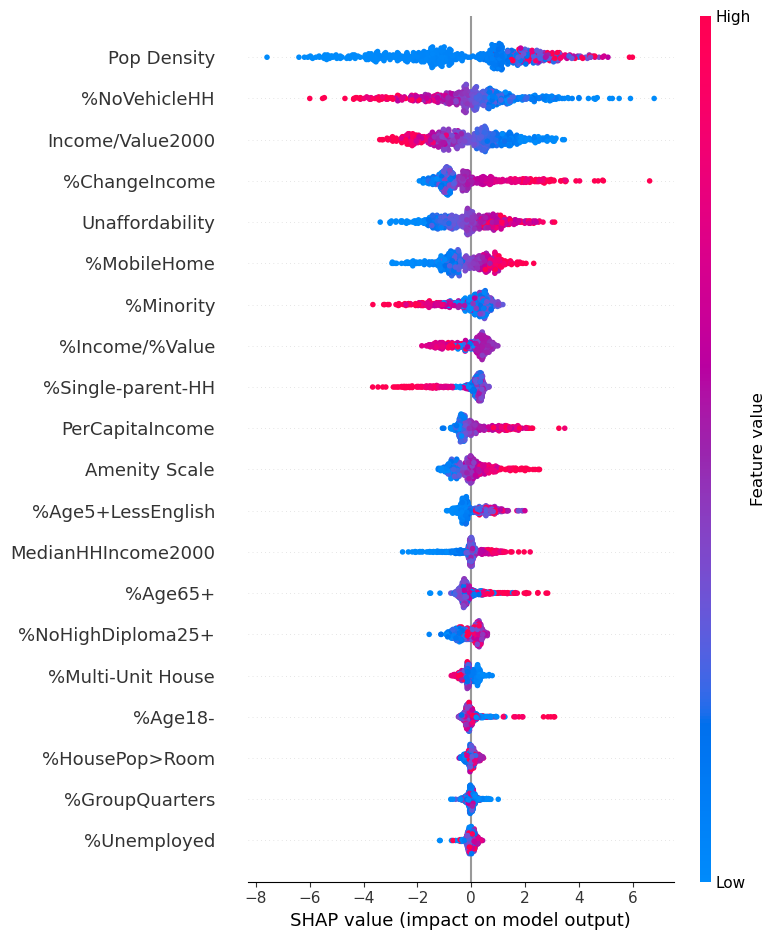

In [116]:
X = Tornado_Regression_data_used.drop(columns=['NMR', 'FIPS',
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ])
y = Tornado_Regression_data_used['NMR']

# # Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# # Train an XGBoost regression model
model = xgb.XGBRegressor(objective='reg:squarederror',
                             n_estimators=1000,  
    learning_rate=0.01,
    max_depth=6,  
    subsample=0.8,  
    colsample_bytree=0.8,
    reg_lambda=1,  
    reg_alpha=0,  
    missing=0)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Explain the model with SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot of feature importance
plt.figure()
shap.summary_plot(shap_values, X_test, show=False)
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\summary.png', dpi=600, bbox_inches='tight')
fig.clf()

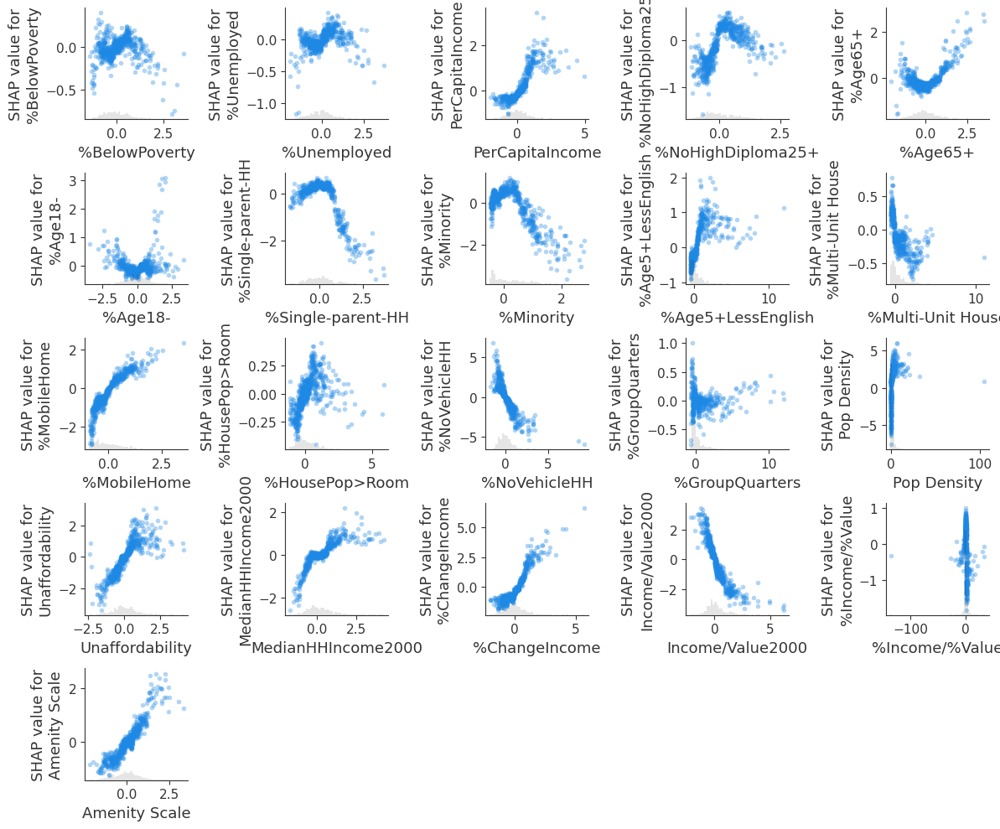

In [117]:
# Define all the features in your dataset
all_features = X_test.columns  # Replace with the features from your test set

# Set up the number of rows and columns for subplots
num_features = len(all_features)
cols = 5  # Number of columns in the subplot grid
rows = (num_features + cols - 1) // cols  # Calculate the number of rows needed

# Create the subplots
fig, axes = plt.subplots(rows, cols, figsize=(12, 10))

# Flatten axes for easy iteration
axes = axes.flatten()

# Generate SHAP dependence plots for each feature
for i, feature in enumerate(all_features):
    shap.plots.scatter(shap_values[:, feature],ax=axes[i], show=False, alpha=0.35)
#     sns.regplot(x=X_test[feature], y=shap_values[:, feature], ax=axes[i], scatter_kws={'s': 10}, line_kws={'color': 'red'})
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
#     shap.dependence_plot(
#         feature, shap_values.values, X_test, ax=axes[i], show=False
#     )
#     axes[i].set_title(f"SHAP Dependence for {feature}", fontsize=10)
    

# Turn off unused subplots if the number of features is less than total subplots
for j in range(len(all_features), len(axes)):
    axes[j].axis("off")
# plt.savefig(r'F:\LongMig2025\results\maps\xgboost\dependence.png', dpi=600, bbox_inches='tight')  # Specify the path and file name here

# Show the final figure
plt.tight_layout()
plt.show()


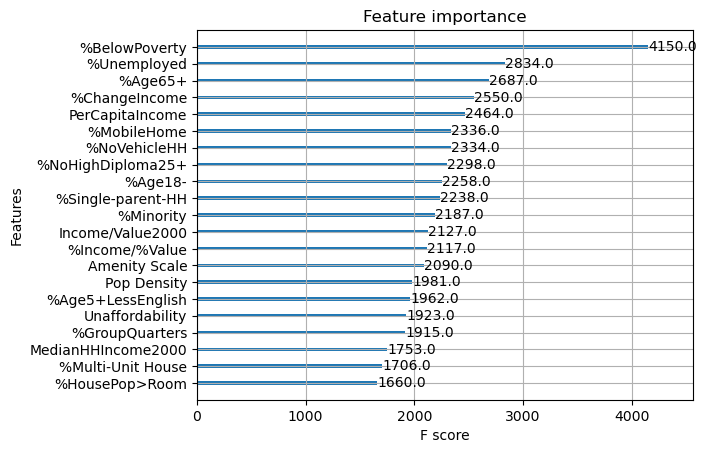

In [118]:
xgb.plot_importance(model)
plt.show()

In [119]:
r2 = r2_score(y_test, y_pred)

# RMSE (Root Mean Squared Error)
rmse = mean_squared_error(y_test, y_pred, squared=False)

# ME (Mean Error, aka Bias)
me = (y_test - y_pred).mean()

print(f"R²: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"Mean Error (ME): {me:.3f}")


R²: 0.720
RMSE: 4.712
Mean Error (ME): 0.470


C:\Users\xiang11\AppData\Local\ESRI\conda\envs\arcgispro_geo\geo1\Lib\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## VIF to exclude some factors

In [120]:
# Exclude specified columns
excluded_columns_flood = ["NMR", "FIPS"]
df_vif = Flood_Regression_data_used.drop(columns=excluded_columns_flood, errors="ignore")
# Recalculate VIF for remaining variables
vif_data_filtered = pd.DataFrame()
vif_data_filtered["Feature"] = df_vif.columns
vif_data_filtered["VIF"] = [variance_inflation_factor(df_vif.values, i) for i in range(df_vif.shape[1])]
vif_data_filtered.sort_values("VIF",ascending=False)

,Feature,VIF
32,MedianHHIncome2000,8.951664
18,PerCapitaIncome,7.241249
22,%Single-parent-HH,6.749588
23,%Minority,5.813709
16,%BelowPoverty,5.197198
21,%Age18-,4.161402
19,%NoHighDiploma25+,3.985132
28,%NoVehicleHH,3.825082
24,%Age5+LessEnglish,3.659186
25,%Multi-Unit House,3.433628


In [121]:
# Exclude specified columns
excluded_columns_hurricane = ["NMR", "FIPS"]
df_vif = Hurricane_Regression_data_used.drop(columns=excluded_columns_hurricane, errors="ignore")
# Recalculate VIF for remaining variables
vif_data_filtered = pd.DataFrame()
vif_data_filtered["Feature"] = df_vif.columns
vif_data_filtered["VIF"] = [variance_inflation_factor(df_vif.values, i) for i in range(df_vif.shape[1])]
vif_data_filtered.sort_values("VIF",ascending=False)

,Feature,VIF
18,PerCapitaIncome,13.358300
32,MedianHHIncome2000,12.963355
22,%Single-parent-HH,9.302144
21,%Age18-,8.066899
16,%BelowPoverty,6.084922
25,%Multi-Unit House,4.876097
23,%Minority,4.755833
19,%NoHighDiploma25+,4.380806
28,%NoVehicleHH,4.154870
30,Pop Density,3.844891


In [122]:
excluded_columns_hurricane = ["NMR", "FIPS","PerCapitaIncome"]
df_vif = Hurricane_Regression_data_used.drop(columns=excluded_columns_hurricane, errors="ignore")
# Recalculate VIF for remaining variables
vif_data_filtered = pd.DataFrame()
vif_data_filtered["Feature"] = df_vif.columns
vif_data_filtered["VIF"] = [variance_inflation_factor(df_vif.values, i) for i in range(df_vif.shape[1])]
vif_data_filtered.sort_values("VIF",ascending=False)

,Feature,VIF
21,%Single-parent-HH,9.246244
20,%Age18-,8.063279
31,MedianHHIncome2000,7.066342
16,%BelowPoverty,6.055818
22,%Minority,4.729729
24,%Multi-Unit House,4.323532
18,%NoHighDiploma25+,4.247103
27,%NoVehicleHH,4.059883
29,Pop Density,3.842613
19,%Age65+,3.388324


In [123]:
# Exclude specified columns
excluded_columns_wildfire = ["NMR", "FIPS"]
df_vif = Wildfire_Regression_data_used.drop(columns=excluded_columns_wildfire, errors="ignore")
# Recalculate VIF for remaining variables
vif_data_filtered = pd.DataFrame()
vif_data_filtered["Feature"] = df_vif.columns
vif_data_filtered["VIF"] = [variance_inflation_factor(df_vif.values, i) for i in range(df_vif.shape[1])]
vif_data_filtered.sort_values("VIF",ascending=False)

,Feature,VIF
32,MedianHHIncome2000,7.330862
18,PerCapitaIncome,6.533076
23,%Minority,5.609902
19,%NoHighDiploma25+,5.490138
24,%Age5+LessEnglish,5.274631
22,%Single-parent-HH,5.272383
21,%Age18-,4.148741
16,%BelowPoverty,3.589933
25,%Multi-Unit House,3.349965
20,%Age65+,3.046185


In [124]:
# Exclude specified columns
excluded_columns_tornado = ["NMR", "FIPS"]
df_vif = Tornado_Regression_data_used.drop(columns=excluded_columns_tornado, errors="ignore")
# Recalculate VIF for remaining variables
vif_data_filtered = pd.DataFrame()
vif_data_filtered["Feature"] = df_vif.columns
vif_data_filtered["VIF"] = [variance_inflation_factor(df_vif.values, i) for i in range(df_vif.shape[1])]
vif_data_filtered.sort_values("VIF",ascending=False)

,Feature,VIF
32,MedianHHIncome2000,8.884768
18,PerCapitaIncome,7.856871
22,%Single-parent-HH,7.784696
23,%Minority,5.746771
16,%BelowPoverty,5.605490
21,%Age18-,4.602309
19,%NoHighDiploma25+,3.909817
28,%NoVehicleHH,3.872459
20,%Age65+,3.448773
24,%Age5+LessEnglish,3.380320


## Regression
## Regression for Flood

In [125]:
disaster_list =['NMR', 
#     "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ]
excluded_columns_flood_list = excluded_columns_flood+ disaster_list

In [126]:
Regression_data_used_ols = Flood_Regression_data_used

y = Regression_data_used_ols['NMR']
X = Regression_data_used_ols.drop(columns=excluded_columns_flood_list)

# 1 OLS Regression
X_ols = sm.add_constant(X) 
model_ols = sm.OLS(y, X_ols).fit()
print("OLS (All Variables)")
print(model_ols.summary())

r_squared = model_ols.rsquared
y_pred = model_ols.predict(X_ols)
rmse = np.sqrt(mean_squared_error(y, y_pred))
me = np.mean(y - y_pred)
print("R-squared:", r_squared)
print("RMSE:", rmse)
print("ME:", me)

OLS (All Variables)
                            OLS Regression Results                            
Dep. Variable:                    NMR   R-squared:                       0.435
Model:                            OLS   Adj. R-squared:                  0.430
Method:                 Least Squares   F-statistic:                     84.51
Date:                Sat, 26 Jul 2025   Prob (F-statistic):          4.37e-317
Time:                        14:50:59   Log-Likelihood:                -8928.3
No. Observations:                2769   AIC:                         1.791e+04
Df Residuals:                    2743   BIC:                         1.806e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const           

## Regression for Hurricane

In [127]:
disaster_list =['NMR', 
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
#     "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ]
excluded_columns_hurricane_list = excluded_columns_hurricane+ disaster_list

In [128]:
Regression_data_used_ols = Hurricane_Regression_data_used

y = Regression_data_used_ols['NMR']
X = Regression_data_used_ols.drop(columns=excluded_columns_hurricane_list)

# 1 OLS Regression
X_ols = sm.add_constant(X) 
model_ols = sm.OLS(y, X_ols).fit()
print("OLS (All Variables)")
print(model_ols.summary())

r_squared = model_ols.rsquared
y_pred = model_ols.predict(X_ols)
rmse = np.sqrt(mean_squared_error(y, y_pred))
me = np.mean(y - y_pred)
print("R-squared:", r_squared)
print("RMSE:", rmse)
print("ME:", me)

OLS (All Variables)
                            OLS Regression Results                            
Dep. Variable:                    NMR   R-squared:                       0.559
Model:                            OLS   Adj. R-squared:                  0.543
Method:                 Least Squares   F-statistic:                     36.65
Date:                Sat, 26 Jul 2025   Prob (F-statistic):          1.71e-106
Time:                        14:50:59   Log-Likelihood:                -2390.0
No. Observations:                 720   AIC:                             4830.
Df Residuals:                     695   BIC:                             4944.
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const       

## Regression for Wildfire

In [129]:
disaster_list =['NMR', 
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
#     "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
    "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ]
excluded_columns_wildfire_list = excluded_columns_wildfire+ disaster_list

In [130]:
Regression_data_used_ols = Wildfire_Regression_data_used

y = Regression_data_used_ols['NMR']
X = Regression_data_used_ols.drop(columns=excluded_columns_wildfire_list)

# 1 OLS Regression
X_ols = sm.add_constant(X) 
model_ols = sm.OLS(y, X_ols).fit()
print("OLS (All Variables)")
print(model_ols.summary())

r_squared = model_ols.rsquared
y_pred = model_ols.predict(X_ols)
rmse = np.sqrt(mean_squared_error(y, y_pred))
me = np.mean(y - y_pred)
print("R-squared:", r_squared)
print("RMSE:", rmse)
print("ME:", me)

OLS (All Variables)
                            OLS Regression Results                            
Dep. Variable:                    NMR   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.461
Method:                 Least Squares   F-statistic:                     19.60
Date:                Sat, 26 Jul 2025   Prob (F-statistic):           1.74e-59
Time:                        14:50:59   Log-Likelihood:                -1820.3
No. Observations:                 545   AIC:                             3693.
Df Residuals:                     519   BIC:                             3804.
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const         

## Regression for Tornado

In [131]:
disaster_list =['NMR', 
    "Flood_Frequency","Flood_Loss","Flood_Fatalities","Flood_Injuries",
    "Hurricane_Frequency","Hurricane_Loss","Hurricane_Fatalities","Hurricane_Injuries",
    "Wildfire_Frequency","Wildfire_Loss","Wildfire_Fatalities","Wildfire_Injuries",
#     "Tornado_Frequency","Tornado_Loss","Tornado_Fatalities","Tornado_Injuries"
                                            ]
excluded_columns_tornado_list = excluded_columns_tornado+ disaster_list

In [132]:
Regression_data_used_ols = Tornado_Regression_data_used

y = Regression_data_used_ols['NMR']
X = Regression_data_used_ols.drop(columns=excluded_columns_tornado_list)

# 1 OLS Regression
X_ols = sm.add_constant(X) 
model_ols = sm.OLS(y, X_ols).fit()
print("OLS (All Variables)")
print(model_ols.summary())

r_squared = model_ols.rsquared
y_pred = model_ols.predict(X_ols)
rmse = np.sqrt(mean_squared_error(y, y_pred))
me = np.mean(y - y_pred)
print("R-squared:", r_squared)
print("RMSE:", rmse)
print("ME:", me)

OLS (All Variables)
                            OLS Regression Results                            
Dep. Variable:                    NMR   R-squared:                       0.507
Model:                            OLS   Adj. R-squared:                  0.501
Method:                 Least Squares   F-statistic:                     91.88
Date:                Sat, 26 Jul 2025   Prob (F-statistic):          2.69e-320
Time:                        14:50:59   Log-Likelihood:                -7231.5
No. Observations:                2262   AIC:                         1.452e+04
Df Residuals:                    2236   BIC:                         1.466e+04
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const           